assign temperature range assertions, like would be found in local/flattened_n4l_temperature_components.tsv, agaisnt the minimum and maximum boundaries in metpo.owl

remove temperature limits for "tolerants"... that will lead to many fewer range assignments

why are there N4L and NCBI taxa in there now?

need better review of  conflicts, which should lead to modified parsing

check which taxa didn't get any assignments

Doesn't include facultative psychrophile (0-30?) from KG microbe yet



N4L temperature predicates, after normalization by

- metpo/n4l_tables_to_quads.ipynb -> local/n4l-tables.nq -> multiple GrapDB named graphs
    - see also assets/n4l_predicate_mapping_normalization.csv
- sparql/temperature_query.rq -> local/n4l-temperature.csv
- metpo/classify_temperature_values.ipynb -> local/n4l-temperature.ttl and local/n4l-temperature-un-parsed.csv
- sparql/flatten_n4l_parsing_components.rq -> local/flattened_n4l_temperature_components.tsv


* <http://example.com/n4l/temperature>
    * handled by metpo/classify_temperature_values.ipynb, sparql/report_parsed_temperature_categories.rq
* <http://example.com/n4l/temperature_(grows)>
* <http://example.com/n4l/temperature_optimum>
* <http://example.com/n4l/temperature_range>
* <http://example.com/n4l/temperature_(does_not_grow)>

What can be inferred from another temperature assertion?

* Delta can always be calculated from the range.
* Range can be inferred from delta plus one limit (min or max).
* Optimum is generally measured, not inferred.
* Categorical labels are assigned based on optimum (and sometimes range).
* Psychrotolerant/thermotolerant specifically require both optimum and range for accurate assignment.



In [1]:
import os
import re
from typing import List, Tuple, Dict, Optional

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from pathlib import Path

import xml.etree.ElementTree as ET
from xml.dom import minidom

In [2]:
notebook_dir = Path().resolve()
project_root = notebook_dir if (notebook_dir / "Makefile").exists() else notebook_dir.parent
# assets_dir = project_root / "assets"
# local_dir = project_root / "local"

In [3]:
PROTOLOG_DIR = project_root / "assets" / "N4L_phenotypic_ontology_2016" / "extracted_protologs_2013" / "protologs"

protologs_set = set(os.listdir(PROTOLOG_DIR))

In [4]:
classes_csv = project_root / "local" / "metpo_classes_temperature_limits.csv"
observations_tsv = project_root / "local" / "flattened_n4l_temperature_components.tsv"
output_tsv = project_root / "local" / "categorized_temperature_range_assignments.tsv"
summary_tsv = project_root / "local" / "categorized_temperature_range_summary.tsv"

In [5]:
intra_conflict_threshold = 8
inter_conflict_threshold = 1

In [6]:
overlap_threshold = 0.9

In [7]:
observations_df = pd.read_csv(observations_tsv, sep='\t')

In [8]:
# Load inputs
classes_df = pd.read_csv(classes_csv)


In [9]:
observations_df = observations_df[['?subject', '?predicate',
                                   '?minimum_value', '?maximum_value', '?spot_value',
                                   '?unit']]

In [10]:
observations_df = observations_df.drop_duplicates()


In [11]:
observations_df = observations_df[
    observations_df[['?minimum_value', '?maximum_value', '?spot_value']]
    .notna().any(axis=1)
]


In [12]:
# Clean class definitions
classes_df = classes_df.rename(columns={
    "s": "class_iri",
    "l": "class_label",
    "min": "class_min",
    "max": "class_max"
})

In [13]:
observations_df = observations_df.rename(columns=lambda c: c.lstrip('?'))

In [14]:
for col in ['minimum_value', 'maximum_value', 'spot_value']:
    observations_df[col] = pd.to_numeric(observations_df[col], errors='coerce')


In [15]:
# Remove angle brackets for subject matching
observations_df['subject'] = observations_df['subject'].str.strip('<>')
observations_df['predicate'] = observations_df['predicate'].str.strip('<>')


In [16]:
# Convert numeric values if not done already
for col in ['minimum_value', 'maximum_value', 'spot_value']:
    observations_df[col] = pd.to_numeric(observations_df[col], errors='coerce')


In [17]:
observations_df

,subject,predicate,minimum_value,maximum_value,spot_value,unit
0,http://example.com/n4l/ex.10622_nm.10622,http://example.com/n4l/temperature_optimum,NaN,NaN,37.0,Cel
2,http://example.com/n4l/nm.10007,http://example.com/n4l/temperature_(does_not_g...,NaN,NaN,4.0,Cel
4,http://example.com/n4l/nm.10007,http://example.com/n4l/temperature_(does_not_g...,NaN,NaN,37.0,Cel
6,http://example.com/n4l/nm.10007,http://example.com/n4l/temperature_(grows),NaN,NaN,10.0,Cel
7,http://example.com/n4l/nm.10007,http://example.com/n4l/temperature_(grows),NaN,NaN,36.0,Cel
...,...,...,...,...,...,...
31467,http://purl.obolibrary.org/obo/NCBITaxon_991,http://example.com/n4l/temperature_optimum,NaN,NaN,20.0,Cel
31468,http://purl.obolibrary.org/obo/NCBITaxon_991,http://example.com/n4l/temperature_optimum,20.0,30.0,NaN,Cel
31475,http://purl.obolibrary.org/obo/NCBITaxon_99286,http://example.com/n4l/temperature_range,0.0,24.0,NaN,Cel
31479,http://purl.obolibrary.org/obo/NCBITaxon_995,http://example.com/n4l/temperature_optimum,18.0,30.0,NaN,Cel


may want to add facultative psychrophile to match KG-Microbe

In [18]:
# -----------------------------------------------
# Define class groupings
# -----------------------------------------------

# Group 1: growth category classes (e.g., thermophile)
growth_classes = classes_df[classes_df['class_label'].isin([
    "psychrophile", "psychrotolerant", "mesophile",
    "thermotolerant", "thermophile", "hyperthermophile",
    "extreme thermophile", "extreme hyperthermophile"
])].copy()

In [19]:
# Group 2: temperature optimum and range subclasses
subrange_classes = classes_df[classes_df['class_label'].str.startswith("temperature optimum") |
                              classes_df['class_label'].str.startswith("temperature range")].copy()


In [20]:
# Group 3: delta range classes
delta_classes = classes_df[classes_df['class_label'].str.startswith("temperature delta")].copy()


In [21]:
# Count non-null values across minimum, maximum, spot (melted)
observation_counts = (
    observations_df[['subject', 'minimum_value', 'maximum_value', 'spot_value']]
    .melt(id_vars='subject', value_name='value')
    .dropna(subset=['value'])
    .groupby('subject')
    .size()
    .reset_index(name='observation_count')
)

# Count unique predicates per subject
predicate_counts = (
    observations_df[['subject', 'predicate']]
    .drop_duplicates()
    .groupby('subject')
    .size()
    .reset_index(name='predicate_count')
)

# ✅ Merge them into one DataFrame
summary = pd.merge(observation_counts, predicate_counts, on='subject', how='outer').fillna(0)
summary['observation_count'] = summary['observation_count'].astype(int)
summary['predicate_count'] = summary['predicate_count'].astype(int)

summary['magnitude'] = np.sqrt(summary['observation_count'] ** 2 + summary['predicate_count'] ** 2)

In [22]:
PREDICATE_COLORS = {
    'temperature_optimum': 'green',
    'temperature_range': 'yellow',
    'temperature_(grows)': 'orange',
    'temperature_(does_not_grow)': 'red'
}


In [23]:
def get_predicate_color(predicate_iri):
    short = predicate_iri.split('/')[-1]
    return PREDICATE_COLORS.get(short, 'gray')

In [24]:

def plot_temperature_profile(subject_id=None, observations_df=None, classes_df=None):
    has_obs = observations_df is not None and subject_id is not None
    has_classes = classes_df is not None

    if not has_obs and not has_classes:
        raise ValueError("Must provide at least a subject + observations_df or a classes_df.")

    fig, ax = plt.subplots(figsize=(10, 6))
    y_labels = []
    y_positions = []
    y_pos = 0

    # === Plot subject observations ===
    if has_obs:
        sub = observations_df[observations_df['subject'] == subject_id].copy()
        if sub.empty:
            print(f"No observations found for subject: {subject_id}")
        else:
            spot_agg = (
                sub[pd.notnull(sub['spot_value'])]
                .groupby(['predicate', 'spot_value'])
                .size()
                .reset_index(name='count')
            )

            for pred_short in reversed(PREDICATE_COLORS):
                full_preds = [p for p in sub['predicate'].unique() if p.endswith(pred_short)]
                for pred in full_preds:
                    color = get_predicate_color(pred)

                    # Spot values
                    spots = spot_agg[spot_agg['predicate'] == pred]
                    if not spots.empty:
                        for _, row in spots.iterrows():
                            ax.scatter(row['spot_value'], y_pos, color=color,
                                       s=30 + 20 * row['count'], zorder=5)
                        y_labels.append(f"{pred_short} (spot)")
                        y_positions.append(y_pos)
                        y_pos += 1

                    # Range values
                    ranges = sub[
                        (sub['predicate'] == pred) &
                        pd.notnull(sub['minimum_value']) &
                        pd.notnull(sub['maximum_value'])
                        ]
                    if not ranges.empty:
                        range_group = (
                            ranges.groupby(['minimum_value', 'maximum_value'])
                            .size()
                            .reset_index(name='count')
                        )
                        for _, row in range_group.iterrows():
                            ax.plot([row['minimum_value'], row['maximum_value']], [y_pos, y_pos],
                                    color=color, lw=1 + row['count'], alpha=0.6)
                            ax.scatter([row['minimum_value'], row['maximum_value']], [y_pos, y_pos],
                                       color=color, s=20 + 10 * row['count'])
                        y_labels.append(f"{pred_short} (range)")
                        y_positions.append(y_pos)
                        y_pos += 1

    # === Plot target classes ===
    if has_classes:
        class_df = classes_df[
            ~classes_df['class_label'].str.startswith("temperature delta")
        ].copy()

        # Sorting keys
        class_df['sort_min'] = class_df['class_min'].fillna(-np.inf)
        class_df['sort_max'] = class_df['class_max'].fillna(np.inf)

        # Grouping logic
        is_range = class_df['class_label'].str.contains("temperature range", case=False)
        is_optimum = class_df['class_label'].str.contains("temperature optimum", case=False)

        df_range = class_df[is_range].sort_values(by=['sort_min', 'sort_max'])
        df_optimum = class_df[is_optimum & ~is_range].sort_values(by=['sort_min', 'sort_max'])
        df_other = class_df[~is_range & ~is_optimum].sort_values(by=['sort_min', 'sort_max'])

        sorted_class_df = pd.concat([df_range, df_optimum, df_other], ignore_index=True)

        for _, row in sorted_class_df.iterrows():
            label = row['class_label']
            min_val = row['class_min']
            max_val = row['class_max']
            cy = y_pos

            if pd.notnull(min_val) and pd.notnull(max_val):
                ax.plot([min_val, max_val], [cy, cy], color='black', lw=2)
                ax.scatter([min_val, max_val], [cy, cy], color='black', zorder=5)
            elif pd.notnull(min_val) and pd.isnull(max_val):
                ax.text(min_val, cy, '▶', fontsize=12, ha='left', va='center', color='black')
            elif pd.notnull(max_val) and pd.isnull(min_val):
                ax.text(max_val, cy, '◀', fontsize=12, ha='right', va='center', color='black')

            y_labels.append(label)
            y_positions.append(cy)
            y_pos += 1

    # === Final layout ===
    if y_labels:
        ax.set_yticks(y_positions)
        ax.set_yticklabels(y_labels)

    ax.set_xlabel("Temperature (°C)")
    title = "Temperature Profile"
    if subject_id:
        title += f" for {subject_id}"
    ax.set_title(title)
    ax.grid(True)
    plt.tight_layout()
    plt.show()


In [25]:

def assign_temperature_classes_advanced(
        subject_id,
        observations_df,
        classes_df,
        overlap_threshold=0.5,
        return_all_matches=True
):
    def get_range(row):
        if pd.notnull(row.get("minimum_value")) and pd.notnull(row.get("maximum_value")):
            return row["minimum_value"], row["maximum_value"]
        elif pd.notnull(row.get("spot_value")):
            return row["spot_value"], row["spot_value"]
        else:
            return None

    obs = observations_df[observations_df["subject"] == subject_id]
    if obs.empty:
        return pd.DataFrame()

    predicate_intervals = {
        "temperature_optimum": [],
        "temperature_range": [],
        "temperature_(grows)": [],
        "temperature_(does_not_grow)": []
    }

    for _, row in obs.iterrows():
        predicate = row["predicate"].split("/")[-1]
        if predicate in predicate_intervals:
            r = get_range(row)
            if r:
                predicate_intervals[predicate].append(r)

    all_positive_ranges = predicate_intervals["temperature_range"] + predicate_intervals["temperature_(grows)"] + \
                          predicate_intervals["temperature_optimum"]
    if all_positive_ranges:
        min_temp = min(r[0] for r in all_positive_ranges)
        max_temp = max(r[1] for r in all_positive_ranges)
        delta = max_temp - min_temp
    else:
        delta = None

    def tag_class_group(label):
        if "delta" in label.lower():
            return "delta"
        elif "range" in label.lower():
            return "range"
        elif "optimum" in label.lower():
            return "optimum"
        else:
            return "categorical"

    results = []
    class_df = classes_df.copy()
    class_df["group"] = class_df["class_label"].apply(tag_class_group)
    class_df["span"] = class_df["class_max"].fillna(np.inf) - class_df["class_min"].fillna(-np.inf)

    for _, cls in class_df.iterrows():
        label = cls["class_label"]
        iri = cls.get("class_iri")
        group = cls["group"]
        cmin = cls["class_min"] if pd.notnull(cls["class_min"]) else -np.inf
        cmax = cls["class_max"] if pd.notnull(cls["class_max"]) else np.inf
        span = cls["span"]

        matched = False
        excluded = False
        matched_range = None
        overlap_fraction = 0

        if group == "optimum":
            candidates = predicate_intervals["temperature_optimum"]
        elif group in ["range", "categorical"]:
            candidates = predicate_intervals["temperature_range"] + predicate_intervals["temperature_(grows)"]
        elif group == "delta" and delta is not None:
            if cmin <= delta <= cmax:
                matched = True
                matched_range = (delta, delta)
                overlap_fraction = 1.0
        else:
            candidates = []

        for rmin, rmax in candidates:
            overlap_min = max(cmin, rmin)
            overlap_max = min(cmax, rmax)
            overlap_len = max(0, overlap_max - overlap_min)
            rlen = max(1e-6, rmax - rmin)
            frac = overlap_len / rlen
            if frac >= overlap_threshold:
                matched = True
                matched_range = (rmin, rmax)
                overlap_fraction = frac
                break

        if matched and group != "delta":
            for rmin, rmax in predicate_intervals["temperature_(does_not_grow)"]:
                if max(cmin, rmin) < min(cmax, rmax):
                    excluded = True
                    break

        if matched:
            results.append({
                "subject": subject_id,
                "class_label": label,
                "class_iri": iri,
                "class_group": group,
                "assignment": "match" if not excluded else "excluded",
                "source_range": matched_range,
                "class_range": (cmin, cmax),
                "overlap_fraction": overlap_fraction,
                "class_span": span
            })

    result_df = pd.DataFrame(results)
    if not return_all_matches:
        final = []
        for group in result_df["class_group"].unique():
            subset = result_df[(result_df["class_group"] == group) & (result_df["assignment"] == "match")]
            if not subset.empty:
                final.append(subset.loc[subset["class_span"].idxmin()])
        return pd.DataFrame(final)

    return result_df


In [26]:
assignments = assign_temperature_classes_advanced(
    "http://example.com/n4l/rid.2547_nm.11491",
    observations_df,
    classes_df,
    overlap_threshold=overlap_threshold,
    return_all_matches=True
)

In [27]:
unique_subjects = observations_df['subject'].unique()

In [28]:
assignments = pd.concat([
    assign_temperature_classes_advanced(
        subject_id=subj,
        observations_df=observations_df,
        classes_df=classes_df,
        overlap_threshold=overlap_threshold,
        return_all_matches=True
    )
    for subj in unique_subjects
], ignore_index=True)

In [29]:
assignments

,subject,class_label,class_iri,class_group,assignment,source_range,class_range,overlap_fraction,class_span
0,http://example.com/n4l/nm.10007,temperature delta mid2,https://w3id.org/metpo/1000486,delta,match,"(26.0, 26.0)","(20.0, 30.0)",1.0,10.0
1,http://example.com/n4l/nm.10011,temperature delta very low,https://w3id.org/metpo/1000483,delta,match,"(2.0, 2.0)","(1.0, 5.0)",1.0,4.0
2,http://example.com/n4l/nm.10019,hyperthermophile,https://w3id.org/metpo/1000161,categorical,match,"(85.0, 98.0)","(80.0, 115.0)",1.0,35.0
3,http://example.com/n4l/nm.10019,temperature delta high,https://w3id.org/metpo/1000487,delta,match,"(85.0, 98.0)","(30.0, inf)",1.0,inf
4,http://example.com/n4l/nm.10019,temperature delta mid1,https://w3id.org/metpo/1000485,delta,match,"(13.0, 13.0)","(10.0, 20.0)",1.0,10.0
...,...,...,...,...,...,...,...,...,...
11903,http://purl.obolibrary.org/obo/NCBITaxon_99286,thermotolerant,https://w3id.org/metpo/1000337,categorical,match,"(0.0, 24.0)","(0.0, 50.0)",1.0,50.0
11904,http://purl.obolibrary.org/obo/NCBITaxon_995,psychrotolerant,https://w3id.org/metpo/1000336,categorical,match,"(10.0, 40.0)","(0.0, 45.0)",1.0,45.0
11905,http://purl.obolibrary.org/obo/NCBITaxon_995,temperature delta high,https://w3id.org/metpo/1000487,delta,match,"(30.0, 30.0)","(30.0, inf)",1.0,inf
11906,http://purl.obolibrary.org/obo/NCBITaxon_995,temperature delta mid2,https://w3id.org/metpo/1000486,delta,match,"(30.0, 30.0)","(20.0, 30.0)",1.0,10.0


In [30]:
def detect_temperature_conflicts(observations_df: pd.DataFrame) -> pd.DataFrame:
    def extract_intervals(df: pd.DataFrame) -> List[Tuple[float, float]]:
        ranges = []
        for _, row in df.iterrows():
            if pd.notnull(row.get("minimum_value")) and pd.notnull(row.get("maximum_value")):
                ranges.append((row["minimum_value"], row["maximum_value"]))
            elif pd.notnull(row.get("spot_value")):
                v = row["spot_value"]
                ranges.append((v, v))
        return ranges

    def compute_spread(intervals: List[Tuple[float, float]]) -> float:
        if not intervals:
            return 0.0
        mins, maxs = zip(*intervals)
        return max(maxs) - min(mins)

    def count_disjoint_clusters(intervals: List[Tuple[float, float]], proximity=2.0) -> int:
        if not intervals:
            return 0
        sorted_intervals = sorted(intervals, key=lambda x: x[0])
        clusters = 1
        _, current_end = sorted_intervals[0]
        for start, end in sorted_intervals[1:]:
            if start > current_end + proximity:
                clusters += 1
                current_end = end
            else:
                current_end = max(current_end, end)
        return clusters

    def has_overlap(a: Tuple[float, float], b: Tuple[float, float], buffer=1.0) -> bool:
        return max(a[0], b[0]) - min(a[1], b[1]) <= buffer

    summaries = []
    for subject, group in observations_df.groupby("subject"):
        summary = {"subject": subject}
        notes = []

        # Per-predicate intra-conflict analysis (excluding does_not_grow)
        intra_scores = []
        for predicate in ["temperature_optimum", "temperature_range", "temperature_(grows)"]:
            pred_group = group[group["predicate"].str.endswith(predicate)]
            intervals = extract_intervals(pred_group)
            spread = compute_spread(intervals)
            clusters = count_disjoint_clusters(intervals)

            summary[f"{predicate}_spread"] = spread
            summary[f"{predicate}_clusters"] = clusters
            intra_scores.append(clusters + spread / 10)

            if clusters > 1:
                notes.append(f"{predicate} has {clusters} disjoint clusters")
            if spread > 30:
                notes.append(f"{predicate} spread is wide ({spread:.1f}°C)")

        summary["intra_conflict_score"] = sum(intra_scores)

        # Inter-predicate conflict: grows vs does_not_grow
        grows = extract_intervals(group[group["predicate"].str.endswith("temperature_(grows)")])
        not_grows = extract_intervals(group[group["predicate"].str.endswith("temperature_(does_not_grow)")])
        inter_score = 0
        for g in grows:
            for ng in not_grows:
                if has_overlap(g, ng, buffer=2.0):
                    inter_score += 1
                    notes.append(f"Grow {g} conflicts with NoGrow {ng}")

        summary["inter_conflict_score"] = inter_score
        summary["conflict_notes"] = "; ".join(notes) if notes else "None"
        summaries.append(summary)

    return pd.DataFrame(summaries)


In [31]:
temperature_conflicts = detect_temperature_conflicts(observations_df)

In [32]:
# Merge the counts and conflicts
full_summary = pd.merge(
    summary,
    temperature_conflicts,
    on='subject',
    how='left'  # so no subject gets dropped
)

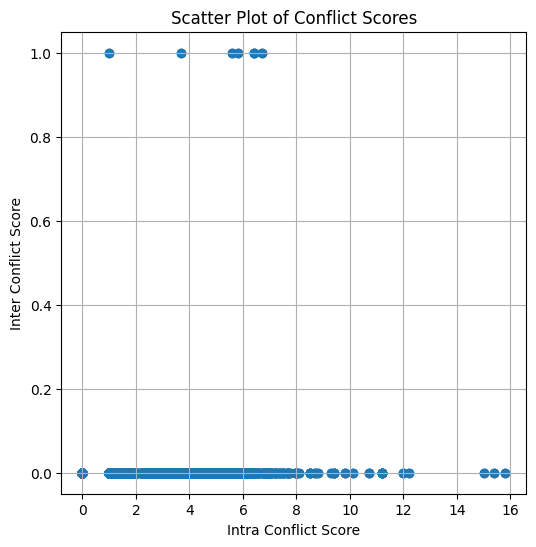

In [33]:
# Assuming your DataFrame is called df
plt.figure(figsize=(6, 6))
plt.scatter(full_summary["intra_conflict_score"], full_summary["inter_conflict_score"], alpha=0.7)
plt.xlabel("Intra Conflict Score")
plt.ylabel("Inter Conflict Score")
plt.title("Scatter Plot of Conflict Scores")
plt.grid(True)
plt.show()

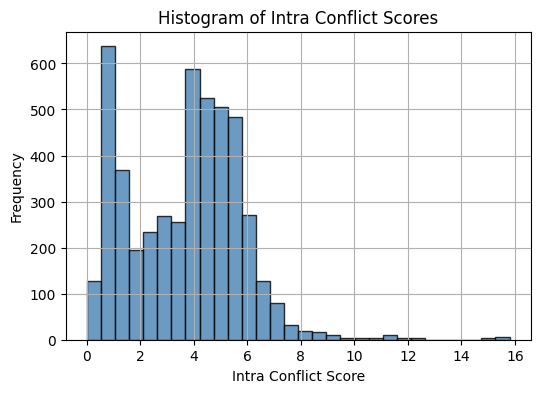

In [34]:
plt.figure(figsize=(6, 4))
plt.hist(full_summary["intra_conflict_score"], bins=30, color="steelblue", edgecolor="black", alpha=0.8)
plt.xlabel("Intra Conflict Score")
plt.ylabel("Frequency")
plt.title("Histogram of Intra Conflict Scores")
plt.grid(True)
plt.show()

In [35]:
high_conflict_df = full_summary.query(
    f"intra_conflict_score >= {intra_conflict_threshold} or inter_conflict_score >= {inter_conflict_threshold}")


In [36]:
def extract_ids(subject_iri: str) -> Tuple[str, str]:
    rid_match = re.search(r"(rid\.\d+)", subject_iri)
    nm_match = re.search(r"(nm\.\d+)", subject_iri)
    rid = rid_match.group(1) if rid_match else "?"
    nm = nm_match.group(1) if nm_match else "?"
    return rid, nm

In [37]:
def find_protolog_files(rid: str, nm: str, filenames: set) -> Dict[str, Optional[str] or List[str]]:
    exact = f"{rid}_{nm}.xml" if rid != "?" and nm != "?" else None
    exact_match = exact if exact in filenames else None

    partial_matches = []

    # Compile strict regex: match only if ID is surrounded by (_) or (.) or start/end of string
    rid_pattern = re.compile(rf"(^|[_\.]){re.escape(rid)}([_\.]|$)") if rid != "?" else None
    nm_pattern = re.compile(rf"(^|[_\.]){re.escape(nm)}([_\.]|$)") if nm != "?" else None

    for f in filenames:
        if exact_match and f == exact_match:
            continue
        if ((rid_pattern and rid_pattern.search(f)) or
                (nm_pattern and nm_pattern.search(f))):
            partial_matches.append(f)

    return {
        "exact": exact_match,
        "partial": sorted(partial_matches)
    }


In [38]:
def load_protolog_content_pretty(filepath: str) -> Optional[str]:
    try:

        ns = {"n4l": "http://namesforlife.com/ns/protolog"}
        ET.register_namespace('', ns["n4l"])

        tree = ET.parse(filepath)
        root = tree.getroot()
        content = root.find(".//{http://namesforlife.com/ns/protolog}content")

        if content is not None:
            # Convert ElementTree element to string
            rough_string = ET.tostring(content, encoding="utf-8")
            # Parse with minidom for pretty print
            reparsed = minidom.parseString(rough_string)
            return reparsed.toprettyxml(indent="  ")
        else:
            return "(no <content> node found)"
    except Exception as e:
        print(f"(Failed to load {filepath}: {e})")
        return None


In [39]:
def display_subject_protolog(
        subject_iri: str,
        intra_score: float,
        inter_score: float,
        observations_df: pd.DataFrame,
        classes_df: pd.DataFrame
):
    rid, nm = extract_ids(subject_iri)
    print(f"## {subject_iri}")
    print(f"  - Reference ID: {rid}")
    print(f"  - Taxon Name ID: {nm}")
    print(f"  - Intra Conflict Score: {intra_score}")
    print(f"  - Inter Conflict Score: {inter_score}")

    plot_temperature_profile(subject_id=subject_iri, observations_df=observations_df, classes_df=classes_df)

    match_info = find_protolog_files(rid, nm, protologs_set)
    if match_info["exact"]:
        print(f"\n✅ Exact match: {match_info['exact']}")
        path = os.path.join(PROTOLOG_DIR, match_info["exact"])
        xml_text = load_protolog_content_pretty(path)
        if xml_text:
            print("\n--- Protolog XML ---")
            print(xml_text)
    elif match_info["partial"]:
        print(f"\n🟡 Partial matches for {rid or '[none]'}, {nm or '[none]'}:")
        for fname in match_info["partial"]:
            print(f"   - {fname}")
        for fname in match_info["partial"]:
            path = os.path.join(PROTOLOG_DIR, fname)
            xml_text = load_protolog_content_pretty(path)
            if xml_text:
                print("\n--- Protolog XML ---")
                print(xml_text)
                break
    else:
        print("\n(no protolog XML found)")

## http://example.com/n4l/nm.10007
  - Reference ID: ?
  - Taxon Name ID: nm.10007
  - Intra Conflict Score: 5.6
  - Inter Conflict Score: 1


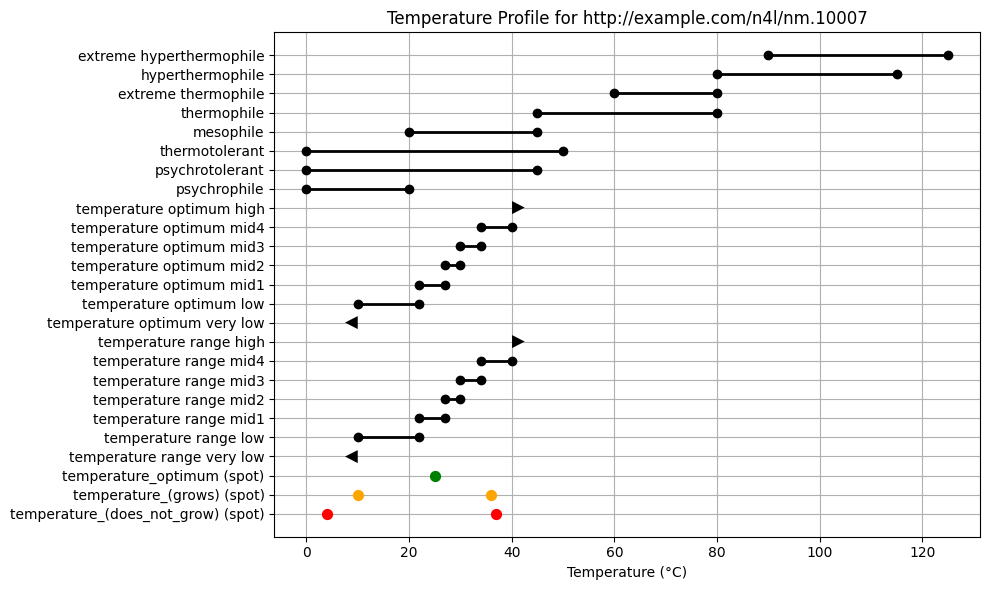


🟡 Partial matches for ?, nm.10007:
   - rid.5785_nm.10007.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Algoriphagus terrigena</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Algoriphagus terrigena</em>
       (ter.ri.ge′na. L. masc. or fem. n. 
      <em>terrigena</em>
       child of the earth, referring to the isolation of the type strain from soil).
    </s>
  </p>
  <p class="description">
    <s>Cells are Gram-negative, non-spore-forming, non-flagellated short rods or rods (0·4–0·6×0·8–2·5 μm); a few cells greater than 50 μm in length are also observed.</s>
    <s>Colonies on MA are circular, convex, smooth, glistening, light orange in colour and 1·0–2·0 mm in diameter after incubation for 7 days at 25 °C.</s>
    <s>Optimal growth occurs at 25 °C; growth occurs at 10 and 36 °C, but not at 4 or 37 °C.</s>
    <s>Optimal pH for growth

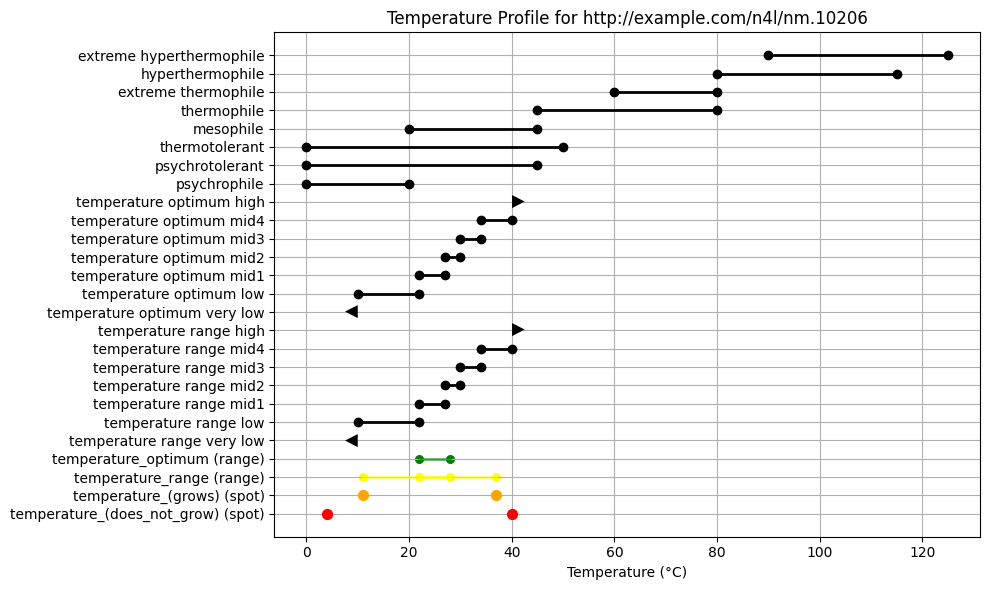


🟡 Partial matches for ?, nm.10206:
   - rid.6074_nm.10206.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Catenulispora acidiphila</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Catenulispora acidiphila</em>
       (a.ci.di′phi.la. N.L. neut. n. 
      <em>acidum</em>
       acid; Gr. adj. 
      <em>philos</em>
       loving; N.L. fem. adj. 
      <em>acidiphila</em>
       acid-loving).
    </s>
  </p>
  <p class="description">
    <s>Chemotaxonomic and general characteristics are the same as given above for the genus.</s>
    <s>Acidophilic: grows well in a pH range from 4.3 to 6.8, optimal around 6.0.</s>
    <s>Mesophilic: best growth occurs at 22–28 °C, but significant growth can also be observed at 11 and 37 °C; no growth occurs at 4 or 40 °C.</s>
    <s>Aerial hyphae are relatively short, straight to flexuous and produce chains of m

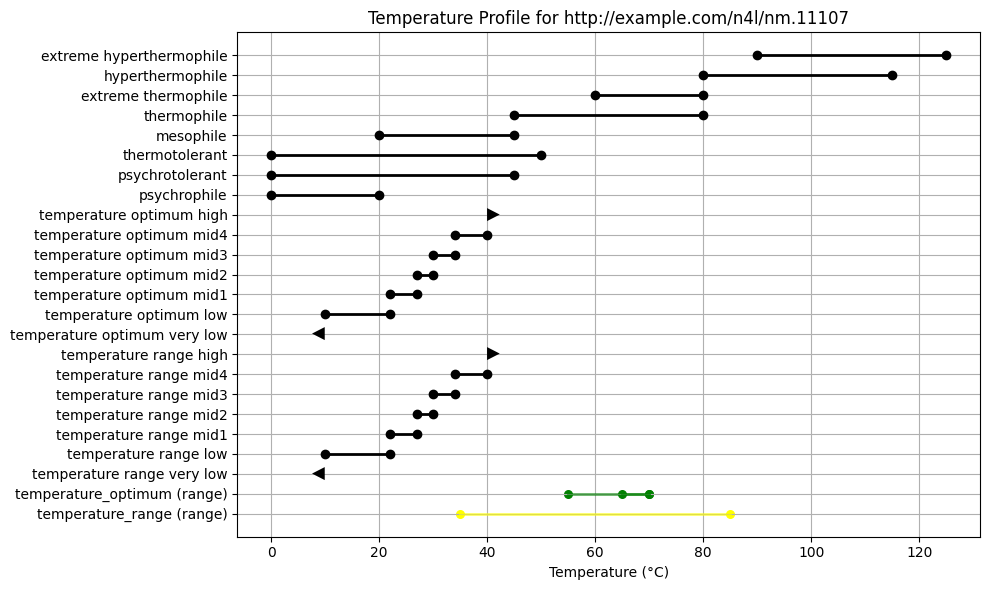


🟡 Partial matches for ?, nm.11107:
   - rid.2759_nm.11107.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>Emendation of the species description of Thermoanaerobacter brockii Zeikus, Hegge, and Anderson 1979; Lee, Jain, Lee, Lowe, and Zeikus 1993.</s>
  </p>
  <p class="etymology">
    <s>
      Thermoanaerobacter brockii (brock'i.i. M. L. gen. n. 
      <i>brockii</i>
      , of Brock, named for Thomas Dale Brock, who performed pioneering studies on the physiological ecology of extreme thermophiles)
    </s>
  </p>
  <p class="description">
    <s>Rods are 0.4 to 1.0 by 1 to 20 μm.</s>
    <s>Cells occur singly, in pairs, in short chains, and in filaments.</s>
    <s>Gram positive.</s>
    <s>Heat-resistant terminal endospores are formed.</s>
    <s>Colonies are circular and 0.2 to 4 mm in diameter.</s>
    <s>Thermophilic.</s>
    <s>The optimum growth temperature is 55 to 70°C; the temperature range fo

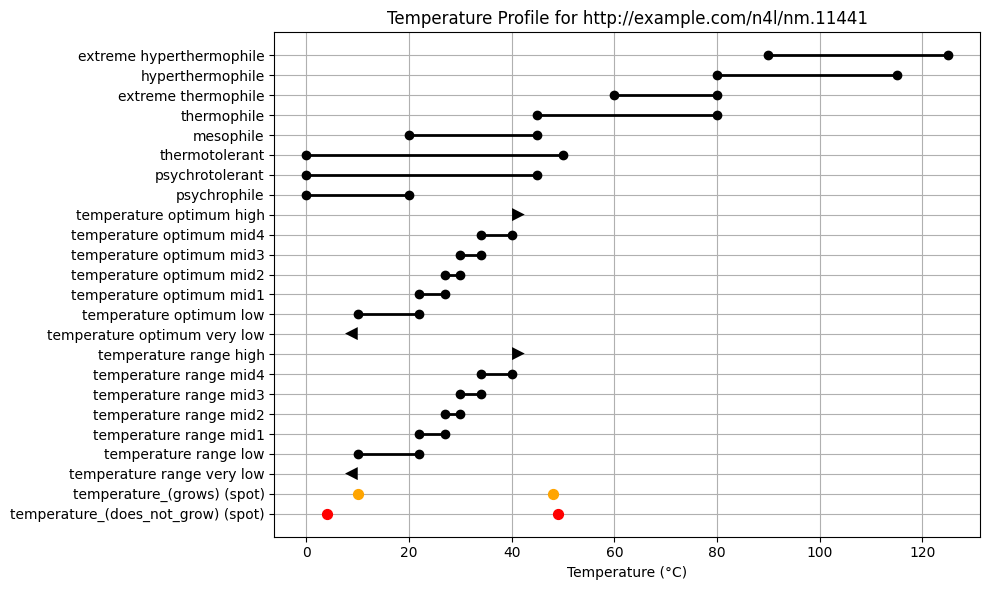


🟡 Partial matches for ?, nm.11441:
   - rid.2525_nm.11441.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Microbulbifer celer</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Microbulbifer celer</em>
       (ce′ler. L. masc. adj. 
      <em>celer</em>
       rapid, pertaining to fast growth).
    </s>
  </p>
  <p class="description">
    <s>Cells are Gram-negative and rod-shaped (0.2–0.4×0.8–3.5 μm).</s>
    <s>Colonies on MA are circular to slightly irregular, slightly convex, smooth, glistening, greyish yellow in colour and 3.0–4.0 mm in diameter after 2 days incubation at 37 °C.</s>
    <s>Growth occurs at 10 and 48 °C, but not at 4 or 49 °C.</s>
    <s>The optimal pH for growth is between 7.0 and 8.0; growth occurs at pH 5.0, but not at pH 4.5.</s>
    <s>Growth occurs in the presence of 15 % (w/v) NaCl, but not in the absence of NaCl or 

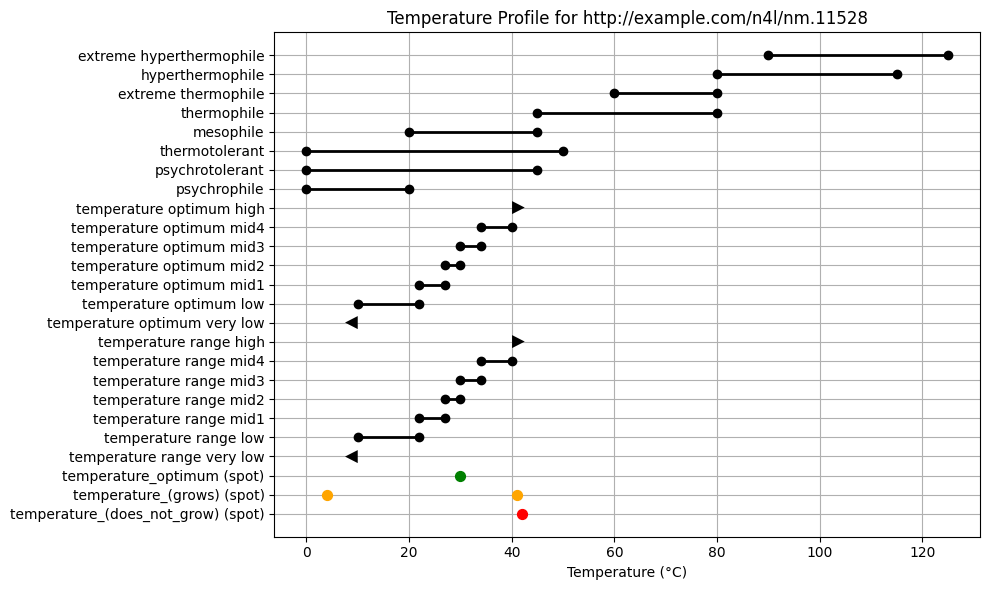


🟡 Partial matches for ?, nm.11528:
   - rid.2578_nm.11528.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Salegentibacter salarius</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Salegentibacter salarius</em>
       (sa.la′ri.us. L. masc. adj. 
      <em>salarius</em>
       of, or belonging to, salt).
    </s>
  </p>
  <p class="description">
    <s>Cells are Gram-negative rods that are 0.4–0.6 μm in diameter and 0.7–4.0 μm in length and devoid of gliding motility.</s>
    <s>Colonies on MA supplemented with 6 % (w/v) NaCl are circular, convex, smooth, glistening, yellow in colour and 0.8–1.2 mm in diameter after 7 days incubation at 30 °C.</s>
    <s>Optimal growth occurs at 30 °C.</s>
    <s>Growth occurs at 4 and 41 °C, but not at 42 °C.</s>
    <s>Optimal pH for growth is 7.0–8.0; growth occurs at pH 5.5, but not at pH 5.0.</s>
    <s>O

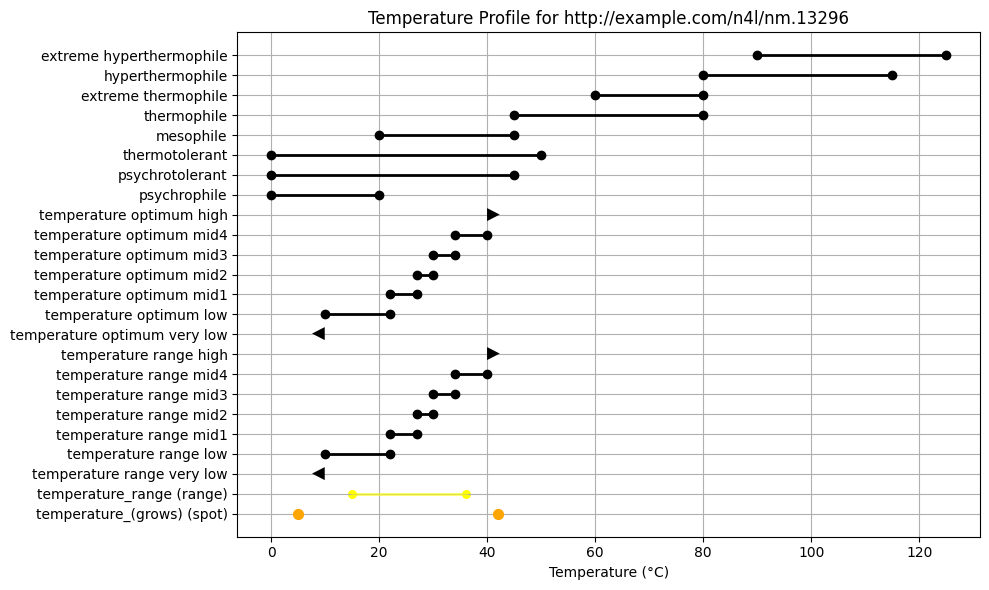


🟡 Partial matches for ?, nm.13296:
   - rid.8217_nm.13296.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Deinococcus aquatilis</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Deinococcus aquatilis</em>
       (a.qua.ti′lis. L. masc. adj. 
      <em>aquatilis</em>
       living in water).
    </s>
  </p>
  <p class="description">
    <s>Cells stain Gram-positive and are non-motile, non-spore-forming rods.</s>
    <s>Aerobic and oxidase-positive.</s>
    <s>Good growth after 48 h on R2A agar, nutrient agar and tryptic soy agar at 15–36 °C.</s>
    <s>Colonies on nutrient agar are smooth, pale pinkish, circular, translucent and shiny with entire edges, becoming mucoid.</s>
    <s>Unable to grow at 5 or 42 °C.</s>
    <s>Growth occurs at pH 5.5–11.</s>
    <s>
      Major cellular fatty acids are C
      <sub>16 : 1</sub>
      <em>ω</em>
     

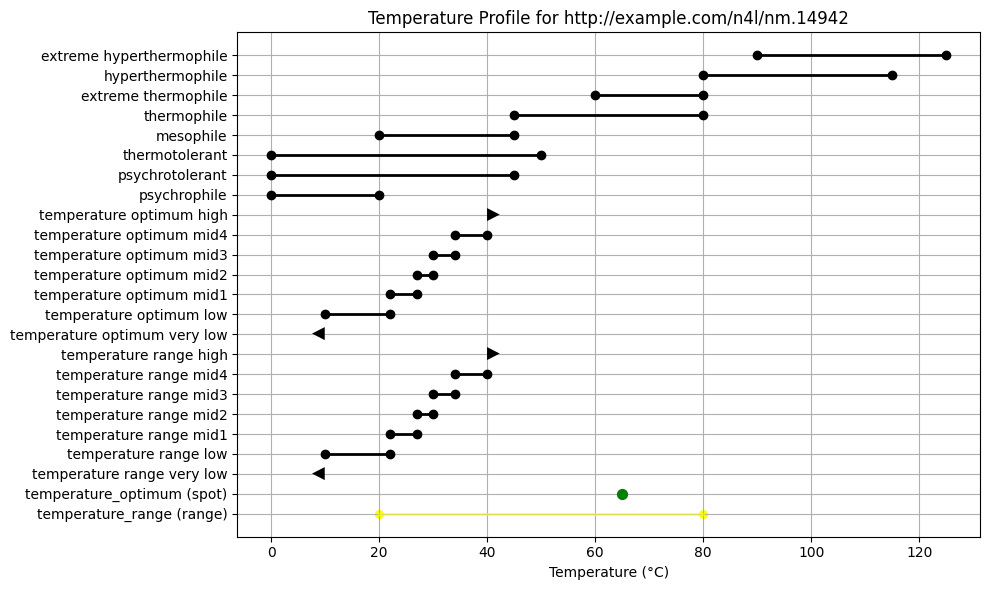


🟡 Partial matches for ?, nm.14942:
   - rid.9958_nm.14942.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Kosmotoga olearia</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Kosmotoga olearia</em>
       (o.le.a′ri.a. L. fem. adj. 
      <em>olearia</em>
       of or belonging to oil, describing the environment from which the type strain was isolated).
    </s>
  </p>
  <p class="description">
    <s>Displays the following properties in addition to those given for the genus.</s>
    <s>Cells are approximately 0.4–0.7 μm wide and 0.8–1.2 μm long, with one to three cells per sheath (toga).</s>
    <s>Rarely found in chains or aggregations of up to 50 cells.</s>
    <s>Spherical forms appear in stationary phase.</s>
    <s>Motile forms and flagella are not observed.</s>
    <s>Colonies grown on TBFXP 1 % (w/v) Gelrite bottle plates with maltose a

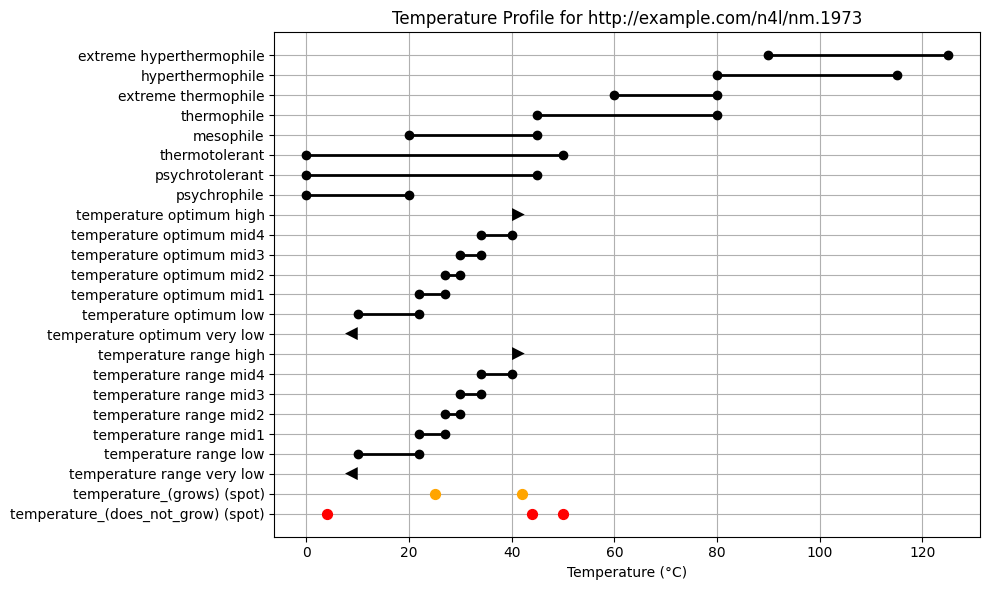


🟡 Partial matches for ?, nm.1973:
   - rid.4865_nm.1973.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Laribacter hongkongensis</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Laribacter hongkongensis</i>
       (
      <i>hongkongensis</i>
      , in honor of Hong Kong, means the place where the bacterium was discovered)
    </s>
  </p>
  <p class="description">
    <s>Cells are facultatively anaerobic, nonsporulating, gram-negative, seagull-shaped or spiral rods.</s>
    <s>The bacterium grows on sheep blood agar as nonhemolytic, gray colonies 1 mm in diameter after 24 h of incubation at 37°C in ambient air.</s>
    <s>Growth also occurs on MacConkey agar and at 25 and 42°C but not at 4, 44, and 50.</s>
    <s>It can grow in 1 or 2% NaCl but not in 3, 4, or 5% NaCl.</s>
    <s>
      No enhancement of growth is observed with 5% CO
      <sub

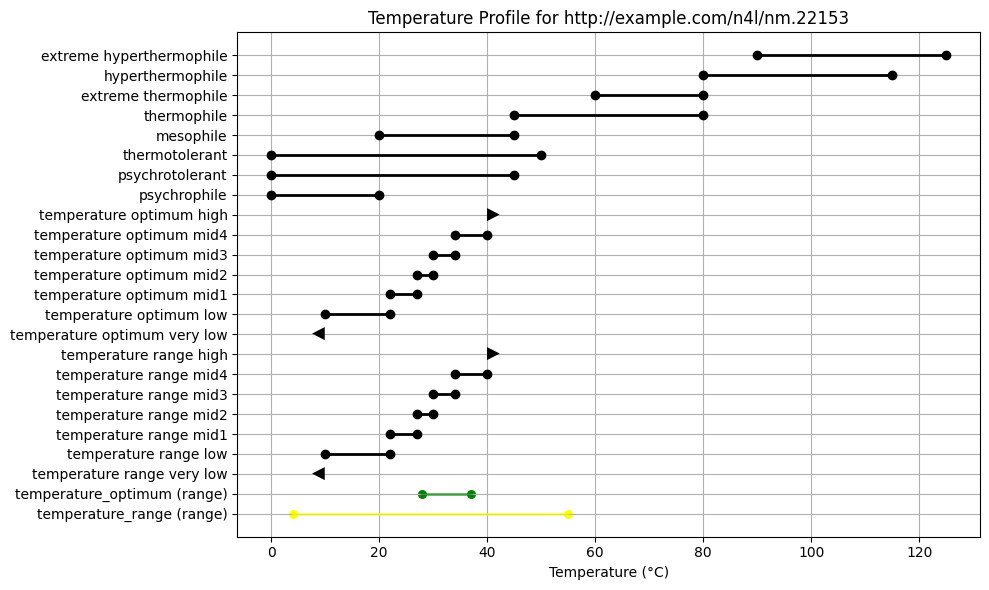


🟡 Partial matches for ?, nm.22153:
   - rid.12623_nm.22153.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Massilia alkalitolerans</em>
       comb. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Massilia alkalitolerans</em>
       (al.ka.li.to′le.rans. Arabic article 
      <em>al</em>
       the; Arabic n. 
      <em>qaliy</em>
       ashes of saltwort; French n. 
      <em>alcali</em>
       alkali; N.L. n. 
      <em>alkali</em>
       alkali; L. part. adj. 
      <em>tolerans</em>
       tolerating; N.L. part. adj. 
      <em>alkalitolerans</em>
       alkali-tolerating).
    </s>
  </p>
  <p class="nomenclature">
    <s>
      Basonym: 
      <em>Naxibacter alkalitolerans</em>
       Xu 
      <em>et al.</em>
       2005.
    </s>
  </p>
  <p class="description">
    <s>
      The description is identical to that given by Xu 
      <em>et al.</em>
  

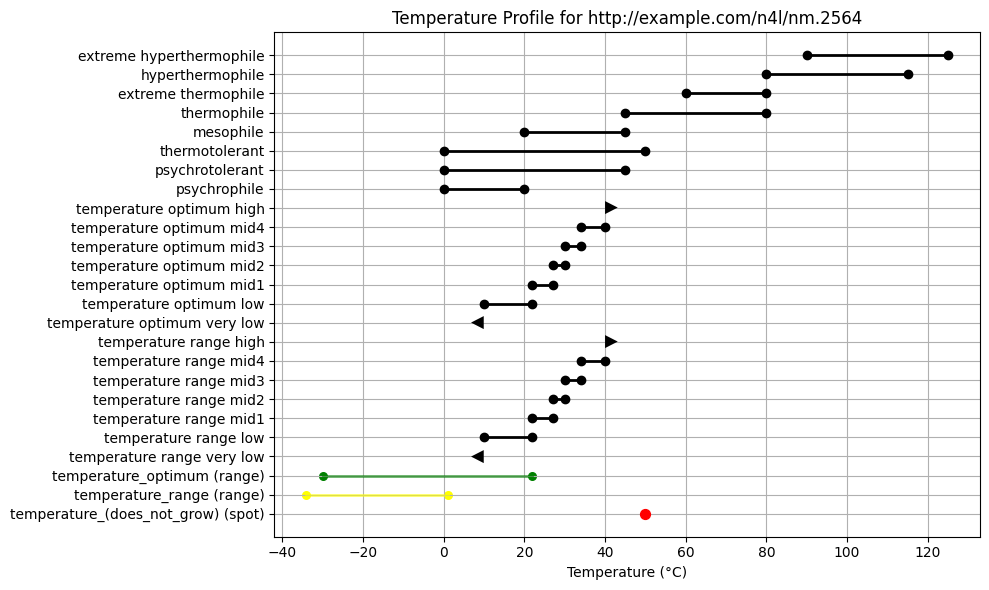


🟡 Partial matches for ?, nm.2564:
   - rid.6587_nm.2564.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of 
      <em>Pseudomonas asplenii</em>
       (Ark and Tompkins 1946) Savulescu 1947
    </s>
  </p>
  <p class="etymology"/>
  <p class="description">
    <s>Has the following properties in addition to those given previously (Ark &amp; Tompkins, 1946).</s>
    <s>Oxidase-positive.</s>
    <s>
      By API 20NE, indole and 
      <em>β</em>
      -galactosidase are not produced, aesculin and gelatin are not hydrolysed and fermentation of d-glucose and assimilation of adipate are negative.
    </s>
    <s>Caprate, malate and citrate are assimilated.</s>
    <s>
      Assimilation (API 50 CH) is positive for glycerol, d-glucose, d-fructose and gluconate, and negative for erythritol, d-arabinose, l-xylose, adonitol, methyl 
      <em>β</em>
      -xyloside, l-sorbose, l-rhamnos

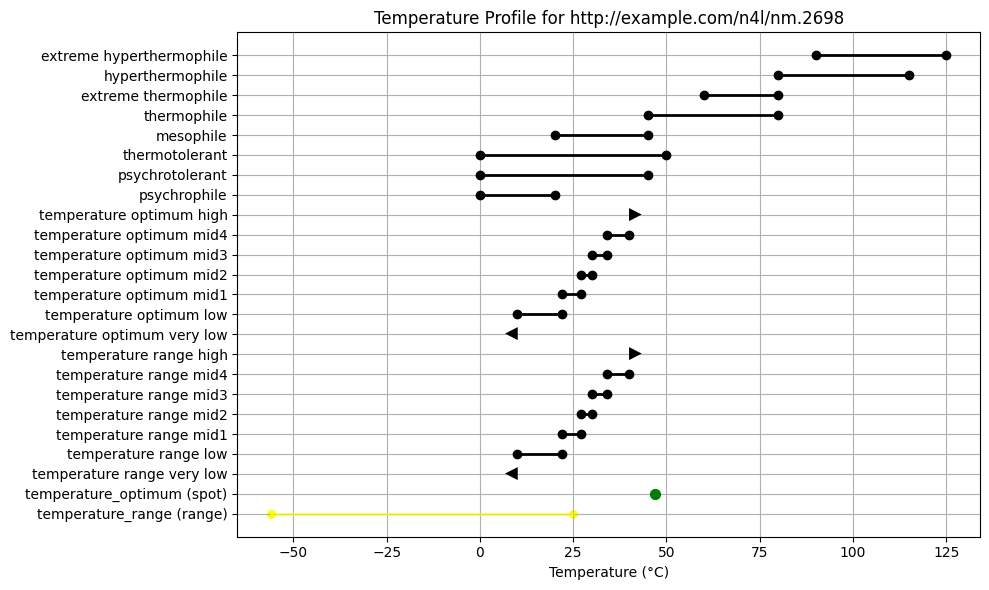


🟡 Partial matches for ?, nm.2698:
   - rid.6781_nm.2698.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Pseudomonas thermotolerans</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Pseudomonas thermotolerans</i>
       (ther.mo.to'le.rans. Gr. n. 
      <i>therme</i>
       heat; L. pres. part. 
      <i>tolerans</i>
       tolerating; N.L. adj. 
      <i>thermotolerans</i>
       able to tolerate high temperatures)
    </s>
  </p>
  <p class="description">
    <s>Forms rod-shaped cells, 1.0-1.5x0.4-0.7 μm.</s>
    <s>Gram reaction is negative.</s>
    <s>Cells are motile by a single polar flagellum.</s>
    <s>Colonies grown on LA medium are not pigmented and are 1-2 mm in diameter after 24 h growth; fluorescence is not produced on King B medium.</s>
    <s>Growth occurs above 25°C and below 56°C; the optimal growth temperature for strain CM3T i

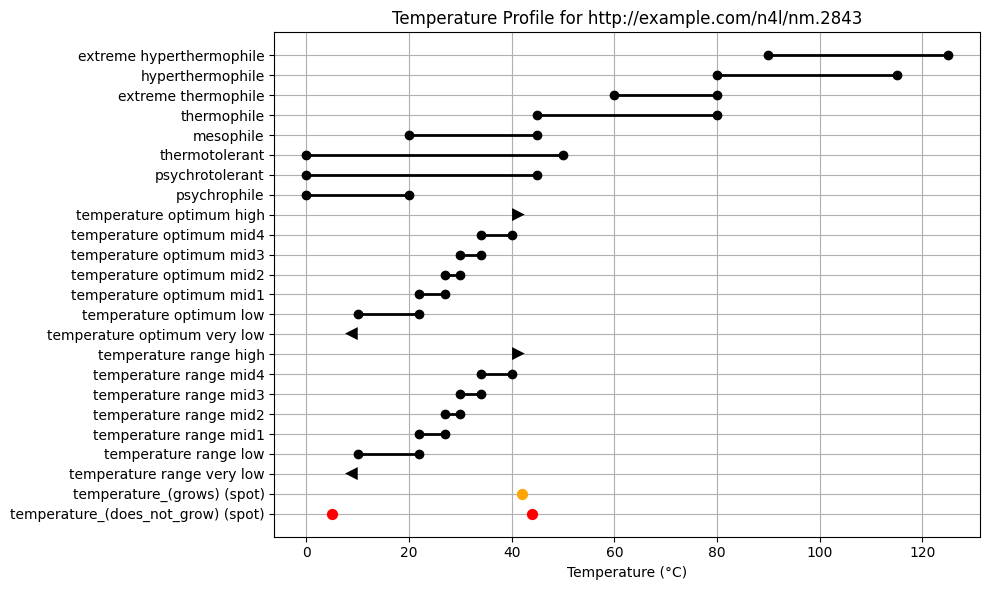


(no protolog XML found)
## http://example.com/n4l/nm.3808
  - Reference ID: ?
  - Taxon Name ID: nm.3808
  - Intra Conflict Score: 8.7
  - Inter Conflict Score: 0


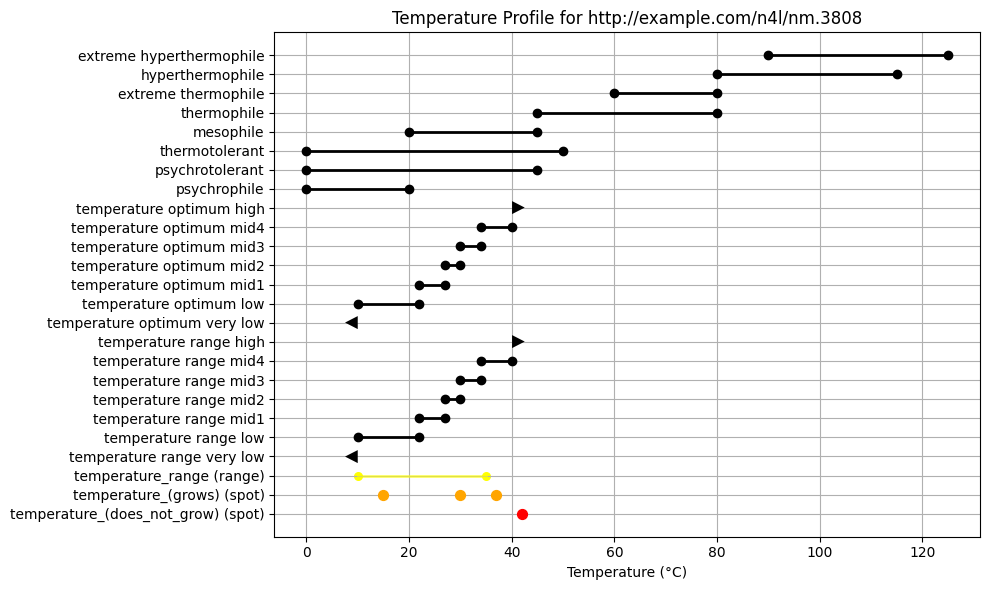


🟡 Partial matches for ?, nm.3808:
   - rid.2239_nm.3808.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Campylobacter nitrofigilis</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Campylobacter nitrofigilis</i>
       (ni. tro. fig' i. lis. L. n. 
      <i>nitrum</i>
       native mineral salt, native alkali; L. v. 
      <i>figo</i>
       to fix; L. suffix 
      <i>ilis</i>
       ability; M.L.adj. 
      <i>nitrofigilis</i>
       able to fix nitrogen)
    </s>
  </p>
  <p class="description">
    <s>Cells are gram-negative, curved rods 0.2 to 0.9 μm in diameter and 1 to 3 μm long.</s>
    <s>Coccoid bodies are found in old cultures but are not rapidly produced under aerobic conditions.</s>
    <s>Motile with a rapid corkscrew motion.</s>
    <s>Each cell possesses a single polar flagellum.</s>
    <s>Does not swarm.</s>
    <s>Chemoorganotr

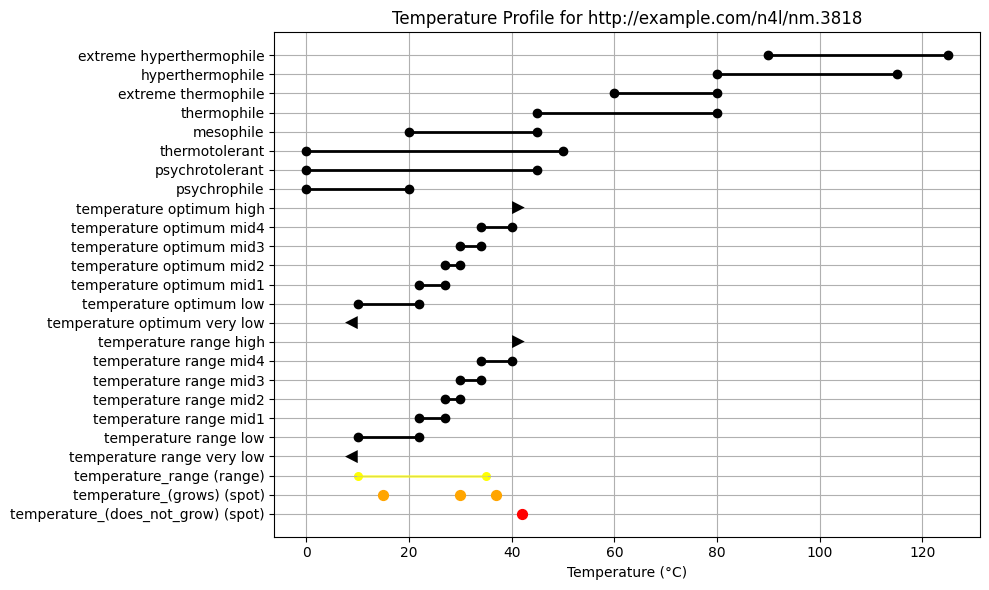


(no protolog XML found)
## http://example.com/n4l/nm.446
  - Reference ID: ?
  - Taxon Name ID: nm.446
  - Intra Conflict Score: 15.4
  - Inter Conflict Score: 0


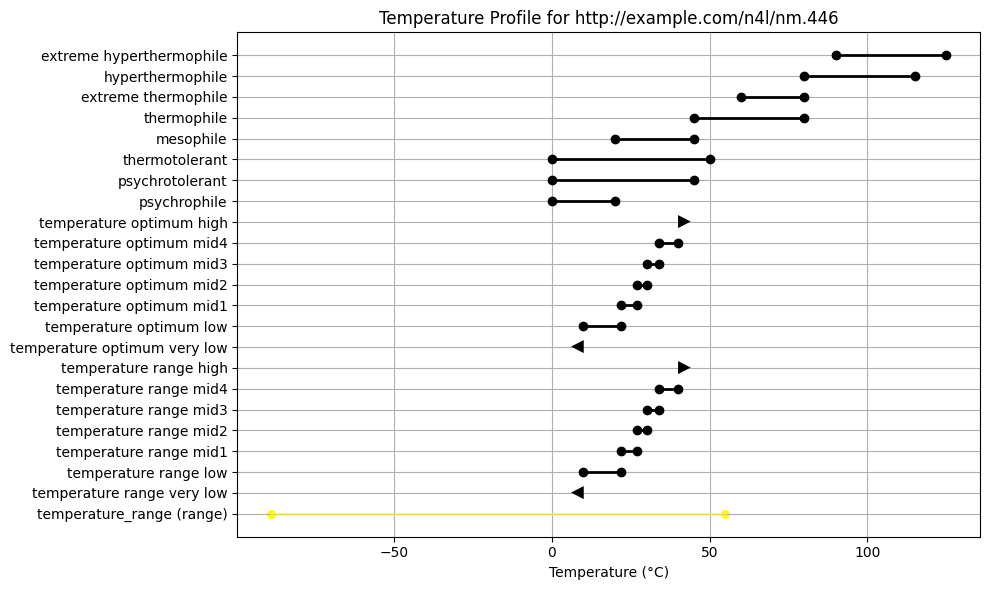


🟡 Partial matches for ?, nm.446:
   - rid.5540_nm.446.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Thermocrinis albus</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Thermocrinis albus</i>
       (al'bus. gr. 
      <i>alphos</i>
      , white, referring to the cell color)
    </s>
  </p>
  <p class="description">
    <s>Rod-shaped cells are usually between 1 and 3 μm long and 0.5 to 0.6 μm wide.</s>
    <s>Spores are not formed.</s>
    <s>Motile by means of a monopolar monotrichous flagellum.</s>
    <s>Cells occur singly, in pairs, and in aggregates consisting of up to several hundred individuals.</s>
    <s>In a permanent flow of medium, cells grow predominately as long filaments, forming visible whitish cell masses.</s>
    <s>No evidence of a regularly arrayed surface layer protein.</s>
    <s>Growth occurred at temperatures between 55

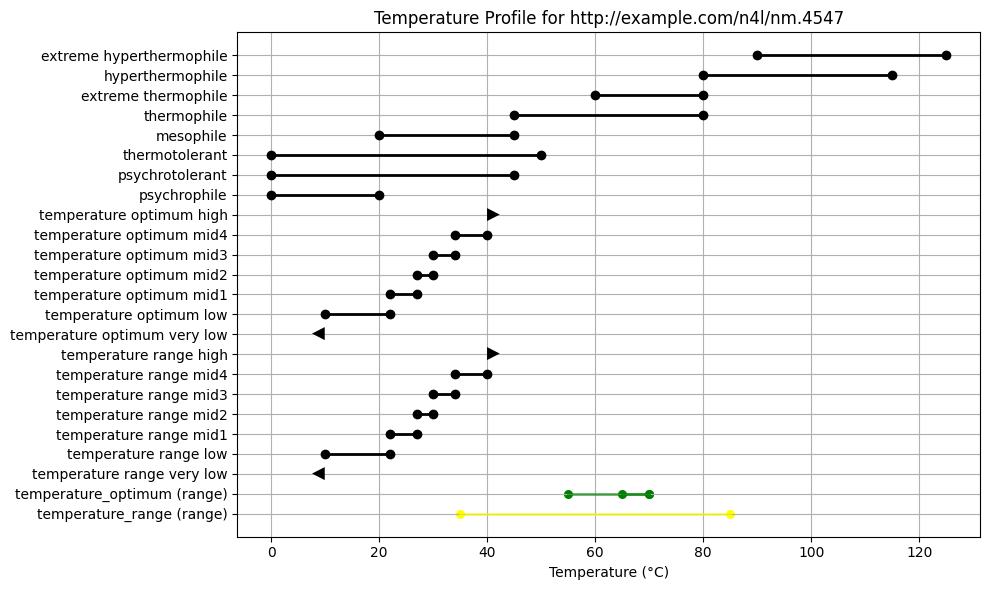


(no protolog XML found)
## http://example.com/n4l/nm.4563
  - Reference ID: ?
  - Taxon Name ID: nm.4563
  - Intra Conflict Score: 8.5
  - Inter Conflict Score: 0


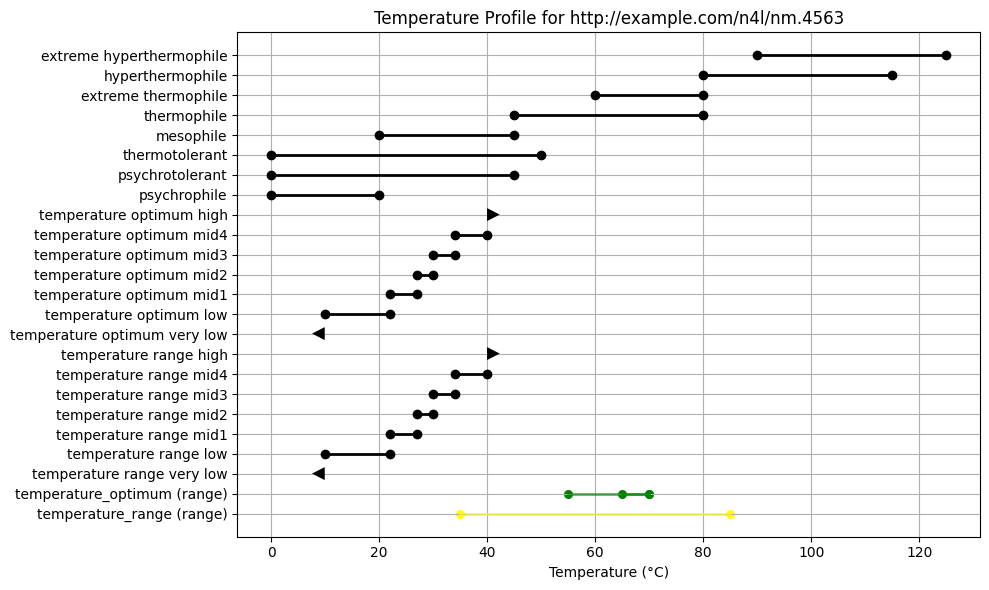


(no protolog XML found)
## http://example.com/n4l/nm.4569
  - Reference ID: ?
  - Taxon Name ID: nm.4569
  - Intra Conflict Score: 15.8
  - Inter Conflict Score: 0


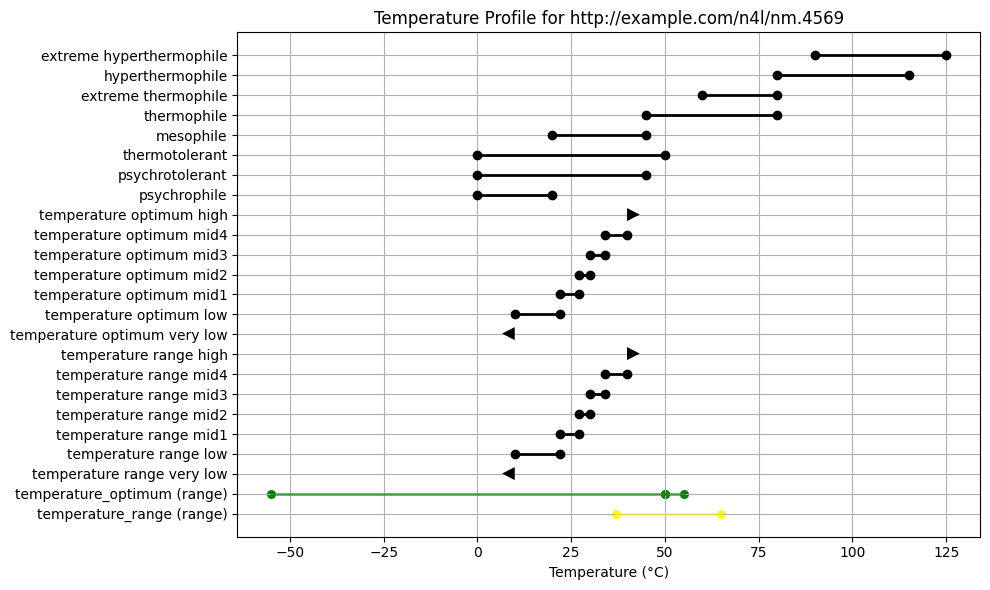


(no protolog XML found)
## http://example.com/n4l/nm.4600
  - Reference ID: ?
  - Taxon Name ID: nm.4600
  - Intra Conflict Score: 8.1
  - Inter Conflict Score: 0


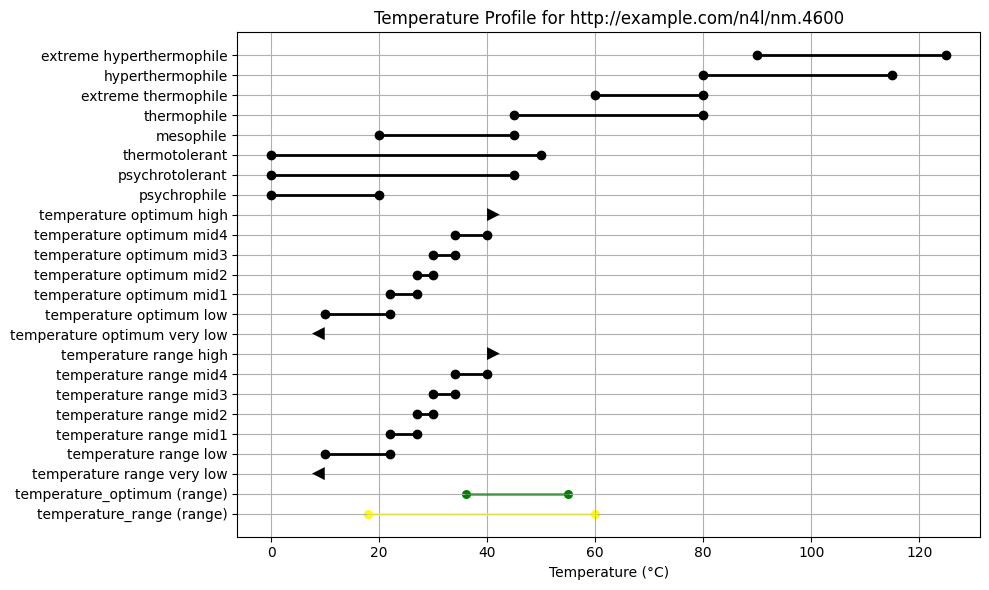


🟡 Partial matches for ?, nm.4600:
   - rid.800_nm.4600.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Halonatronum saccharophilum</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Halonatronum saccharophilum</i>
       (Sac.cha.ro.philum. From Gr. n. 
      <i>sacchar</i>
      , sugar and Gr. adj. 
      <i>philus</i>
      , liking. A sugar-liking organism.
    </s>
  </p>
  <p class="description">
    <s>Slender flexible rods, 0.4–0.6 × 3.5−10 μm in young cultures; long thickened degenerate cells, spheroplasts, and spores are characteristic of aging cultures.</s>
    <s>Spores are round, terminal, thermostable, of the plectridial type.</s>
    <s>The cell wall is characterized by a gram-negative structural pattern.</s>
    <s>Cells are motile by means of peritrichous flagella.</s>
  </p>
  <p class="description">
    <s>A moderate haloalkalip

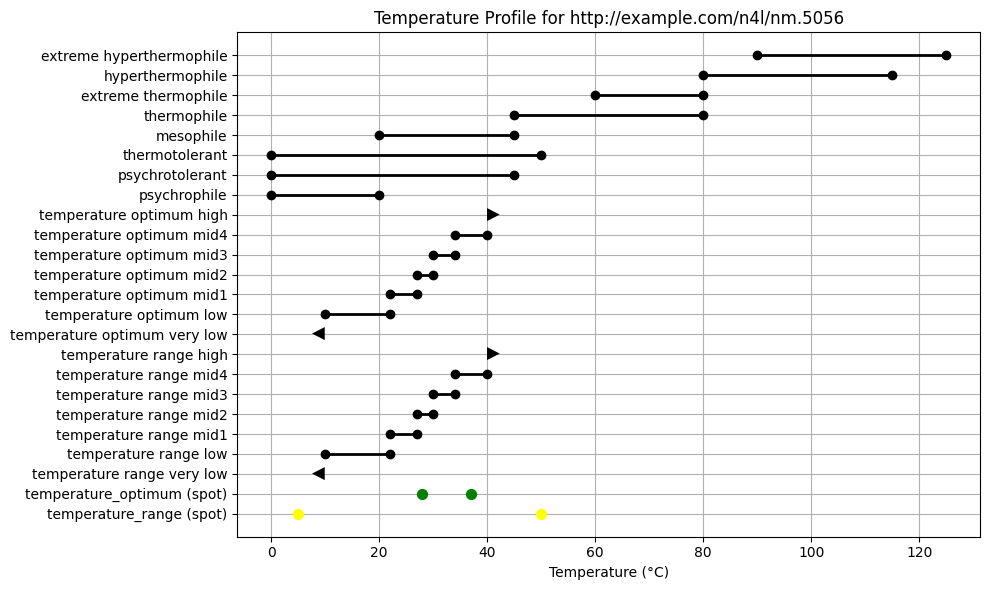


(no protolog XML found)
## http://example.com/n4l/nm.5062
  - Reference ID: ?
  - Taxon Name ID: nm.5062
  - Intra Conflict Score: 9.4
  - Inter Conflict Score: 0


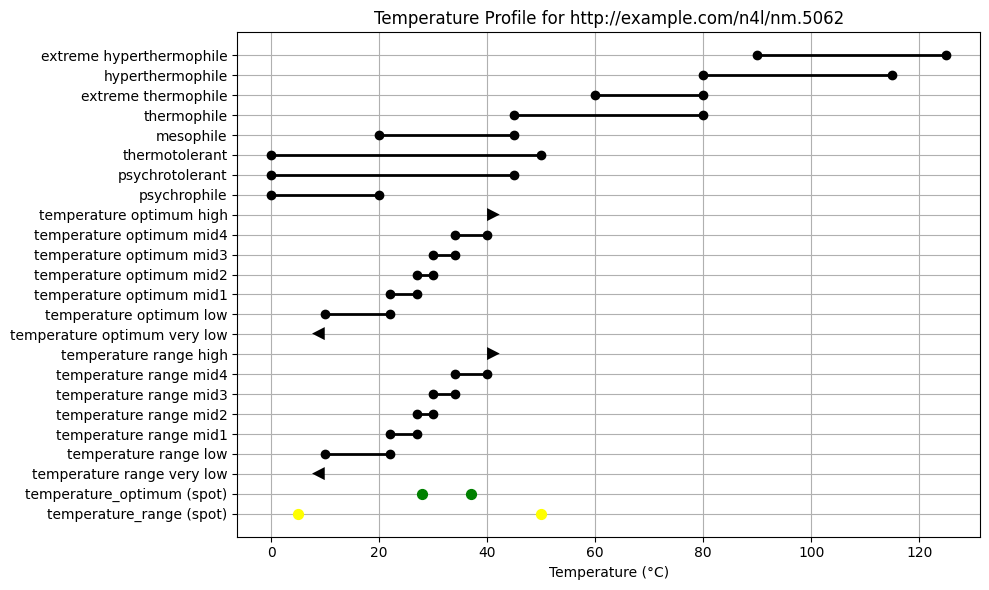


🟡 Partial matches for ?, nm.5062:
   - rid.2755_nm.5062.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of the genus 
      <em>Virgibacillus</em>
       Heyndrickx 
      <em>et al.</em>
       1998
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Virgibacillus</em>
       (Vir.gi.ba.cil′lus. L. n. 
      <em>virga</em>
       a green twig, transf., a branch in a family tree; L. dim. n. 
      <em>bacillus</em>
       from 
      <em>Bacillus</em>
      , a genus of aerobic endospore-forming bacteria; N.L. n. 
      <em>Virgibacillus</em>
       a branch of the genus 
      <em>Bacillus</em>
      ).
    </s>
  </p>
  <p class="description">
    <s>Cells are motile, Gram-positive rods (0·3–0·7×2–6 μm) that occur singly, in pairs or short chains or filaments.</s>
    <s>They bear oval to ellipsoidal endospores that lie in swollen sporangia.</s>
    <s>Colonies are smal

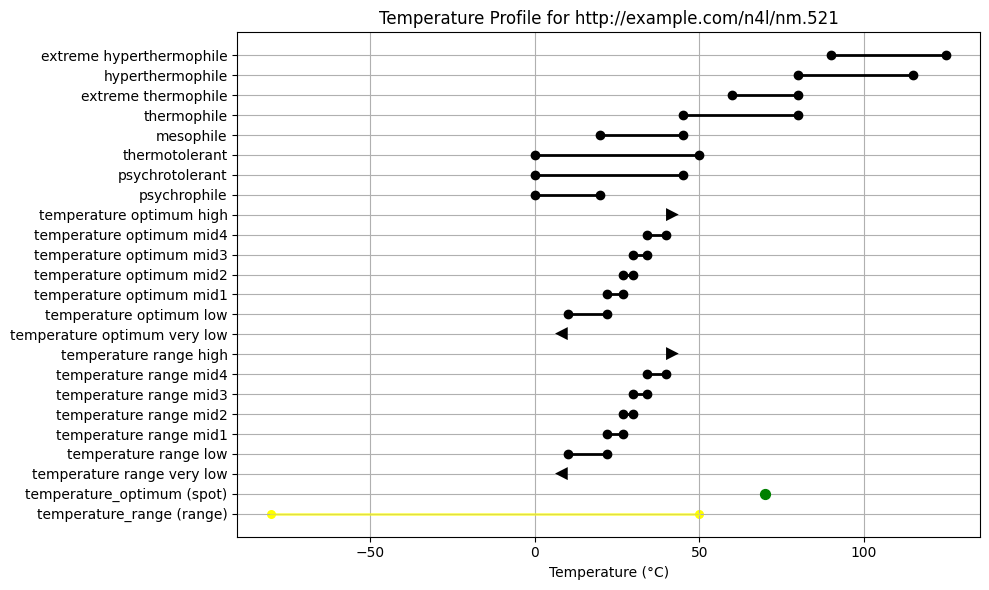


(no protolog XML found)
## http://example.com/n4l/nm.554
  - Reference ID: ?
  - Taxon Name ID: nm.554
  - Intra Conflict Score: 12.2
  - Inter Conflict Score: 0


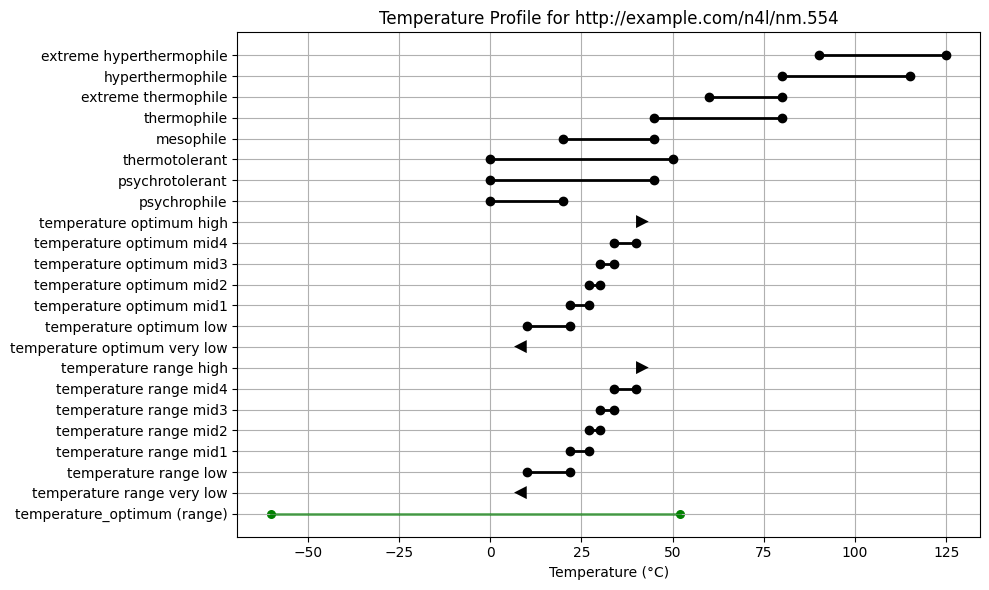


(no protolog XML found)
## http://example.com/n4l/nm.7699
  - Reference ID: ?
  - Taxon Name ID: nm.7699
  - Intra Conflict Score: 9.299999999999999
  - Inter Conflict Score: 0


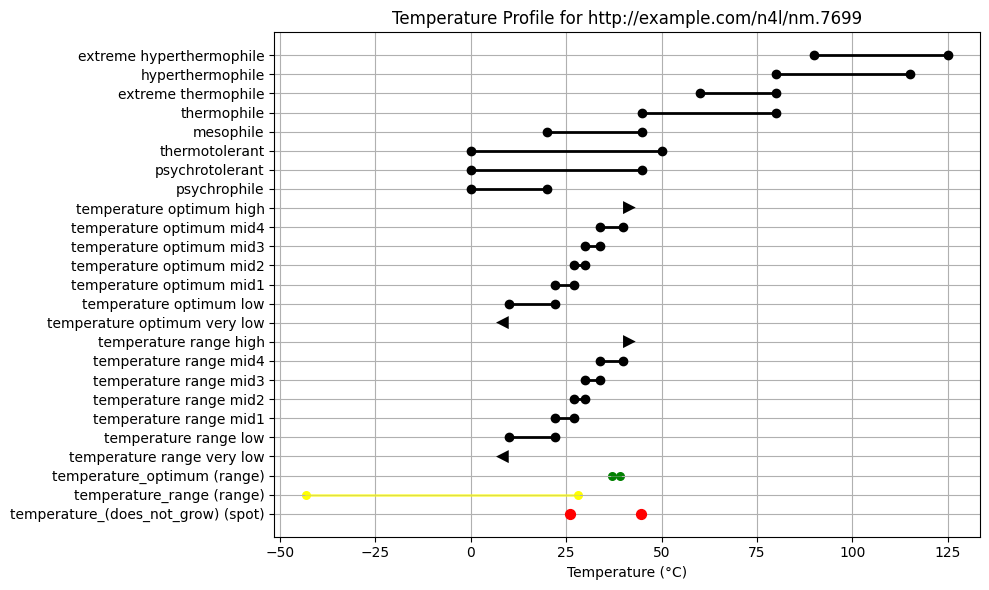


(no protolog XML found)
## http://example.com/n4l/nm.8092
  - Reference ID: ?
  - Taxon Name ID: nm.8092
  - Intra Conflict Score: 11.2
  - Inter Conflict Score: 0


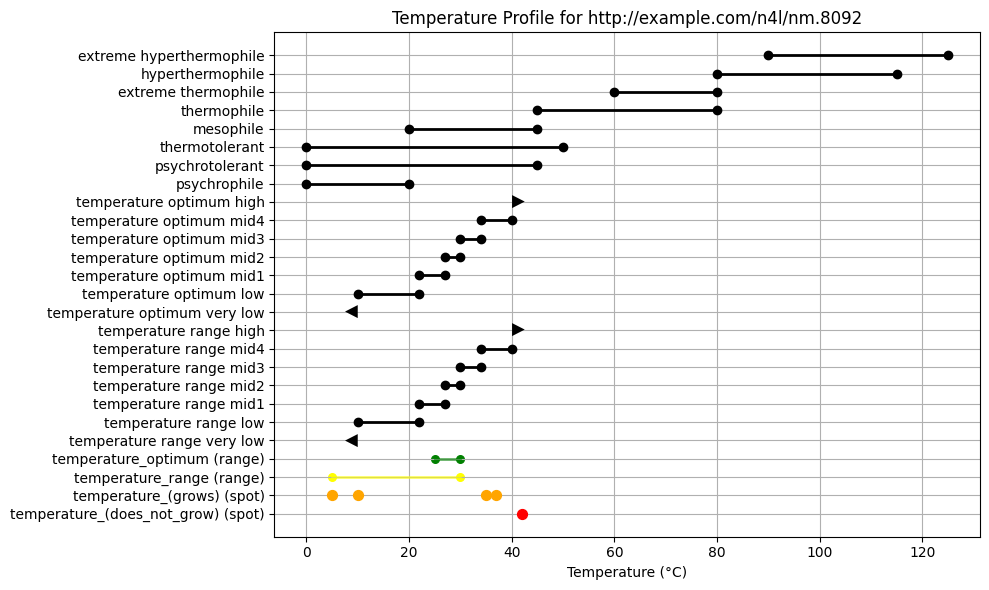


(no protolog XML found)
## http://example.com/n4l/nm.8117
  - Reference ID: ?
  - Taxon Name ID: nm.8117
  - Intra Conflict Score: 6.4
  - Inter Conflict Score: 1


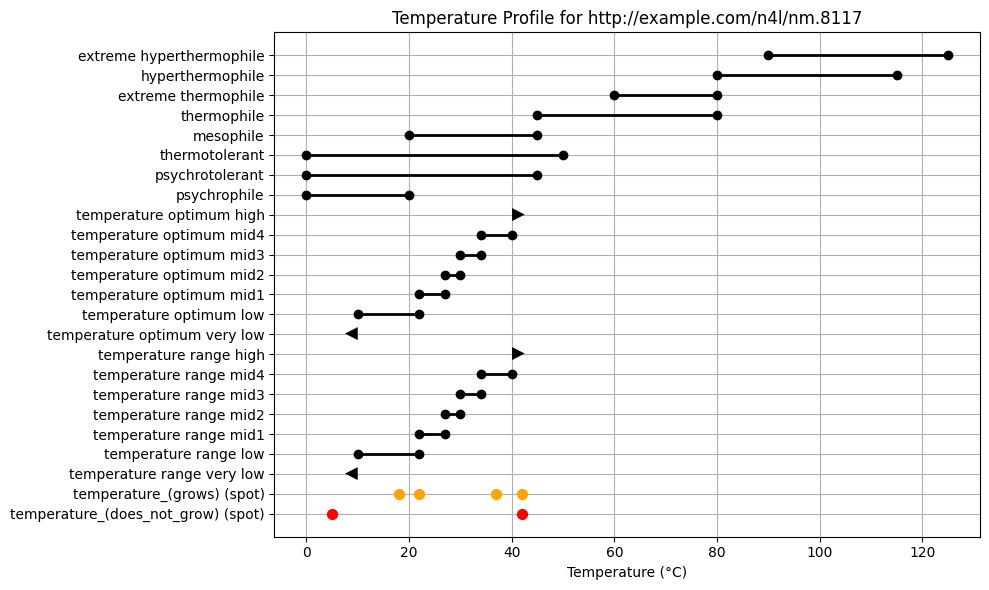


🟡 Partial matches for ?, nm.8117:
   - rid.3344_nm.8117.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Flavobacterium thalpophilum</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Flavobacterium thalpophilum</i>
       (thal.po'phi.lum. Gr. n. 
      <i>thalpos</i>
       warmth; Gr. n. adj. 
      <i>philon</i>
       loving; M. L. n. adj. 
      <i>thalpophilum</i>
       warmth-loving)
    </s>
  </p>
  <p class="description">
    <s>The characteristics for which all seven strains of the species gave either positive results or negative results are given below.</s>
    <s>Characteristics for which the seven strains gave different results are given in Table 2.</s>
  </p>
  <p class="description">
    <s>Gram-negative, nonsporeforming rods of regular shape with rounded ends.</s>
    <s>Nonmotile in hanging-drop preparations after overnight grow

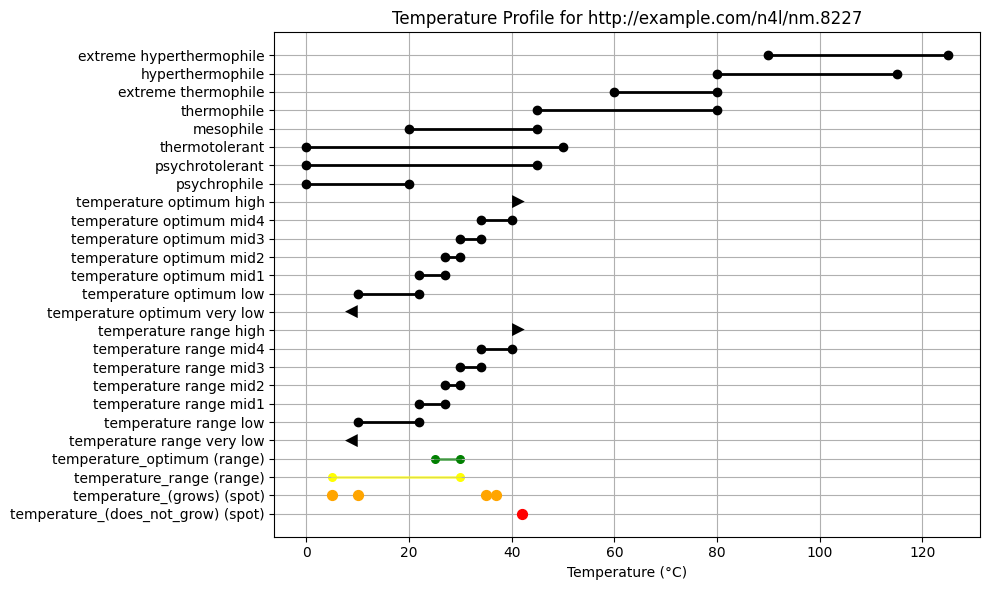


(no protolog XML found)
## http://example.com/n4l/nm.8231
  - Reference ID: ?
  - Taxon Name ID: nm.8231
  - Intra Conflict Score: 6.4
  - Inter Conflict Score: 1


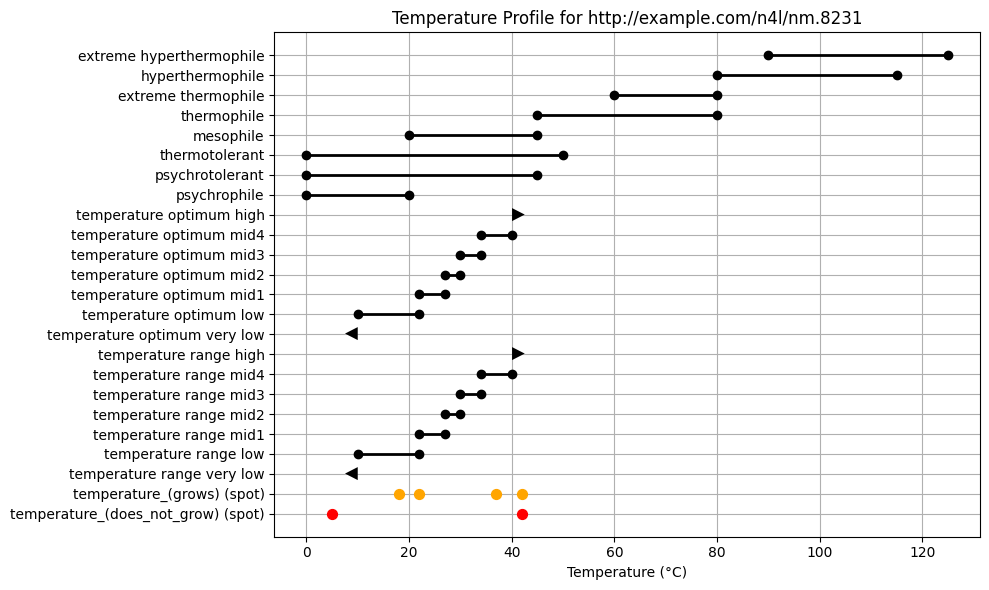


(no protolog XML found)
## http://example.com/n4l/nm.8233
  - Reference ID: ?
  - Taxon Name ID: nm.8233
  - Intra Conflict Score: 11.2
  - Inter Conflict Score: 0


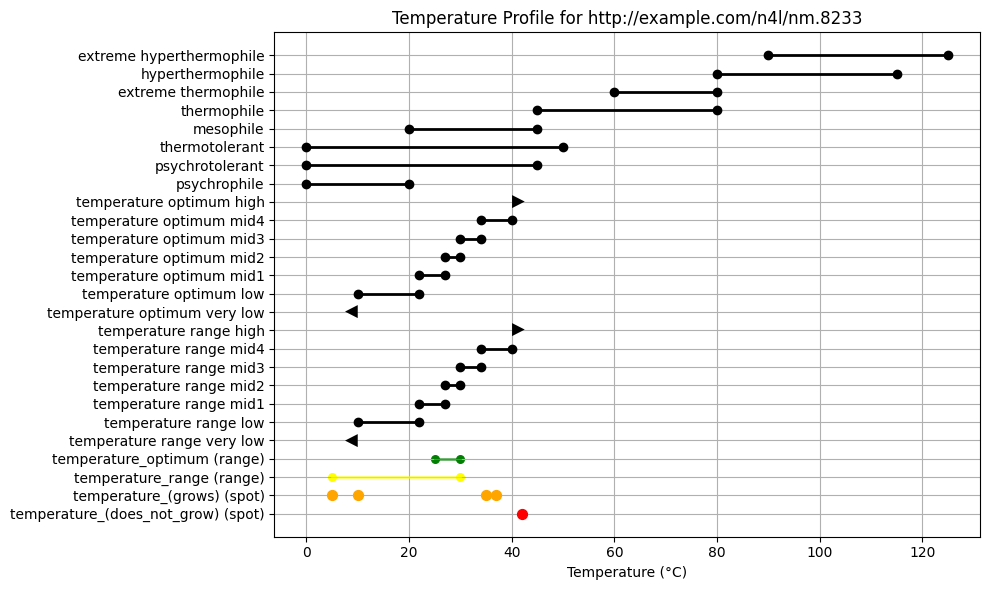


(no protolog XML found)
## http://example.com/n4l/nm.8281
  - Reference ID: ?
  - Taxon Name ID: nm.8281
  - Intra Conflict Score: 11.2
  - Inter Conflict Score: 0


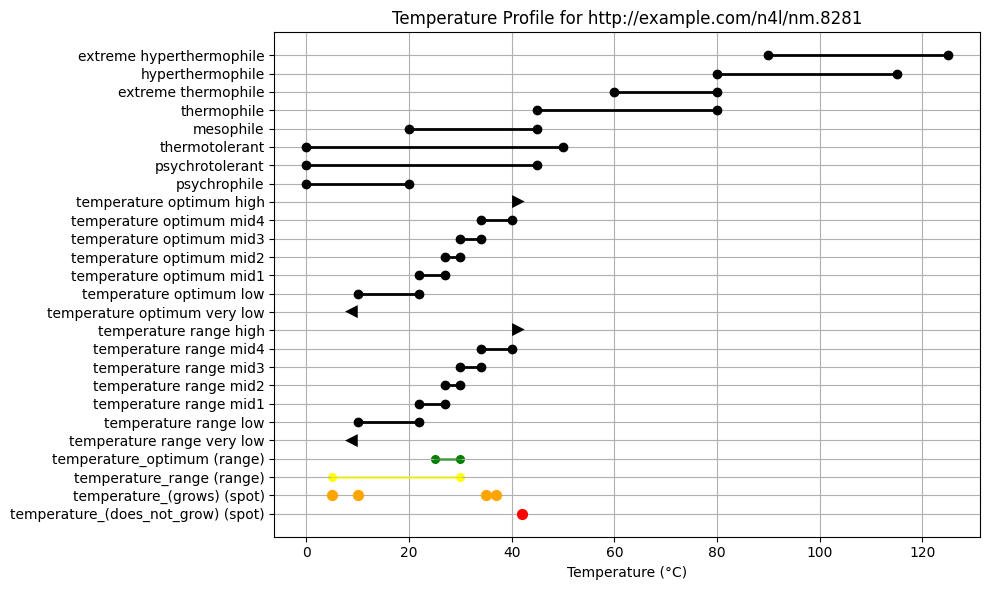


(no protolog XML found)
## http://example.com/n4l/nm.8337
  - Reference ID: ?
  - Taxon Name ID: nm.8337
  - Intra Conflict Score: 8.0
  - Inter Conflict Score: 0


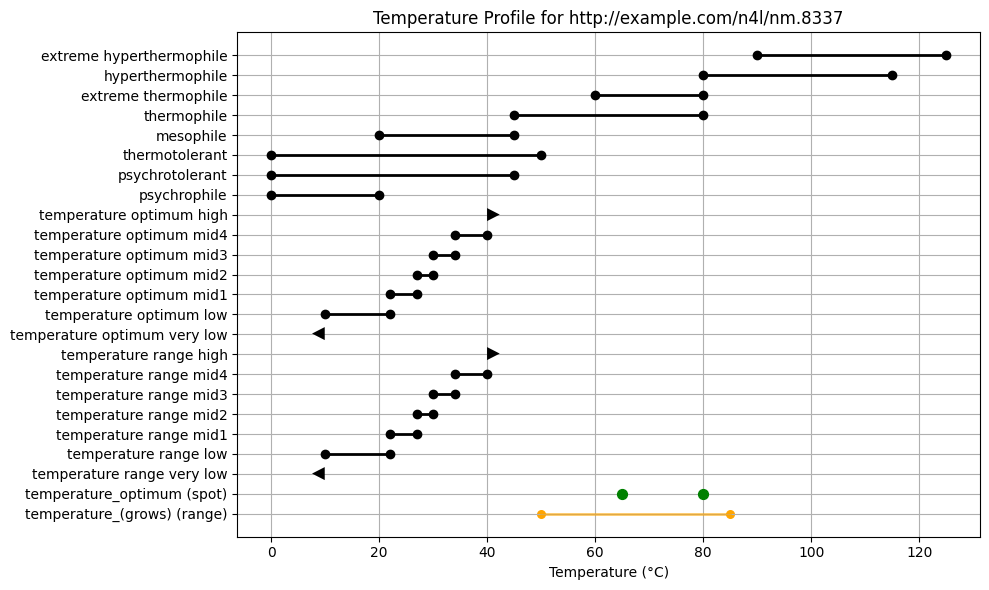


🟡 Partial matches for ?, nm.8337:
   - rid.3366_nm.8337.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Rhodothermus marinus</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Rhodothermus marinus</i>
       (ma. ri'nus, L. masc. adj. 
      <i>marinus</i>
       thriving in the sea, describing its biotope)
    </s>
  </p>
  <p class="description">
    <s>Description as for the genus.</s>
    <s>Cells never occur in chains or filaments.</s>
    <s>Optimal growth at 65 °C and pH 7 and about 2% (w/v) NaCl.</s>
    <s>Growth occurs at 6% (w/v) NaCl.</s>
    <s>The natural habitat is submarine alkaline hot springs.</s>
  </p>
  <p class="description">
    <s>
      The type strain is 
      <i>Rhodothermus marinus</i>
      , DSM 4252 (ATCC 43812) (isolated from a submarine hot spring at Reykjanes, NW Iceland).
    </s>
  </p>
</content>

## http://ex

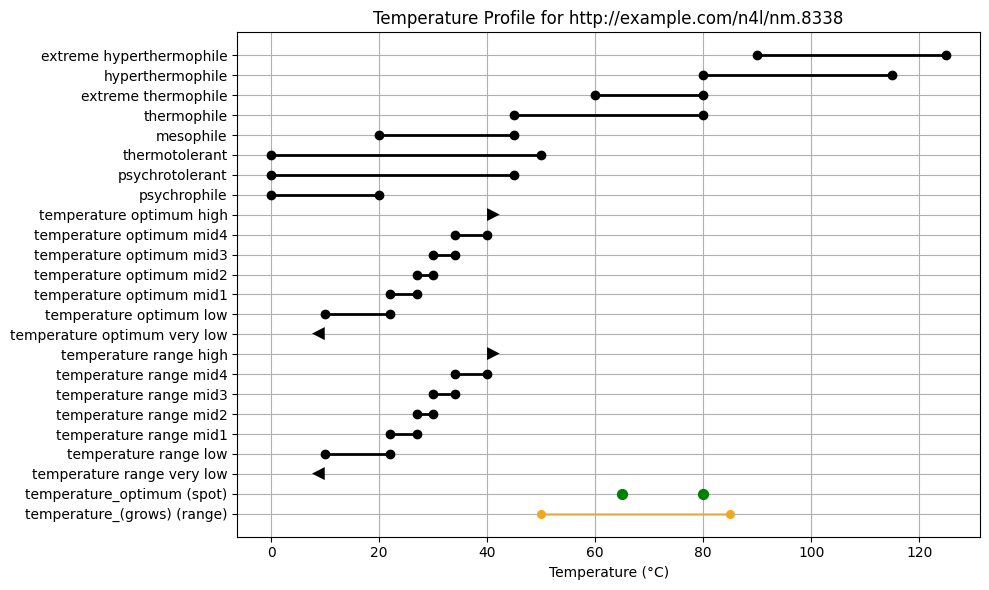


🟡 Partial matches for ?, nm.8338:
   - rid.7090_nm.8338.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Rhodothermus obamensis</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Rhodothermus obamensis</i>
       (o.bam'en.sis. L. gen. n. 
      <i>obamensis</i>
      , of Obama, a hot spring in Japan)
    </s>
  </p>
  <p class="description">
    <s>Cells are gram-negative, straight rods that are about 4 to 10 μm long and 0.5 to 1.0 μm wide and occur singly and in aggregates; they are extremely long during the stationary growth phase.</s>
    <s>Colonies are reddish and 1 to 2 mm in diameter with entire edges.</s>
    <s>Aerobic, thermophilic, neutrophilic heterotroph.</s>
    <s>Growth occurs at temperatures between 50 and 85°C (optimum temperature, 80°C), at pH 5.5 and 9.0 (optimum pH, 7.0), and in the presence of 1 to 5% NaCl (optimum NaCl conc

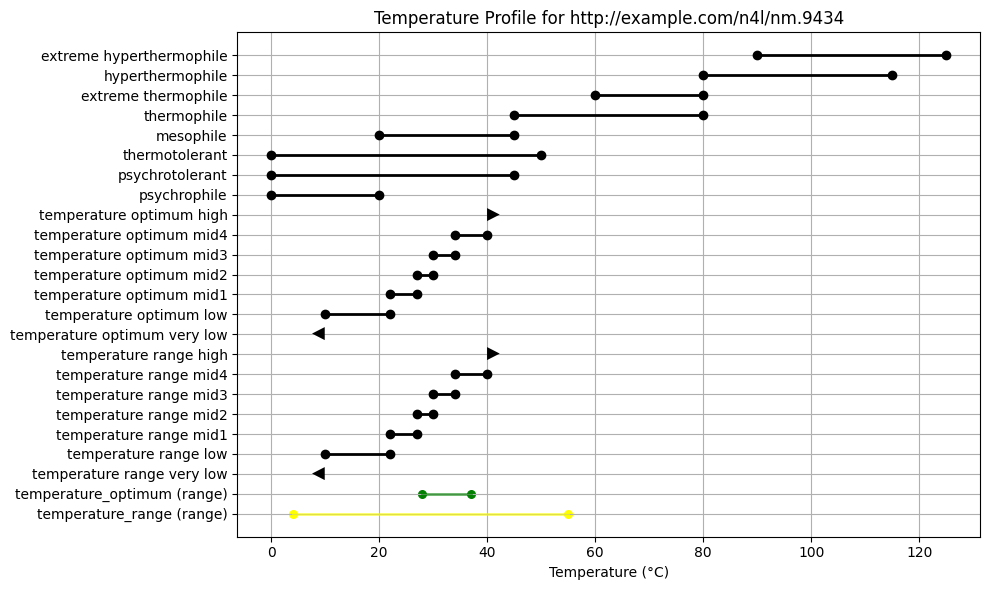


🟡 Partial matches for ?, nm.9434:
   - rid.737_nm.9434.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Naxibacter alkalitolerans</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Naxibacter alkalitolerans</em>
       (al.ka.li.to′le.rans. Arabic article 
      <em>al</em>
       the; Arabic n. 
      <em>qaliy</em>
       ashes of saltwort; French n. 
      <em>alcali</em>
       alkali; N.L. n. 
      <em>alkali</em>
       alkali; L. part. adj. 
      <em>tolerans</em>
       tolerating; N.L. part. adj. 
      <em>alkalitolerans</em>
       alkali-tolerating).
    </s>
  </p>
  <p class="description">
    <s>In addition to the characteristics that define the genus, the species has the characteristics described below.</s>
    <s>Colonies are 1·1–1·4 mm in diameter, circular, entire, convex, glistening, butyraceous, opaque and with pale white–

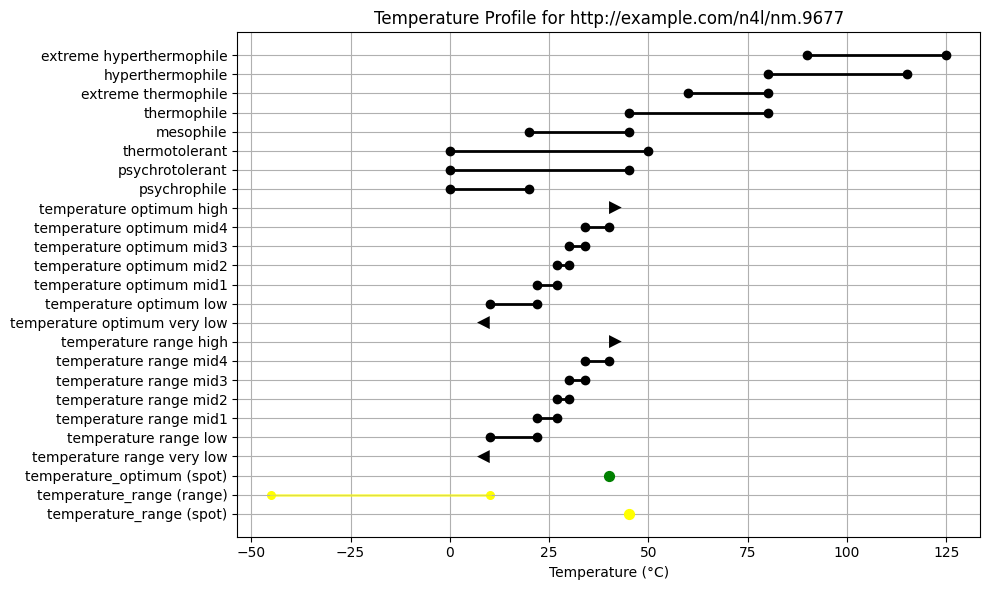


(no protolog XML found)
## http://example.com/n4l/nm.9703
  - Reference ID: ?
  - Taxon Name ID: nm.9703
  - Intra Conflict Score: 8.0
  - Inter Conflict Score: 0


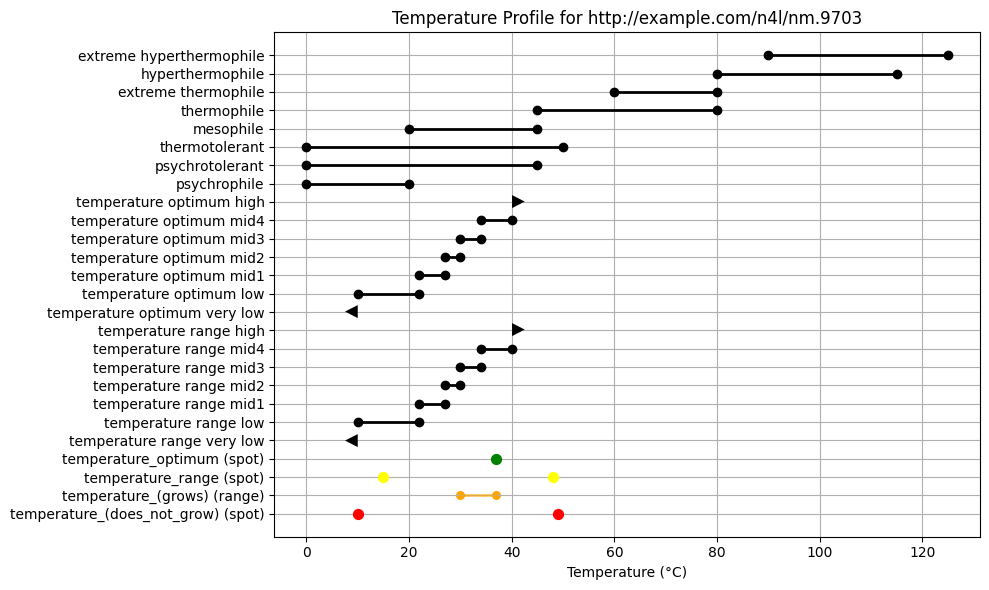


🟡 Partial matches for ?, nm.9703:
   - rid.2300_nm.9703.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Halobacillus yeomjeoni</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Halobacillus yeomjeoni</em>
       (yeom.jeo′ni. N.L. gen. n. 
      <em>yeomjeoni</em>
       of yeomjeon, the Korean name for a marine solar saltern).
    </s>
  </p>
  <p class="description">
    <s>Cells are rods or long filamentous rods, measuring 0·4–0·6×2·0–100 μm, on MA supplemented with 3 % (w/v) NaCl at 37 °C; a few cells in old cultures are greater than 100 μm in length (Fig. 1).</s>
    <s>Gram-positive, but Gram-variable in old cultures.</s>
    <s>Central or subterminal ellipsoidal endospores are observed in swollen sporangia.</s>
    <s>Colonies are circular, slightly raised, glistening, light yellow in colour and 1–2 mm in size after 2 days incubation at

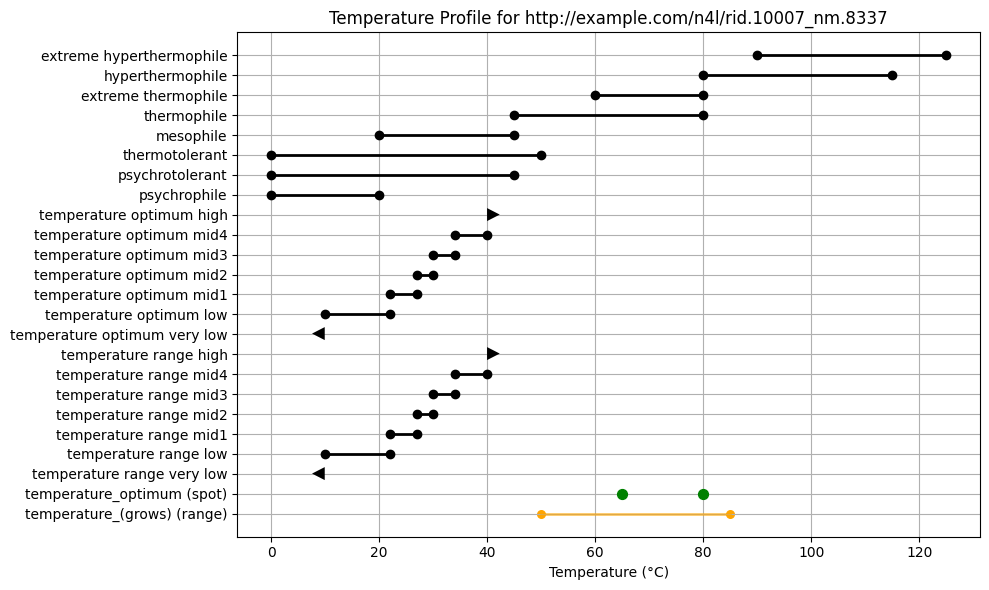


🟡 Partial matches for rid.10007, nm.8337:
   - rid.3366_nm.8337.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Rhodothermus marinus</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Rhodothermus marinus</i>
       (ma. ri'nus, L. masc. adj. 
      <i>marinus</i>
       thriving in the sea, describing its biotope)
    </s>
  </p>
  <p class="description">
    <s>Description as for the genus.</s>
    <s>Cells never occur in chains or filaments.</s>
    <s>Optimal growth at 65 °C and pH 7 and about 2% (w/v) NaCl.</s>
    <s>Growth occurs at 6% (w/v) NaCl.</s>
    <s>The natural habitat is submarine alkaline hot springs.</s>
  </p>
  <p class="description">
    <s>
      The type strain is 
      <i>Rhodothermus marinus</i>
      , DSM 4252 (ATCC 43812) (isolated from a submarine hot spring at Reykjanes, NW Iceland).
    </s>
  </p>
</content>

## h

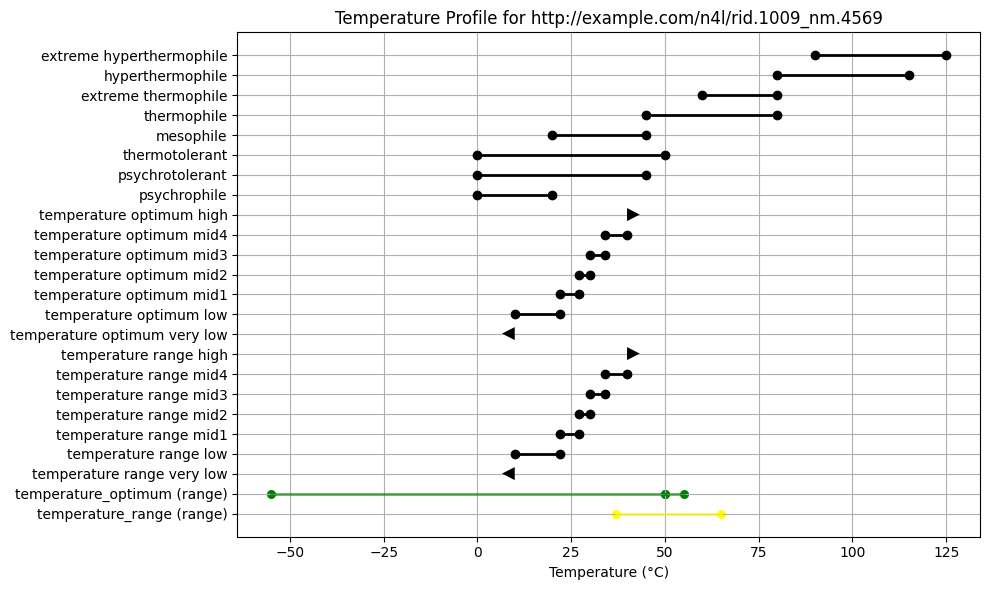


🟡 Partial matches for rid.1009, nm.4569:
   - rid.1009_nm.4567.xml
   - rid.1009_nm.4568.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Thermodesulfobiaceae</i>
       fam. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Thermodesulfobiaceae</i>
       (Ther.mo.de.sul.fo.bia.ce.ae. Gr. adj. 
      <i>thermos</i>
       hot; L. pref. 
      <i>de</i>
       from; L. n. 
      <i>sulfur</i>
       sulfur; Gr. n. 
      <i>bios</i>
       life; L. 
      <i>aceae</i>
       denoting a family; L. neut. n. 
      <i>Thermodesulfobiaceae</i>
       a family of thermophilic organisms that reduces a sulfur compound)
    </s>
  </p>
  <p class="description">
    <s>Rod-shaped, non-sporulating and Gram-staining negative cells.</s>
    <s>Moderately thermophilic.</s>
    <s>Chemoautotrophic and strictly anaerobic.</s>
    <s>Growth occurs by anaerobic respiration with 

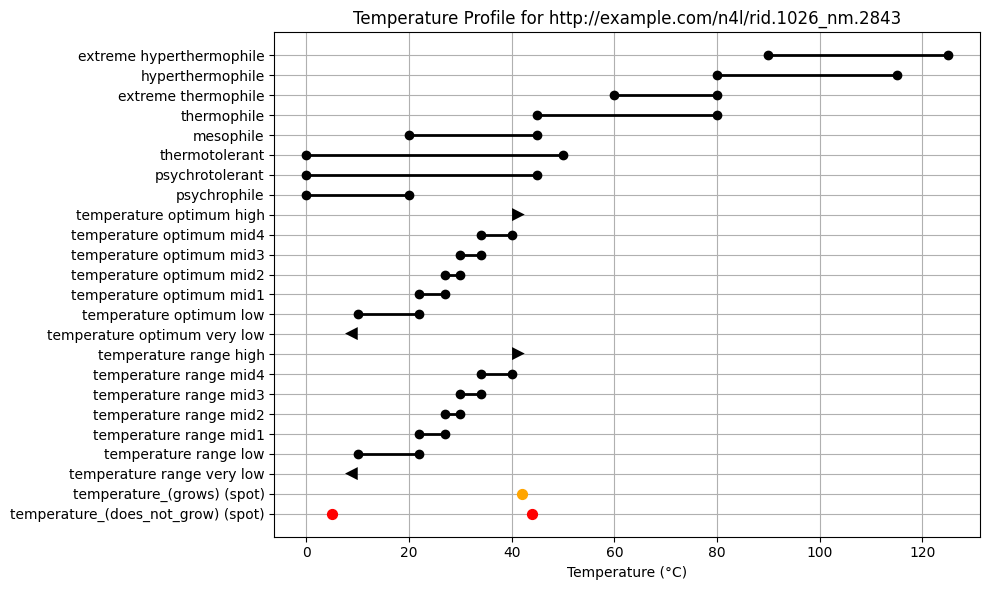


(no protolog XML found)
## http://example.com/n4l/rid.1133_nm.7699
  - Reference ID: rid.1133
  - Taxon Name ID: nm.7699
  - Intra Conflict Score: 9.299999999999999
  - Inter Conflict Score: 0


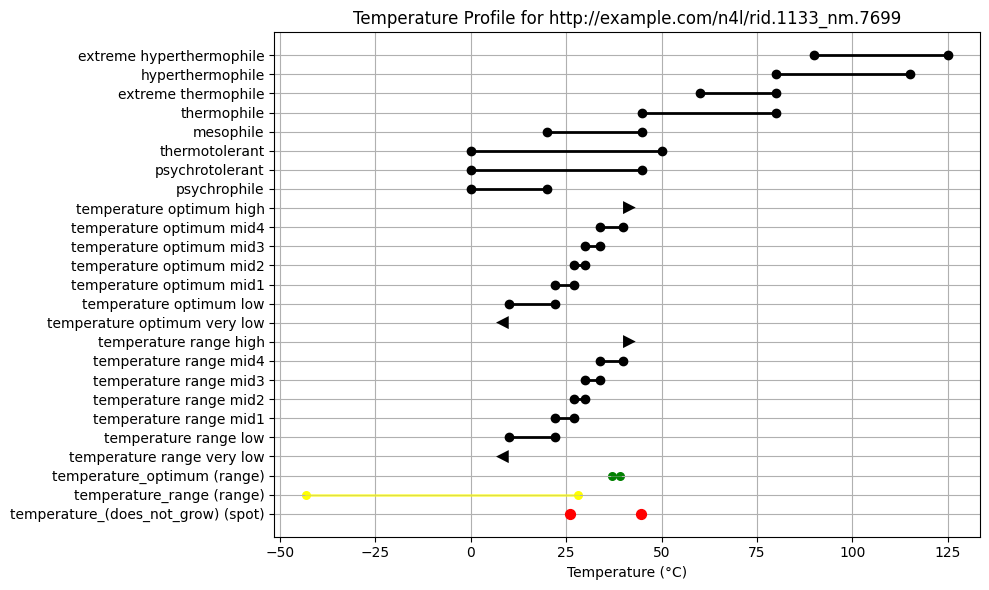


(no protolog XML found)
## http://example.com/n4l/rid.1180_nm.8281
  - Reference ID: rid.1180
  - Taxon Name ID: nm.8281
  - Intra Conflict Score: 11.2
  - Inter Conflict Score: 0


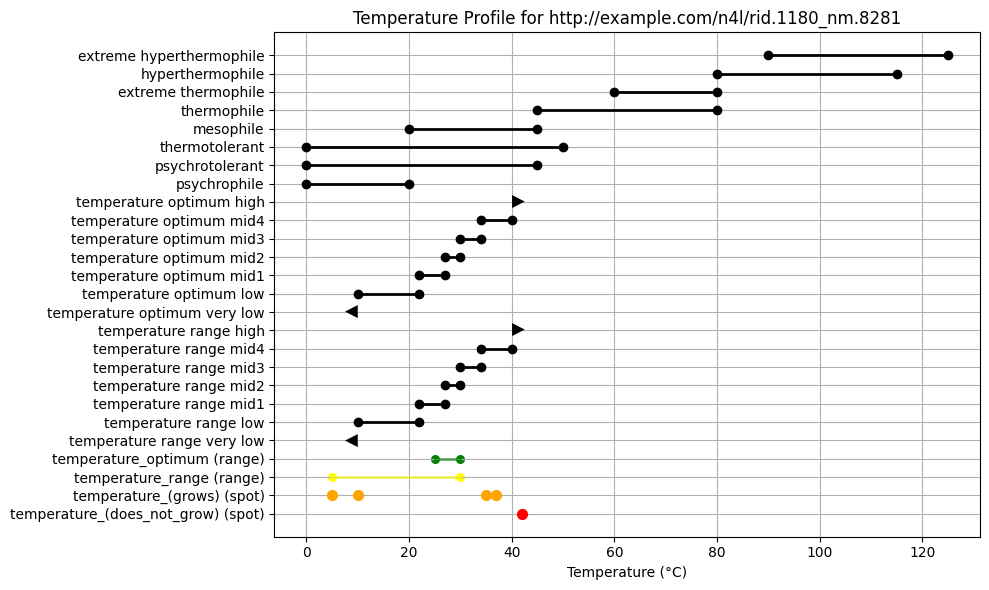


(no protolog XML found)
## http://example.com/n4l/rid.12623_nm.22153
  - Reference ID: rid.12623
  - Taxon Name ID: nm.22153
  - Intra Conflict Score: 8.0
  - Inter Conflict Score: 0


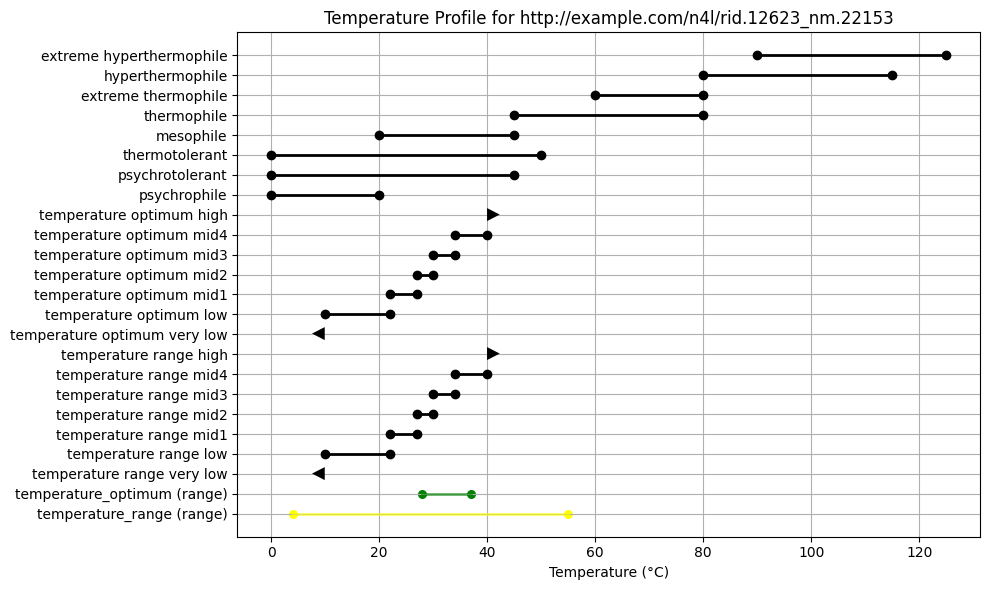


✅ Exact match: rid.12623_nm.22153.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Massilia alkalitolerans</em>
       comb. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Massilia alkalitolerans</em>
       (al.ka.li.to′le.rans. Arabic article 
      <em>al</em>
       the; Arabic n. 
      <em>qaliy</em>
       ashes of saltwort; French n. 
      <em>alcali</em>
       alkali; N.L. n. 
      <em>alkali</em>
       alkali; L. part. adj. 
      <em>tolerans</em>
       tolerating; N.L. part. adj. 
      <em>alkalitolerans</em>
       alkali-tolerating).
    </s>
  </p>
  <p class="nomenclature">
    <s>
      Basonym: 
      <em>Naxibacter alkalitolerans</em>
       Xu 
      <em>et al.</em>
       2005.
    </s>
  </p>
  <p class="description">
    <s>
      The description is identical to that given by Xu 
      <em>et al.</em>
       (2005) with the emen

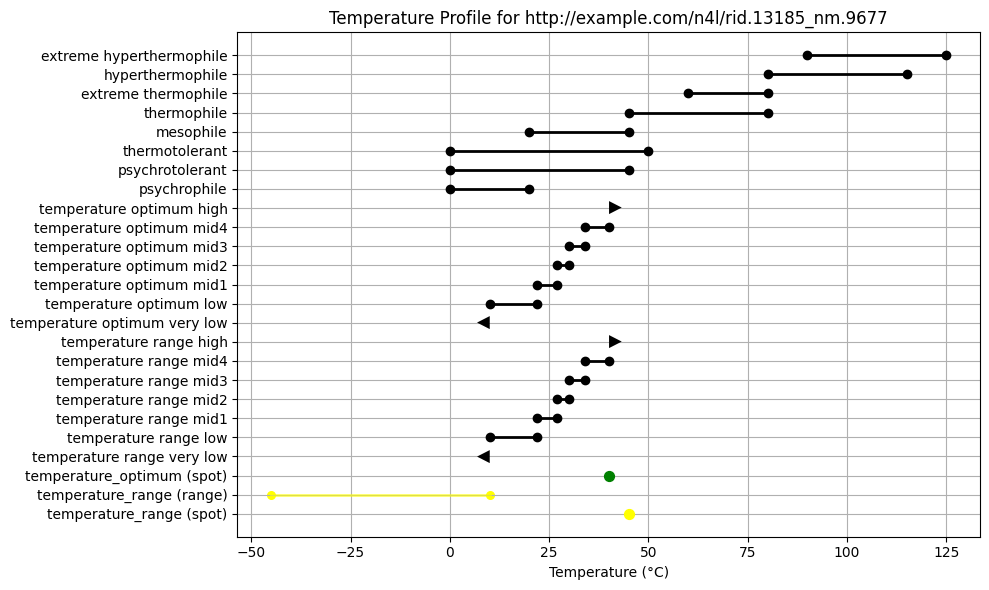


(no protolog XML found)
## http://example.com/n4l/rid.13385_nm.8233
  - Reference ID: rid.13385
  - Taxon Name ID: nm.8233
  - Intra Conflict Score: 11.2
  - Inter Conflict Score: 0


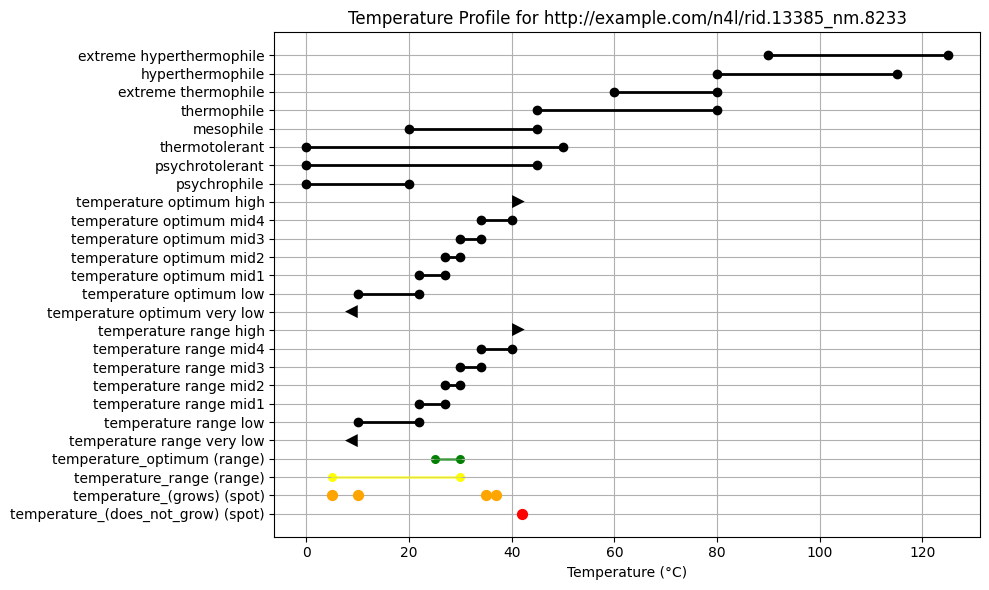


(no protolog XML found)
## http://example.com/n4l/rid.2194_nm.8092
  - Reference ID: rid.2194
  - Taxon Name ID: nm.8092
  - Intra Conflict Score: 11.2
  - Inter Conflict Score: 0


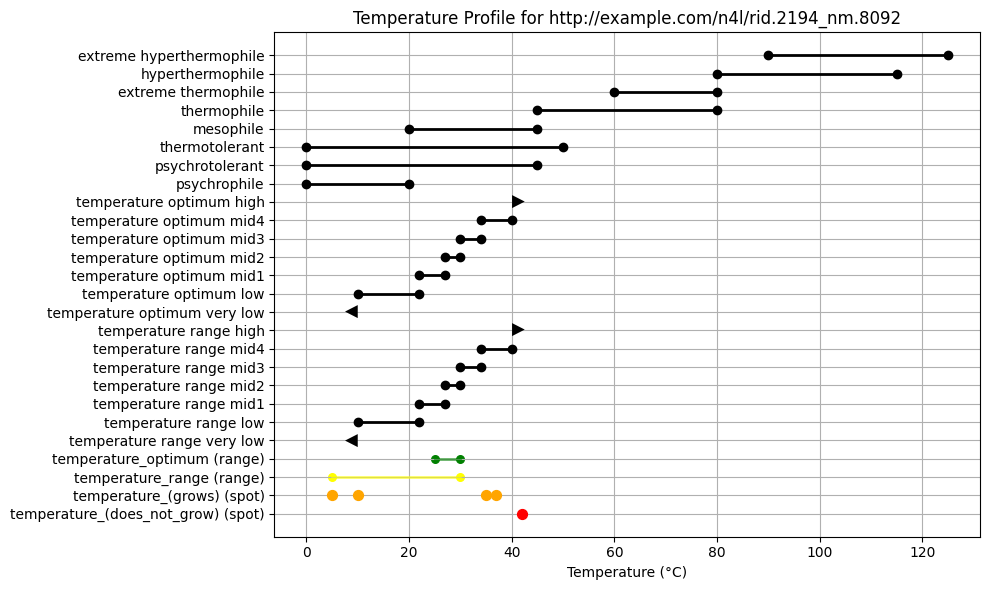


(no protolog XML found)
## http://example.com/n4l/rid.2239_nm.3808
  - Reference ID: rid.2239
  - Taxon Name ID: nm.3808
  - Intra Conflict Score: 8.7
  - Inter Conflict Score: 0


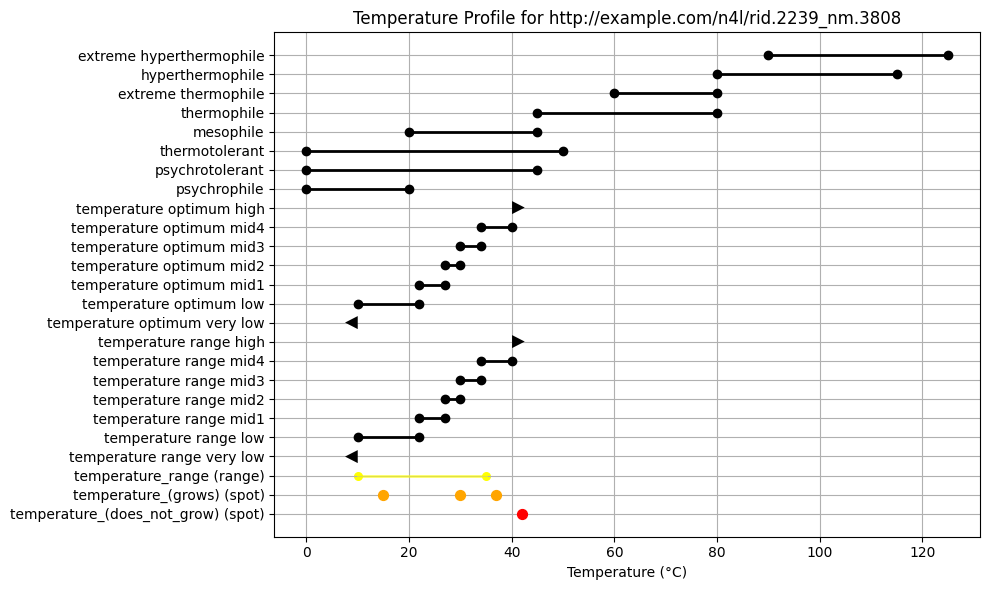


✅ Exact match: rid.2239_nm.3808.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Campylobacter nitrofigilis</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Campylobacter nitrofigilis</i>
       (ni. tro. fig' i. lis. L. n. 
      <i>nitrum</i>
       native mineral salt, native alkali; L. v. 
      <i>figo</i>
       to fix; L. suffix 
      <i>ilis</i>
       ability; M.L.adj. 
      <i>nitrofigilis</i>
       able to fix nitrogen)
    </s>
  </p>
  <p class="description">
    <s>Cells are gram-negative, curved rods 0.2 to 0.9 μm in diameter and 1 to 3 μm long.</s>
    <s>Coccoid bodies are found in old cultures but are not rapidly produced under aerobic conditions.</s>
    <s>Motile with a rapid corkscrew motion.</s>
    <s>Each cell possesses a single polar flagellum.</s>
    <s>Does not swarm.</s>
    <s>Chemoorganotrophic.</s>
    <s>Utiliz

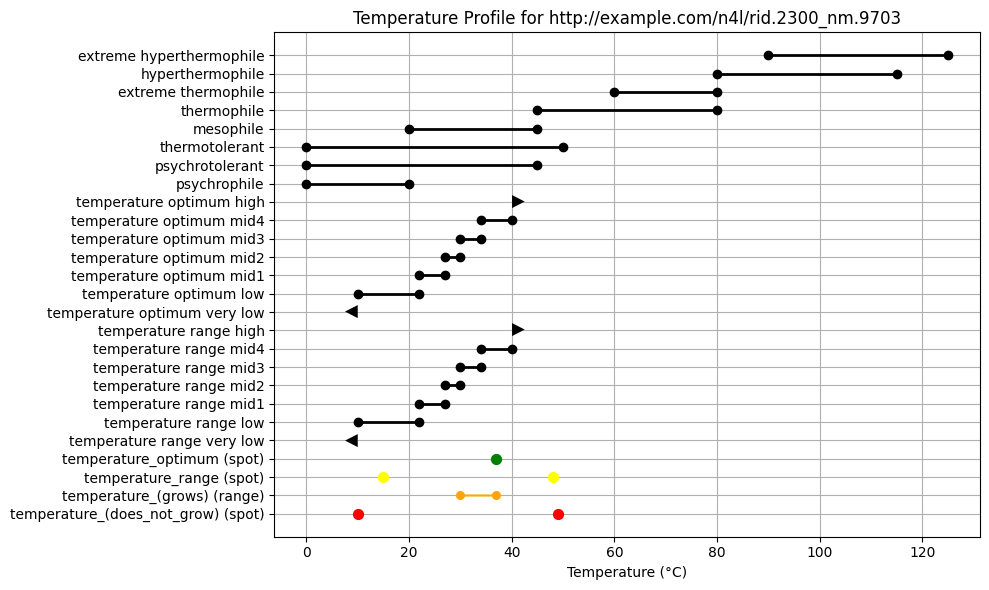


✅ Exact match: rid.2300_nm.9703.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Halobacillus yeomjeoni</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Halobacillus yeomjeoni</em>
       (yeom.jeo′ni. N.L. gen. n. 
      <em>yeomjeoni</em>
       of yeomjeon, the Korean name for a marine solar saltern).
    </s>
  </p>
  <p class="description">
    <s>Cells are rods or long filamentous rods, measuring 0·4–0·6×2·0–100 μm, on MA supplemented with 3 % (w/v) NaCl at 37 °C; a few cells in old cultures are greater than 100 μm in length (Fig. 1).</s>
    <s>Gram-positive, but Gram-variable in old cultures.</s>
    <s>Central or subterminal ellipsoidal endospores are observed in swollen sporangia.</s>
    <s>Colonies are circular, slightly raised, glistening, light yellow in colour and 1–2 mm in size after 2 days incubation at 30–37 °C on MA suppleme

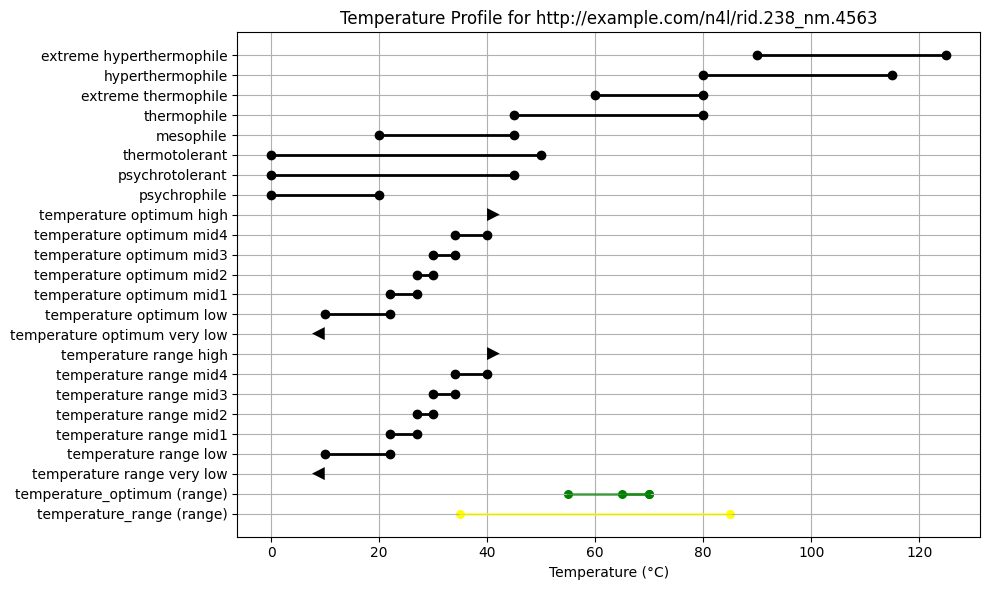


(no protolog XML found)
## http://example.com/n4l/rid.2525_nm.11441
  - Reference ID: rid.2525
  - Taxon Name ID: nm.11441
  - Intra Conflict Score: 5.8
  - Inter Conflict Score: 1


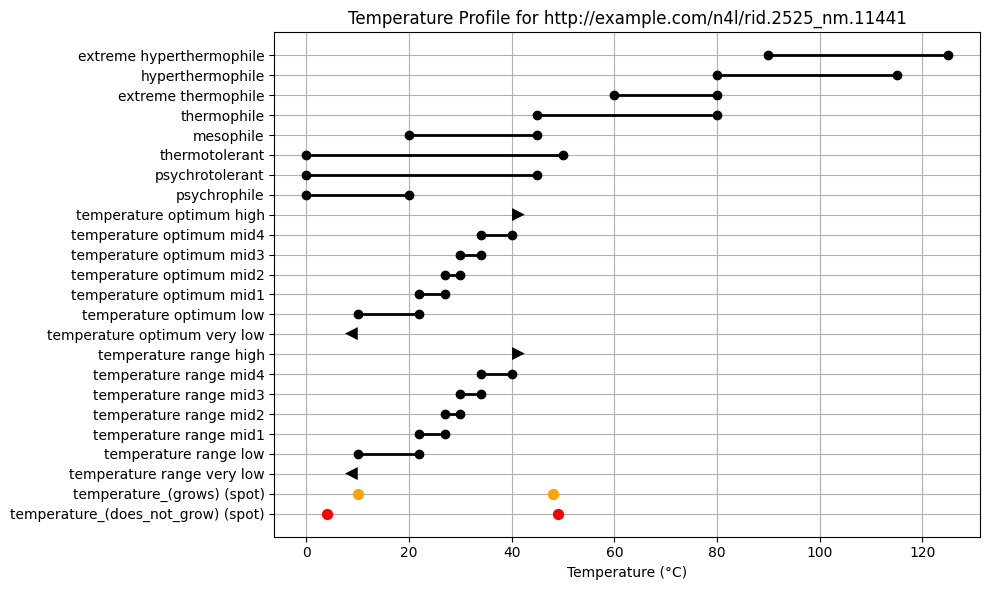


✅ Exact match: rid.2525_nm.11441.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Microbulbifer celer</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Microbulbifer celer</em>
       (ce′ler. L. masc. adj. 
      <em>celer</em>
       rapid, pertaining to fast growth).
    </s>
  </p>
  <p class="description">
    <s>Cells are Gram-negative and rod-shaped (0.2–0.4×0.8–3.5 μm).</s>
    <s>Colonies on MA are circular to slightly irregular, slightly convex, smooth, glistening, greyish yellow in colour and 3.0–4.0 mm in diameter after 2 days incubation at 37 °C.</s>
    <s>Growth occurs at 10 and 48 °C, but not at 4 or 49 °C.</s>
    <s>The optimal pH for growth is between 7.0 and 8.0; growth occurs at pH 5.0, but not at pH 4.5.</s>
    <s>Growth occurs in the presence of 15 % (w/v) NaCl, but not in the absence of NaCl or in the presence of more t

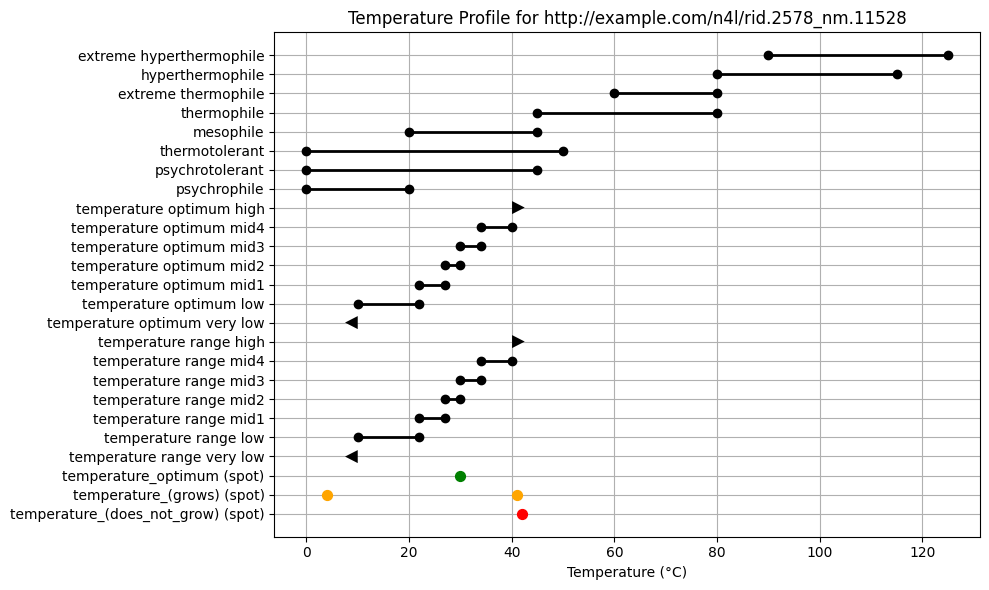


✅ Exact match: rid.2578_nm.11528.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Salegentibacter salarius</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Salegentibacter salarius</em>
       (sa.la′ri.us. L. masc. adj. 
      <em>salarius</em>
       of, or belonging to, salt).
    </s>
  </p>
  <p class="description">
    <s>Cells are Gram-negative rods that are 0.4–0.6 μm in diameter and 0.7–4.0 μm in length and devoid of gliding motility.</s>
    <s>Colonies on MA supplemented with 6 % (w/v) NaCl are circular, convex, smooth, glistening, yellow in colour and 0.8–1.2 mm in diameter after 7 days incubation at 30 °C.</s>
    <s>Optimal growth occurs at 30 °C.</s>
    <s>Growth occurs at 4 and 41 °C, but not at 42 °C.</s>
    <s>Optimal pH for growth is 7.0–8.0; growth occurs at pH 5.5, but not at pH 5.0.</s>
    <s>Optimal growth occurs in t

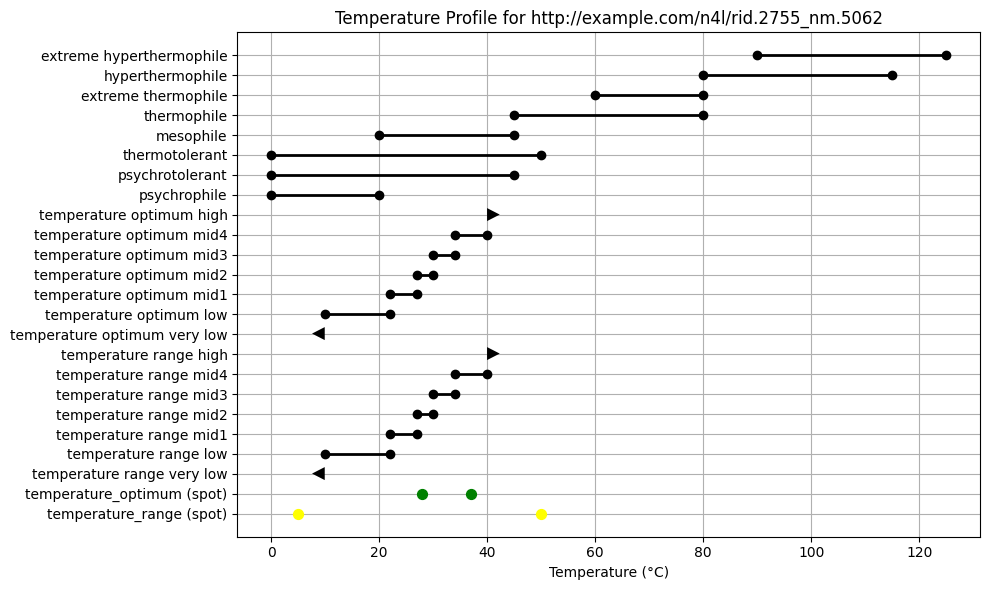


✅ Exact match: rid.2755_nm.5062.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of the genus 
      <em>Virgibacillus</em>
       Heyndrickx 
      <em>et al.</em>
       1998
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Virgibacillus</em>
       (Vir.gi.ba.cil′lus. L. n. 
      <em>virga</em>
       a green twig, transf., a branch in a family tree; L. dim. n. 
      <em>bacillus</em>
       from 
      <em>Bacillus</em>
      , a genus of aerobic endospore-forming bacteria; N.L. n. 
      <em>Virgibacillus</em>
       a branch of the genus 
      <em>Bacillus</em>
      ).
    </s>
  </p>
  <p class="description">
    <s>Cells are motile, Gram-positive rods (0·3–0·7×2–6 μm) that occur singly, in pairs or short chains or filaments.</s>
    <s>They bear oval to ellipsoidal endospores that lie in swollen sporangia.</s>
    <s>Colonies are small, circular, low-convex 

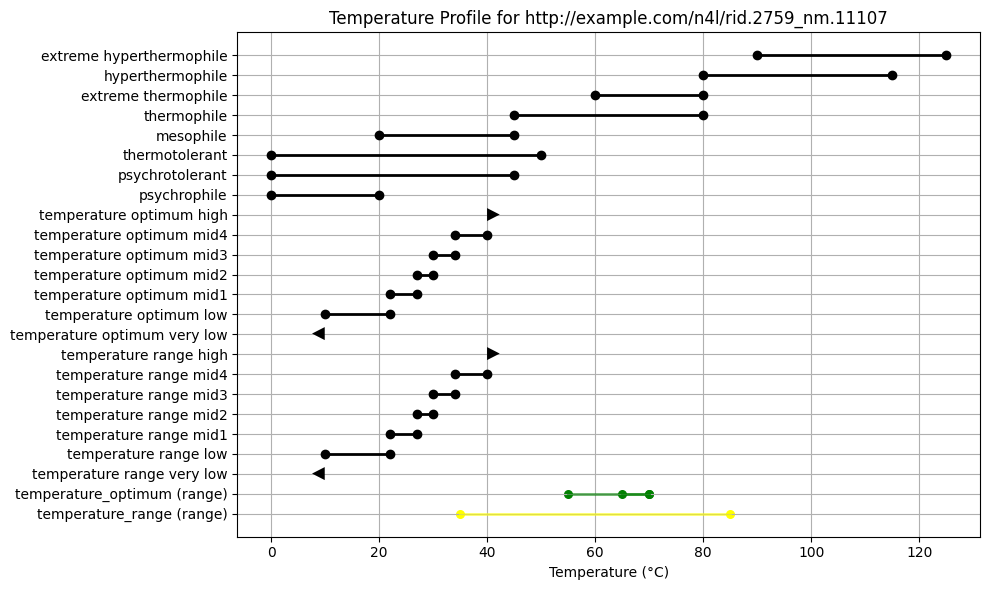


✅ Exact match: rid.2759_nm.11107.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>Emendation of the species description of Thermoanaerobacter brockii Zeikus, Hegge, and Anderson 1979; Lee, Jain, Lee, Lowe, and Zeikus 1993.</s>
  </p>
  <p class="etymology">
    <s>
      Thermoanaerobacter brockii (brock'i.i. M. L. gen. n. 
      <i>brockii</i>
      , of Brock, named for Thomas Dale Brock, who performed pioneering studies on the physiological ecology of extreme thermophiles)
    </s>
  </p>
  <p class="description">
    <s>Rods are 0.4 to 1.0 by 1 to 20 μm.</s>
    <s>Cells occur singly, in pairs, in short chains, and in filaments.</s>
    <s>Gram positive.</s>
    <s>Heat-resistant terminal endospores are formed.</s>
    <s>Colonies are circular and 0.2 to 4 mm in diameter.</s>
    <s>Thermophilic.</s>
    <s>The optimum growth temperature is 55 to 70°C; the temperature range for growth is 35 to 85°C.</

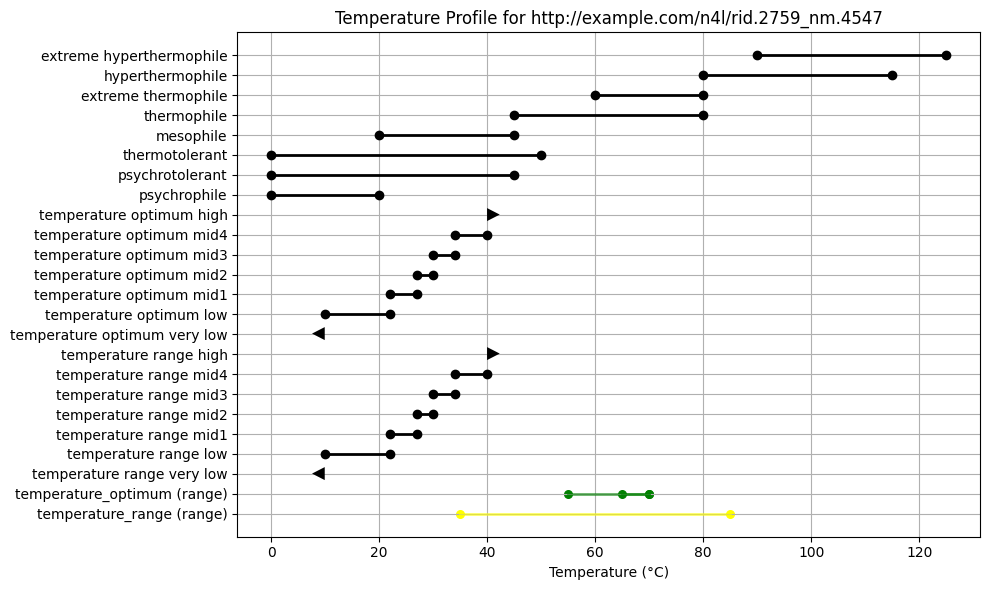


🟡 Partial matches for rid.2759, nm.4547:
   - rid.2759_nm.11107.xml
   - rid.2759_nm.4549.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>Emendation of the species description of Thermoanaerobacter brockii Zeikus, Hegge, and Anderson 1979; Lee, Jain, Lee, Lowe, and Zeikus 1993.</s>
  </p>
  <p class="etymology">
    <s>
      Thermoanaerobacter brockii (brock'i.i. M. L. gen. n. 
      <i>brockii</i>
      , of Brock, named for Thomas Dale Brock, who performed pioneering studies on the physiological ecology of extreme thermophiles)
    </s>
  </p>
  <p class="description">
    <s>Rods are 0.4 to 1.0 by 1 to 20 μm.</s>
    <s>Cells occur singly, in pairs, in short chains, and in filaments.</s>
    <s>Gram positive.</s>
    <s>Heat-resistant terminal endospores are formed.</s>
    <s>Colonies are circular and 0.2 to 4 mm in diameter.</s>
    <s>Thermophilic.</s>
    <s>The optimum growth temperature is 55 t

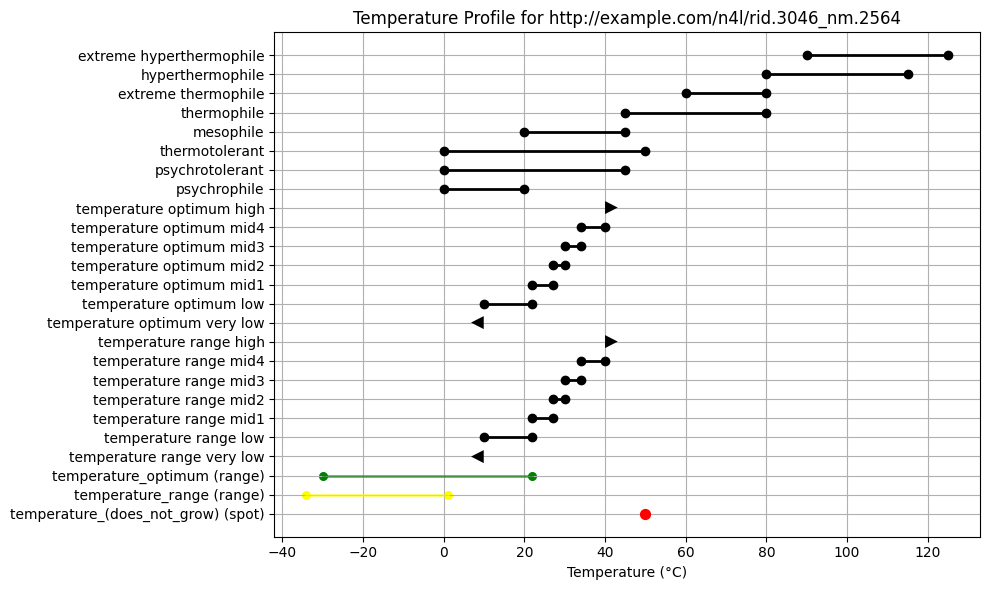


🟡 Partial matches for rid.3046, nm.2564:
   - rid.6587_nm.2564.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of 
      <em>Pseudomonas asplenii</em>
       (Ark and Tompkins 1946) Savulescu 1947
    </s>
  </p>
  <p class="etymology"/>
  <p class="description">
    <s>Has the following properties in addition to those given previously (Ark &amp; Tompkins, 1946).</s>
    <s>Oxidase-positive.</s>
    <s>
      By API 20NE, indole and 
      <em>β</em>
      -galactosidase are not produced, aesculin and gelatin are not hydrolysed and fermentation of d-glucose and assimilation of adipate are negative.
    </s>
    <s>Caprate, malate and citrate are assimilated.</s>
    <s>
      Assimilation (API 50 CH) is positive for glycerol, d-glucose, d-fructose and gluconate, and negative for erythritol, d-arabinose, l-xylose, adonitol, methyl 
      <em>β</em>
      -xyloside, l-sorbose, l-

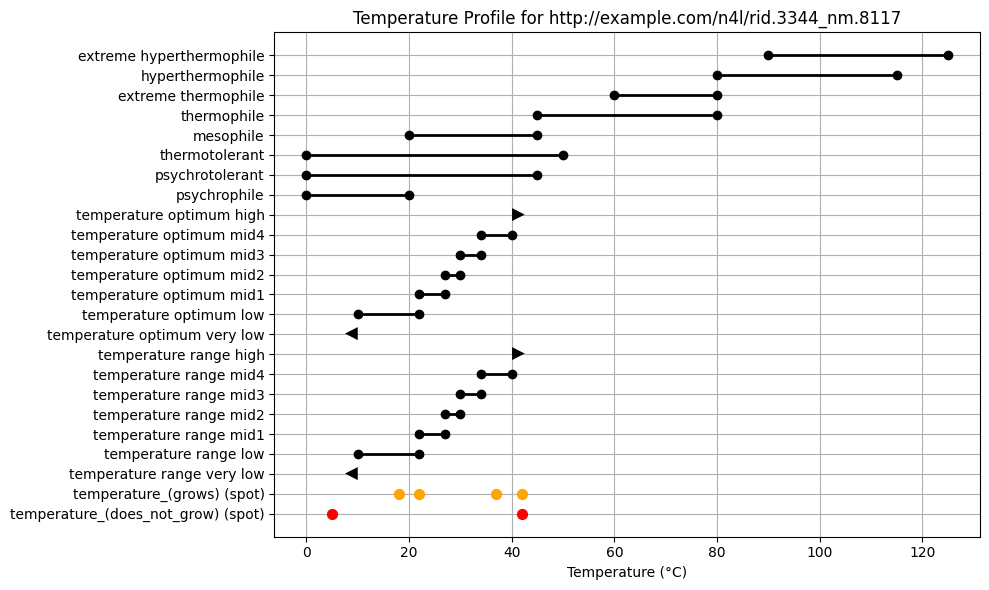


✅ Exact match: rid.3344_nm.8117.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Flavobacterium thalpophilum</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Flavobacterium thalpophilum</i>
       (thal.po'phi.lum. Gr. n. 
      <i>thalpos</i>
       warmth; Gr. n. adj. 
      <i>philon</i>
       loving; M. L. n. adj. 
      <i>thalpophilum</i>
       warmth-loving)
    </s>
  </p>
  <p class="description">
    <s>The characteristics for which all seven strains of the species gave either positive results or negative results are given below.</s>
    <s>Characteristics for which the seven strains gave different results are given in Table 2.</s>
  </p>
  <p class="description">
    <s>Gram-negative, nonsporeforming rods of regular shape with rounded ends.</s>
    <s>Nonmotile in hanging-drop preparations after overnight growth in nutrient broth inc

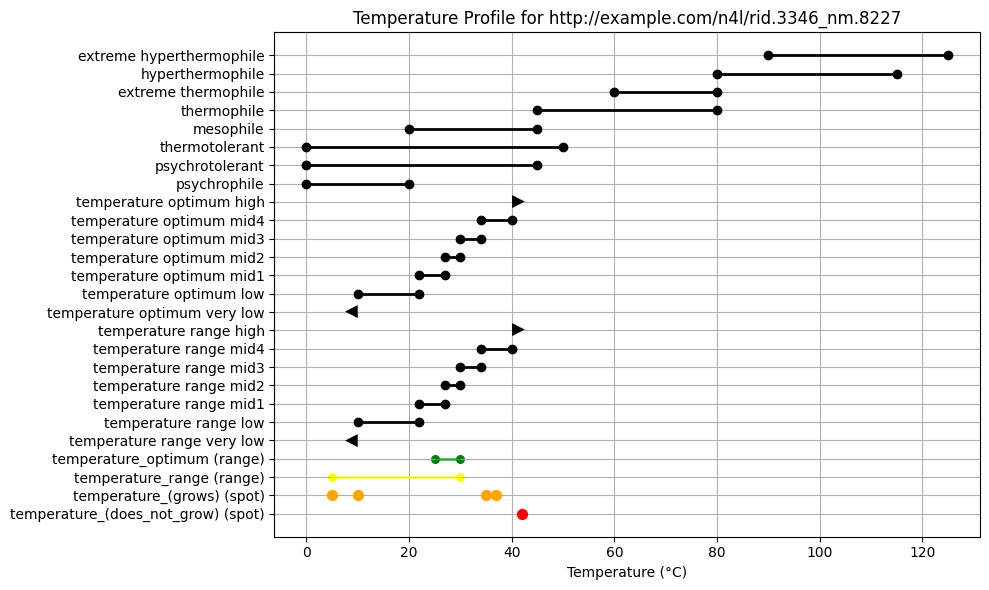


🟡 Partial matches for rid.3346, nm.8227:
   - rid.3346_nm.8226.xml
   - rid.3346_nm.8230.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Sphingobacterium faecium</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Sphingobacterium faecium</i>
       (fae'ci.um. L. n. 
      <i>faecis</i>
      , dregs; L. gen. pl. n, 
      <i>faecium</i>
      , of the dregs, of feces)
    </s>
  </p>
  <p class="description">
    <s>Cells are gram-negative, nonsporing rods 0.4-0.5 X 0.5-1.0 μm.</s>
    <s>Nonmotile, nongliding (no sliding translocation occurs).</s>
    <s>Aerobic.</s>
    <s>Circular, entire, low convex, smooth and opaque colonies developing on nutrient agar after 2 days; on nutrient agar, a yellow or creamy white, nonfluorescent pigment is produced.</s>
    <s>Grows at 5°C and 37°C but not at 42°C.</s>
    <s>Catalase, oxidase, urease, extracell

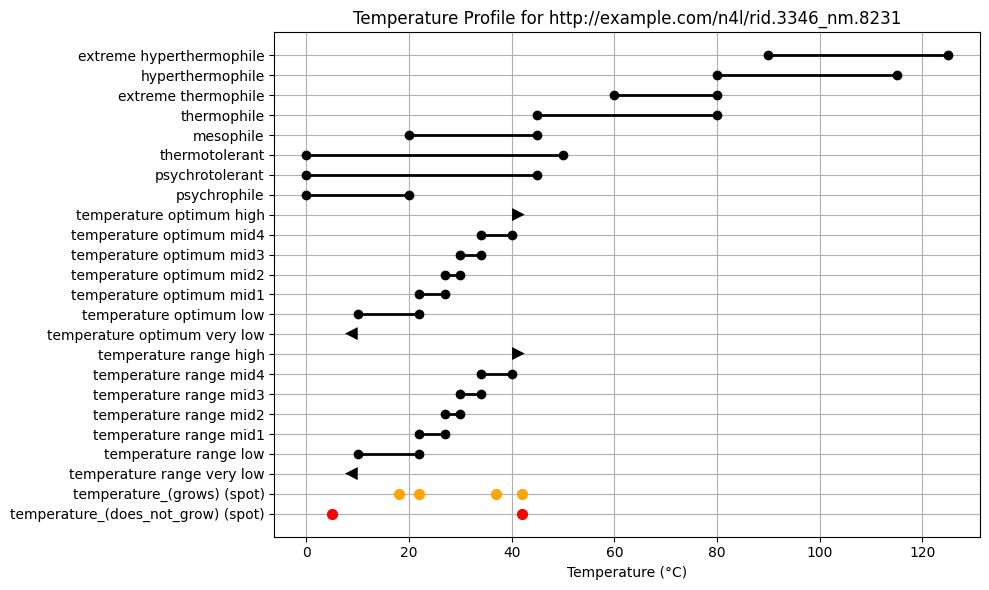


🟡 Partial matches for rid.3346, nm.8231:
   - rid.3346_nm.8226.xml
   - rid.3346_nm.8230.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Sphingobacterium faecium</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Sphingobacterium faecium</i>
       (fae'ci.um. L. n. 
      <i>faecis</i>
      , dregs; L. gen. pl. n, 
      <i>faecium</i>
      , of the dregs, of feces)
    </s>
  </p>
  <p class="description">
    <s>Cells are gram-negative, nonsporing rods 0.4-0.5 X 0.5-1.0 μm.</s>
    <s>Nonmotile, nongliding (no sliding translocation occurs).</s>
    <s>Aerobic.</s>
    <s>Circular, entire, low convex, smooth and opaque colonies developing on nutrient agar after 2 days; on nutrient agar, a yellow or creamy white, nonfluorescent pigment is produced.</s>
    <s>Grows at 5°C and 37°C but not at 42°C.</s>
    <s>Catalase, oxidase, urease, extracell

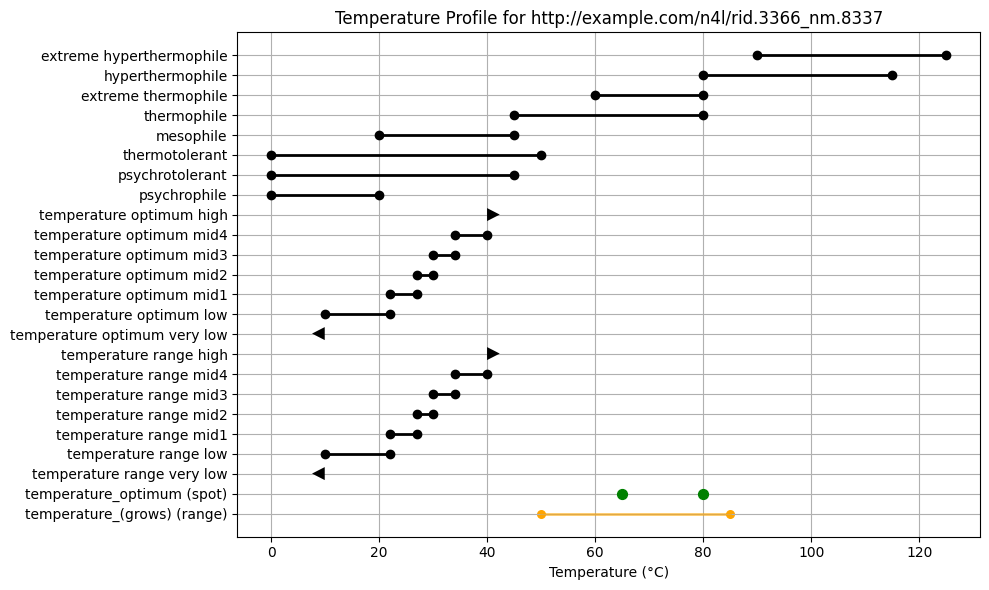


✅ Exact match: rid.3366_nm.8337.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Rhodothermus marinus</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Rhodothermus marinus</i>
       (ma. ri'nus, L. masc. adj. 
      <i>marinus</i>
       thriving in the sea, describing its biotope)
    </s>
  </p>
  <p class="description">
    <s>Description as for the genus.</s>
    <s>Cells never occur in chains or filaments.</s>
    <s>Optimal growth at 65 °C and pH 7 and about 2% (w/v) NaCl.</s>
    <s>Growth occurs at 6% (w/v) NaCl.</s>
    <s>The natural habitat is submarine alkaline hot springs.</s>
  </p>
  <p class="description">
    <s>
      The type strain is 
      <i>Rhodothermus marinus</i>
      , DSM 4252 (ATCC 43812) (isolated from a submarine hot spring at Reykjanes, NW Iceland).
    </s>
  </p>
</content>

## http://example.com/n4l/rid.4206_n

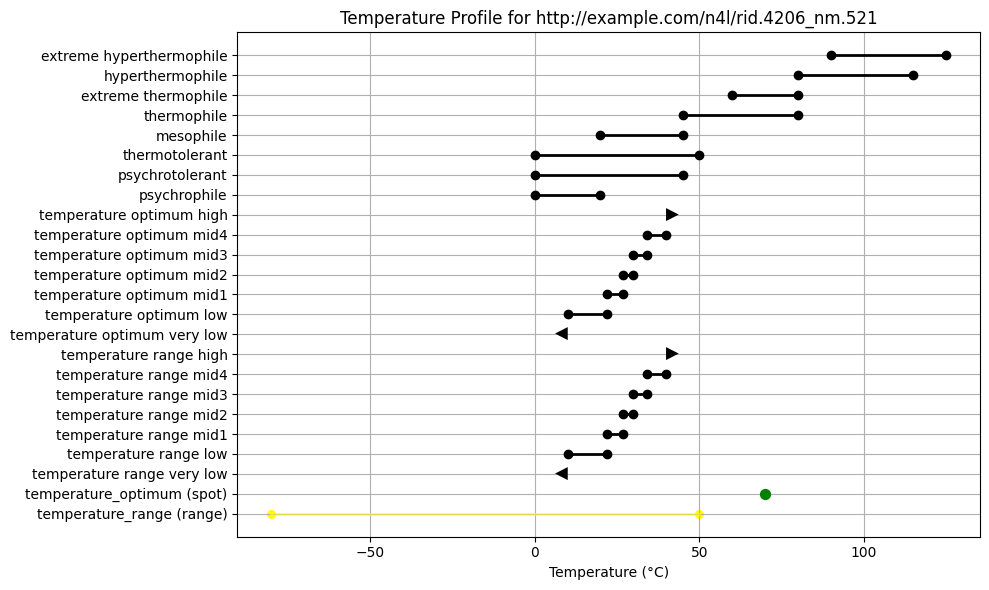


🟡 Partial matches for rid.4206, nm.521:
   - rid.4206_nm.525.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Thermus igniterrae</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Thermus igniterrae</i>
       (ig.ni.ter'rae. L. n. 
      <i>ignis</i>
       fire; L. fem. n. 
      <i>terra</i>
       land/earth; M.L. gen. fem. n. 
      <i>igniterrae</i>
       of the land of fire, referring to Iceland)
    </s>
  </p>
  <p class="description">
    <s>
      <i>T. igniterrae</i>
       strains form rod-shaped cells of variable length that are 0.5-0.8 μm wide.
    </s>
    <s>Filaments are also present.</s>
    <s>Gram stain is negative.</s>
    <s>The cells are nonmotile and spores are not formed.</s>
    <s>
      Colonies on 
      <i>Thermus</i>
       medium are yellow-pigmented and 1-2 mm in diameter after 72 h growth.
    </s>
    <s>
      

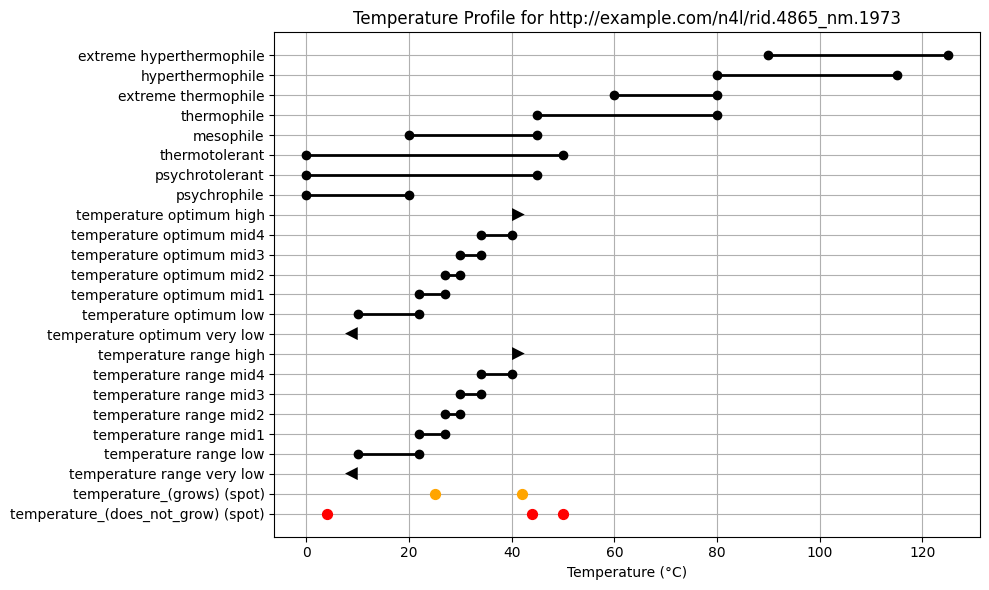


✅ Exact match: rid.4865_nm.1973.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Laribacter hongkongensis</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Laribacter hongkongensis</i>
       (
      <i>hongkongensis</i>
      , in honor of Hong Kong, means the place where the bacterium was discovered)
    </s>
  </p>
  <p class="description">
    <s>Cells are facultatively anaerobic, nonsporulating, gram-negative, seagull-shaped or spiral rods.</s>
    <s>The bacterium grows on sheep blood agar as nonhemolytic, gray colonies 1 mm in diameter after 24 h of incubation at 37°C in ambient air.</s>
    <s>Growth also occurs on MacConkey agar and at 25 and 42°C but not at 4, 44, and 50.</s>
    <s>It can grow in 1 or 2% NaCl but not in 3, 4, or 5% NaCl.</s>
    <s>
      No enhancement of growth is observed with 5% CO
      <sub>2</sub>
      .
    </s

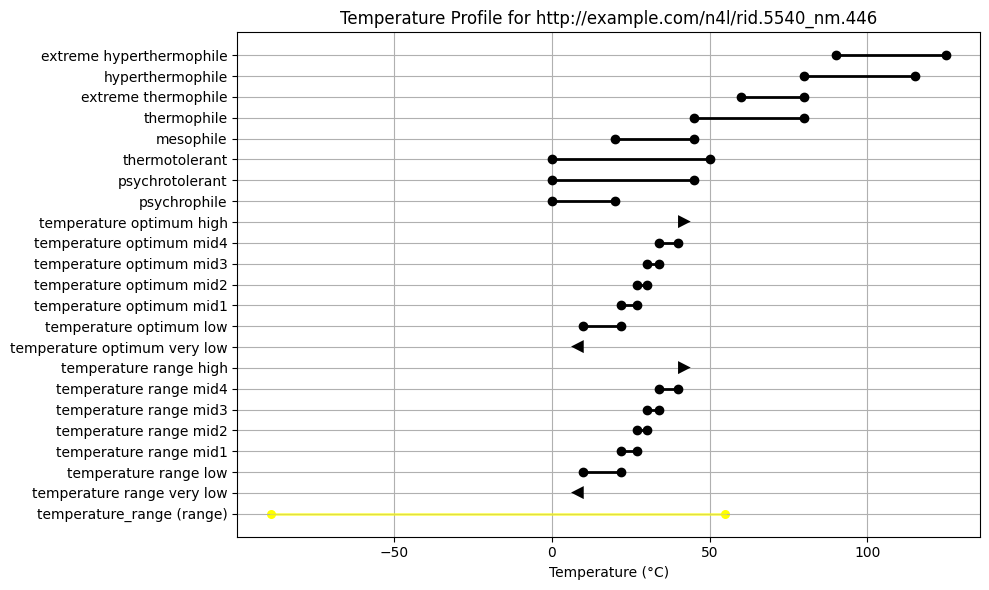


✅ Exact match: rid.5540_nm.446.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Thermocrinis albus</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Thermocrinis albus</i>
       (al'bus. gr. 
      <i>alphos</i>
      , white, referring to the cell color)
    </s>
  </p>
  <p class="description">
    <s>Rod-shaped cells are usually between 1 and 3 μm long and 0.5 to 0.6 μm wide.</s>
    <s>Spores are not formed.</s>
    <s>Motile by means of a monopolar monotrichous flagellum.</s>
    <s>Cells occur singly, in pairs, and in aggregates consisting of up to several hundred individuals.</s>
    <s>In a permanent flow of medium, cells grow predominately as long filaments, forming visible whitish cell masses.</s>
    <s>No evidence of a regularly arrayed surface layer protein.</s>
    <s>Growth occurred at temperatures between 55° and 89°C and at salin

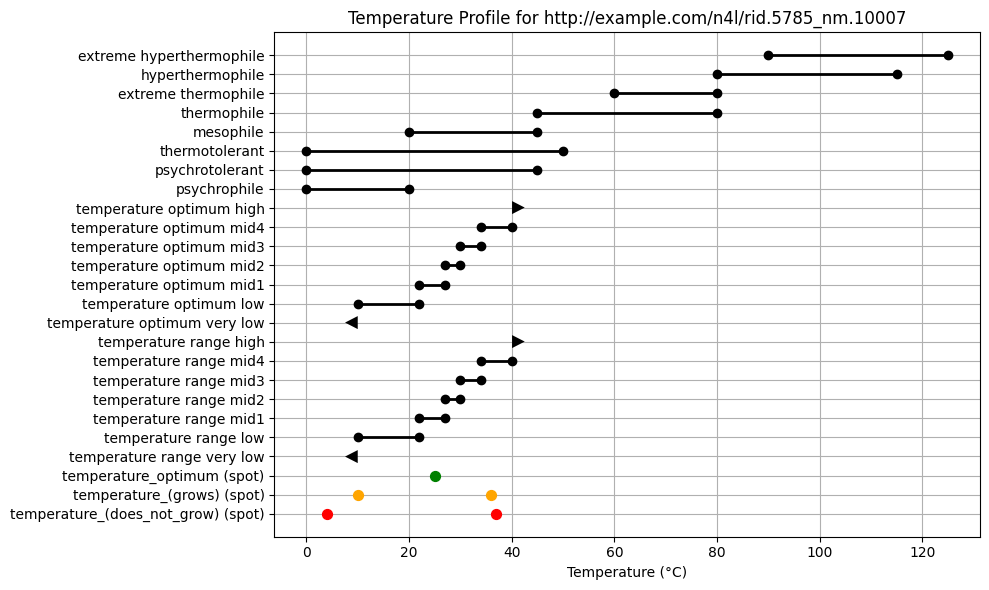


✅ Exact match: rid.5785_nm.10007.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Algoriphagus terrigena</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Algoriphagus terrigena</em>
       (ter.ri.ge′na. L. masc. or fem. n. 
      <em>terrigena</em>
       child of the earth, referring to the isolation of the type strain from soil).
    </s>
  </p>
  <p class="description">
    <s>Cells are Gram-negative, non-spore-forming, non-flagellated short rods or rods (0·4–0·6×0·8–2·5 μm); a few cells greater than 50 μm in length are also observed.</s>
    <s>Colonies on MA are circular, convex, smooth, glistening, light orange in colour and 1·0–2·0 mm in diameter after incubation for 7 days at 25 °C.</s>
    <s>Optimal growth occurs at 25 °C; growth occurs at 10 and 36 °C, but not at 4 or 37 °C.</s>
    <s>Optimal pH for growth is 6·5–7·5; growth occur

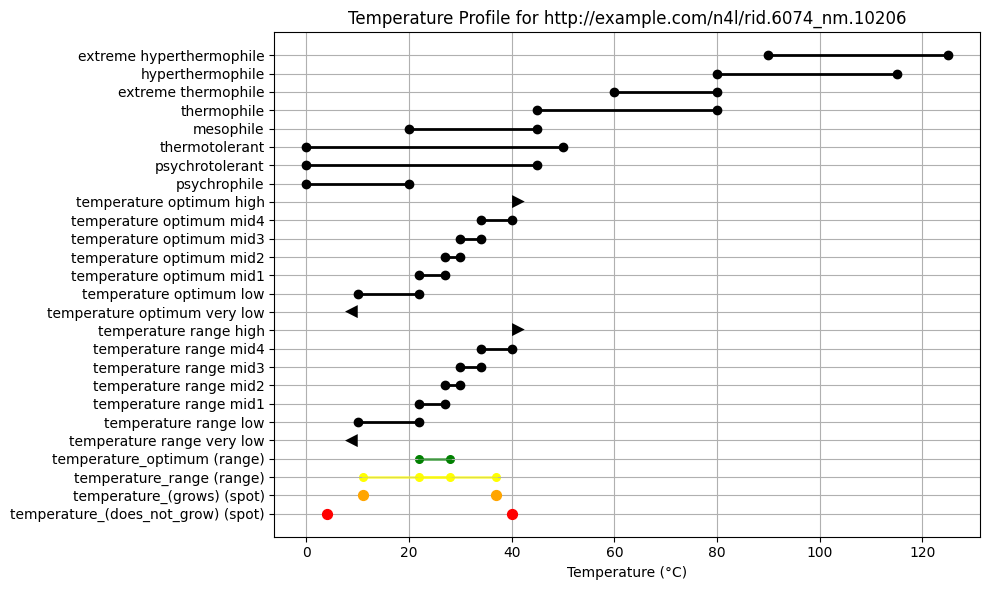


✅ Exact match: rid.6074_nm.10206.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Catenulispora acidiphila</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Catenulispora acidiphila</em>
       (a.ci.di′phi.la. N.L. neut. n. 
      <em>acidum</em>
       acid; Gr. adj. 
      <em>philos</em>
       loving; N.L. fem. adj. 
      <em>acidiphila</em>
       acid-loving).
    </s>
  </p>
  <p class="description">
    <s>Chemotaxonomic and general characteristics are the same as given above for the genus.</s>
    <s>Acidophilic: grows well in a pH range from 4.3 to 6.8, optimal around 6.0.</s>
    <s>Mesophilic: best growth occurs at 22–28 °C, but significant growth can also be observed at 11 and 37 °C; no growth occurs at 4 or 40 °C.</s>
    <s>Aerial hyphae are relatively short, straight to flexuous and produce chains of more than 20 cylindrical a

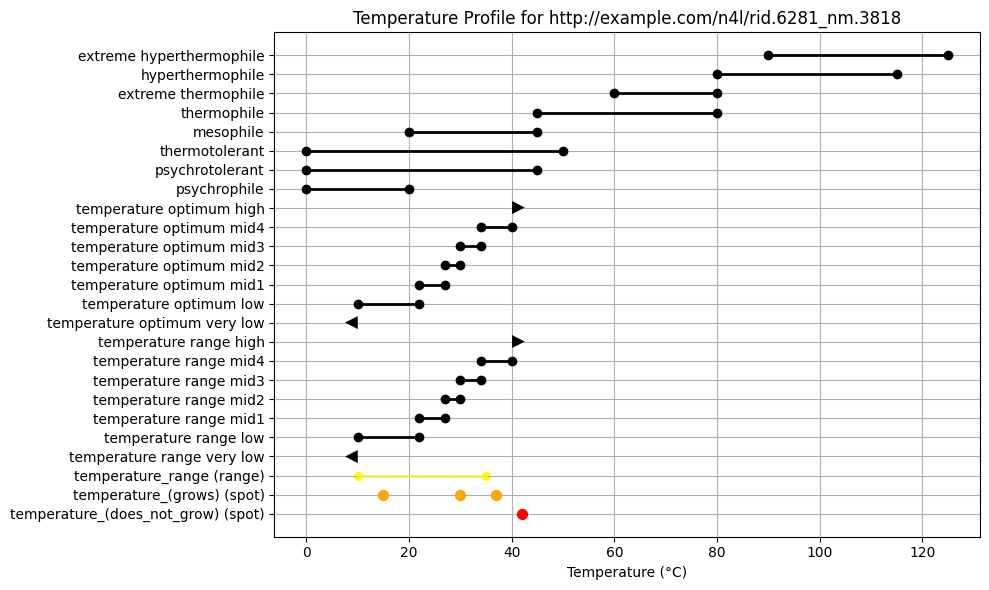


🟡 Partial matches for rid.6281, nm.3818:
   - rid.6281_nm.3786.xml
   - rid.6281_nm.3817.xml
   - rid.6281_nm.3832.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of the genus 
      <i>Campylobacter</i>
       Sebald and Veron 1963.
    </s>
  </p>
  <p class="etymology">
    <s>
      Slender, spirally curved, gram-negative rods that are 0.2 to 0.5 μm wide and 0.5 to 5 μm long. The rods may have one or more spirals and can be as long as 8 μm. They also appear to be S shaped and gull winged when two cells form short chains. Nonsporeforming. Cells in old cultures may form spherical or coccoid bodies. Motile (with a characteristic corkscrewlike, darting motion) by means of a single polar unsheathed flagellum at one or both ends of the cell. Microaerophilic to anaerobic with a respiratory type of metabolism. Growth at 37°C; no growth at 15°C. An O
      <sub>2</sub>
       concen

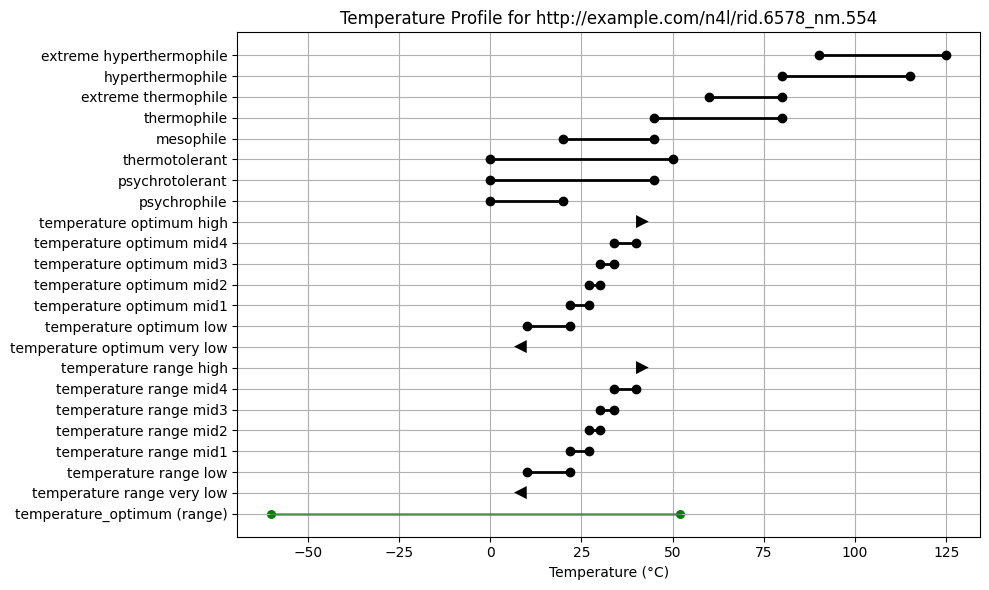


(no protolog XML found)
## http://example.com/n4l/rid.6587_nm.2564
  - Reference ID: rid.6587
  - Taxon Name ID: nm.2564
  - Intra Conflict Score: 10.7
  - Inter Conflict Score: 0


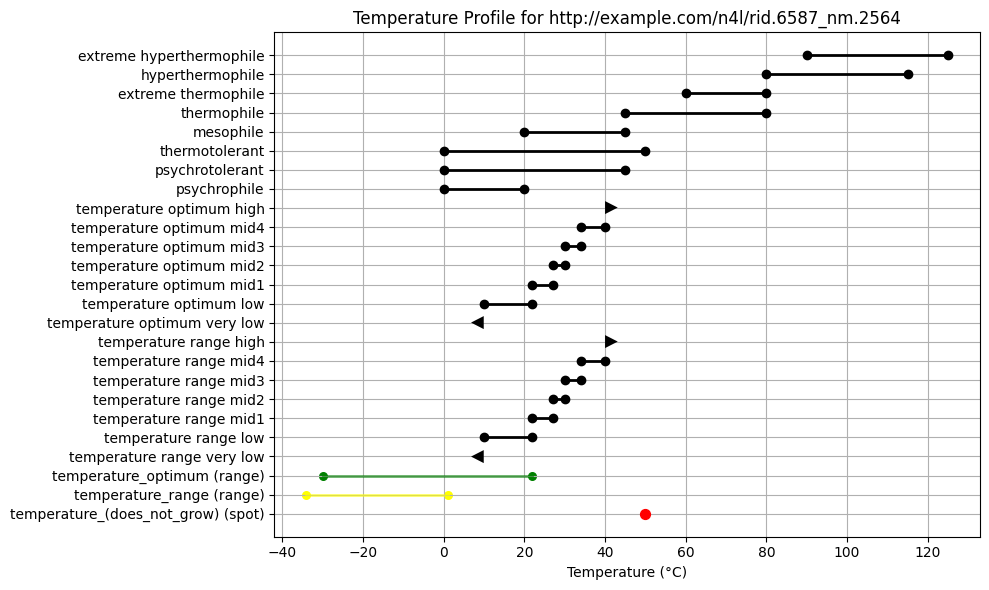


✅ Exact match: rid.6587_nm.2564.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of 
      <em>Pseudomonas asplenii</em>
       (Ark and Tompkins 1946) Savulescu 1947
    </s>
  </p>
  <p class="etymology"/>
  <p class="description">
    <s>Has the following properties in addition to those given previously (Ark &amp; Tompkins, 1946).</s>
    <s>Oxidase-positive.</s>
    <s>
      By API 20NE, indole and 
      <em>β</em>
      -galactosidase are not produced, aesculin and gelatin are not hydrolysed and fermentation of d-glucose and assimilation of adipate are negative.
    </s>
    <s>Caprate, malate and citrate are assimilated.</s>
    <s>
      Assimilation (API 50 CH) is positive for glycerol, d-glucose, d-fructose and gluconate, and negative for erythritol, d-arabinose, l-xylose, adonitol, methyl 
      <em>β</em>
      -xyloside, l-sorbose, l-rhamnose, dulcitol, inositol, d

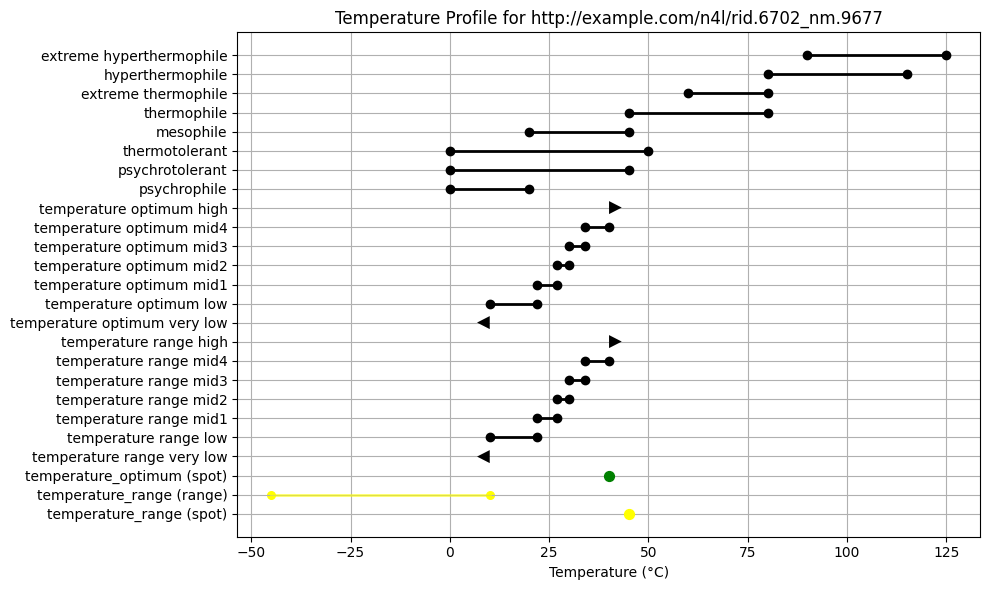


(no protolog XML found)
## http://example.com/n4l/rid.6717_nm.11107
  - Reference ID: rid.6717
  - Taxon Name ID: nm.11107
  - Intra Conflict Score: 8.5
  - Inter Conflict Score: 0


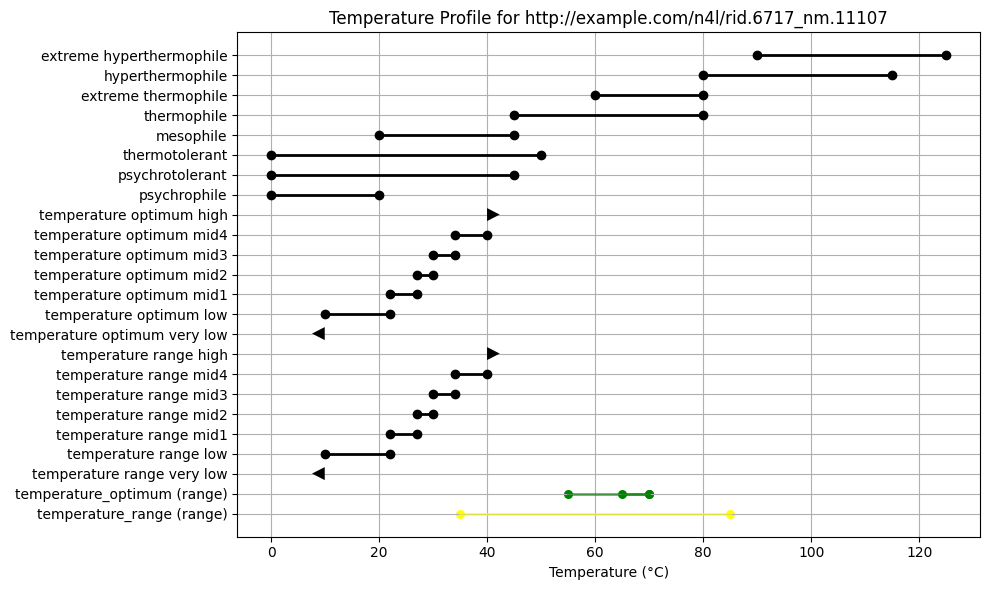


🟡 Partial matches for rid.6717, nm.11107:
   - rid.2759_nm.11107.xml
   - rid.6717_nm.4515.xml
   - rid.6717_nm.4517.xml
   - rid.6717_nm.4544.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>Emendation of the species description of Thermoanaerobacter brockii Zeikus, Hegge, and Anderson 1979; Lee, Jain, Lee, Lowe, and Zeikus 1993.</s>
  </p>
  <p class="etymology">
    <s>
      Thermoanaerobacter brockii (brock'i.i. M. L. gen. n. 
      <i>brockii</i>
      , of Brock, named for Thomas Dale Brock, who performed pioneering studies on the physiological ecology of extreme thermophiles)
    </s>
  </p>
  <p class="description">
    <s>Rods are 0.4 to 1.0 by 1 to 20 μm.</s>
    <s>Cells occur singly, in pairs, in short chains, and in filaments.</s>
    <s>Gram positive.</s>
    <s>Heat-resistant terminal endospores are formed.</s>
    <s>Colonies are circular and 0.2 to 4 mm in diameter.</s>
    <s>Thermophil

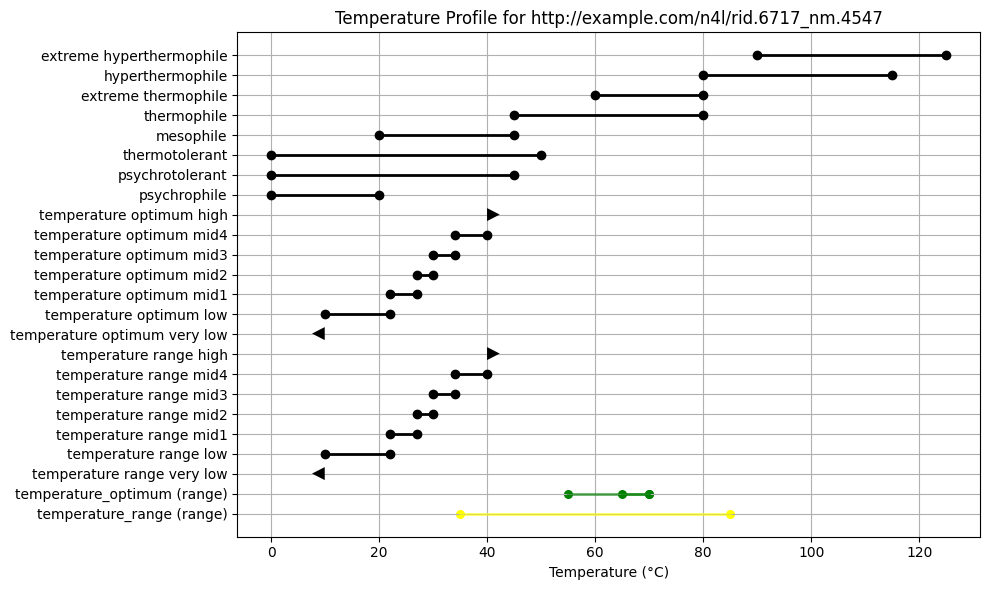


🟡 Partial matches for rid.6717, nm.4547:
   - rid.6717_nm.4515.xml
   - rid.6717_nm.4517.xml
   - rid.6717_nm.4544.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Thermoanaerobacterium saccharolyticum</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Thermoanaerobacterium saccharolyticum</i>
       (sac.cha.ro. ly'ti-cum. Gr. n. 
      <i>sacchar</i>
      , sugar; Gr. adj. 
      <i>lyticus</i>
      , dissolving; N.L. neut. adj. 
      <i>saccharolyticum</i>
      , sugar dissolving)
    </s>
  </p>
  <p class="description">
    <s>Cellular characteristics.</s>
    <s>Rods (approximately 0.8 to 1.0 by 3.0 to 15 μm; some cells are occasionally as long as 30 μm).</s>
    <s>Elongated cell morphology occurs during nutrient limitation or stationary phase.</s>
    <s>The cell walls contain three electron-dense layers that are 5 nm thick and alternat

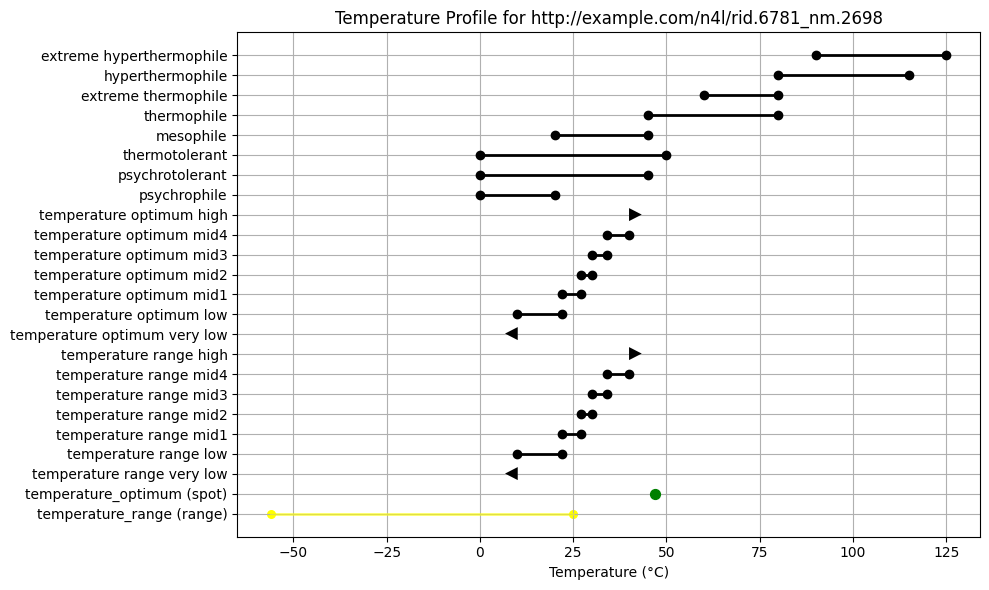


✅ Exact match: rid.6781_nm.2698.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Pseudomonas thermotolerans</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Pseudomonas thermotolerans</i>
       (ther.mo.to'le.rans. Gr. n. 
      <i>therme</i>
       heat; L. pres. part. 
      <i>tolerans</i>
       tolerating; N.L. adj. 
      <i>thermotolerans</i>
       able to tolerate high temperatures)
    </s>
  </p>
  <p class="description">
    <s>Forms rod-shaped cells, 1.0-1.5x0.4-0.7 μm.</s>
    <s>Gram reaction is negative.</s>
    <s>Cells are motile by a single polar flagellum.</s>
    <s>Colonies grown on LA medium are not pigmented and are 1-2 mm in diameter after 24 h growth; fluorescence is not produced on King B medium.</s>
    <s>Growth occurs above 25°C and below 56°C; the optimal growth temperature for strain CM3T is approximately 47°C.</s

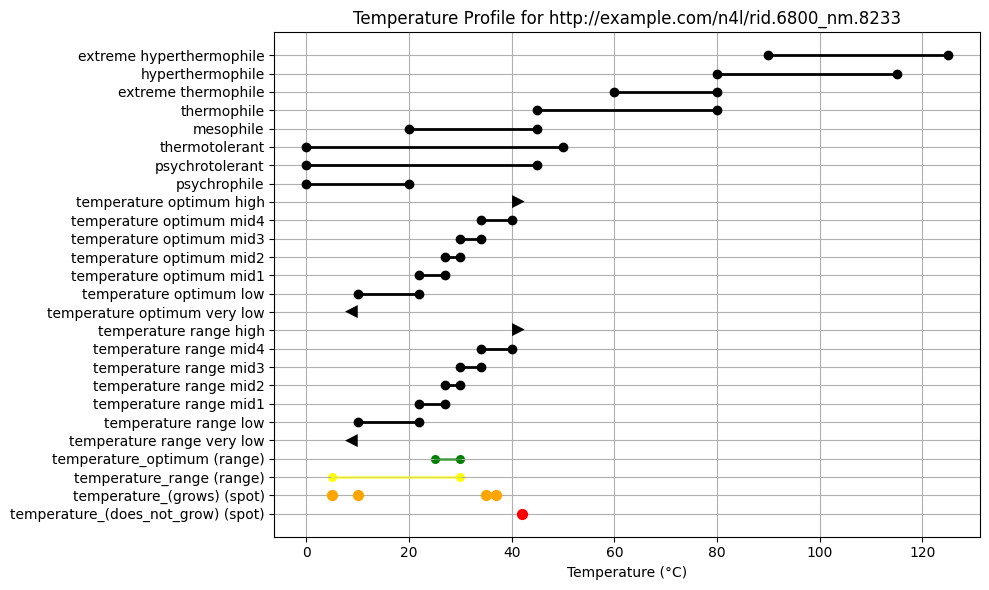


🟡 Partial matches for rid.6800, nm.8233:
   - rid.6800_nm.8222.xml
   - rid.6800_nm.8232.xml
   - rid.6800_nm.8234.xml
   - rid.6800_nm.8237.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Sphingobacteriaceae</i>
       fam. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      Descriptive information for the family is taken from the literature (1, 3, 5,9, 12, 17, 28, 32) and the present paper. Organisms belonging to the family are Gramnegative. Cells are short to relatively long rods and are usually 0.3-0.6 μm wide and 0.5-6 μm long (except [
      <i>Flexibacter</i>
      ] 
      <i>canadensis</i>
       which is filamentous) and are non-sporulating. Flagella are absent. Non-motile or motile by gliding. Aerobic growth with optimum temperature in a range of 10-30 °C ([
      <i>Flexibacter</i>
      ] 
      <i>canadensis</i>
       also grows as a facultative anaer

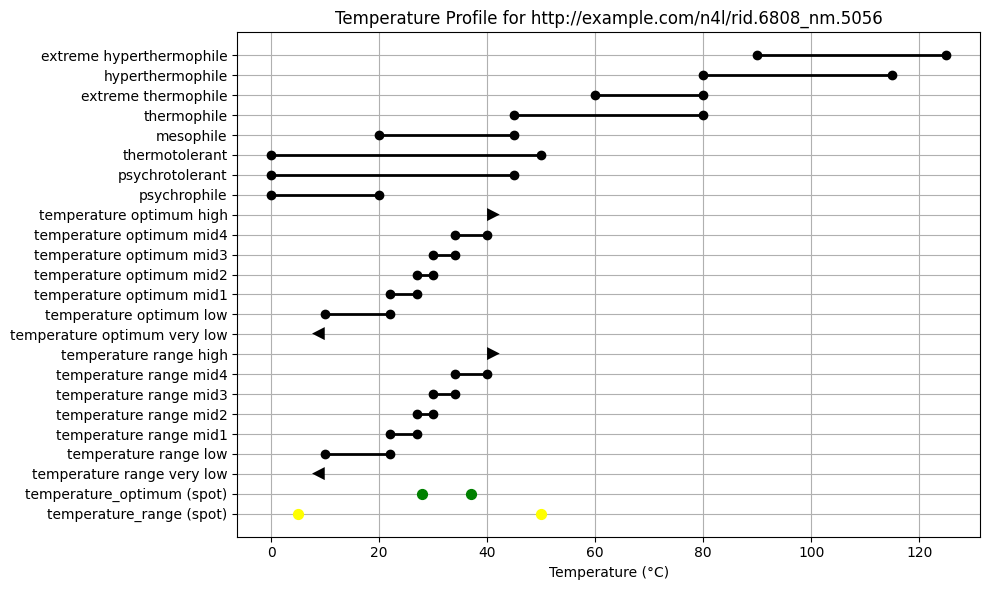


🟡 Partial matches for rid.6808, nm.5056:
   - rid.6808_nm.5034.xml
   - rid.6808_nm.5035.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Gracilibacillus</i>
       gen. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Gracilibacillus</i>
       (Gra.ci.li.ba.cil'lus. L. adj. 
      <i>gracilis</i>
       slender; Gr. n. 
      <i>baktron</i>
       rod; M.L. masc. 
      <i>Gracilibacillus</i>
       the slender bacillus/rod)
    </s>
  </p>
  <p class="description">
    <s>Gram-positive, motile, spore-forming rods or filaments.</s>
    <s>Endospores are terminal and swell the sporangia.</s>
    <s>Colonies are circular.</s>
    <s>Chemo-organotrophic.</s>
    <s>Grows on glucose, mannitol and sucrose.</s>
    <s>Requires yeast extract for growth.</s>
    <s>Catalase- and oxidase-positive.</s>
    <s>Nitrate is reduced to nitrite.</s>
    <s>Voges-Proskauer te

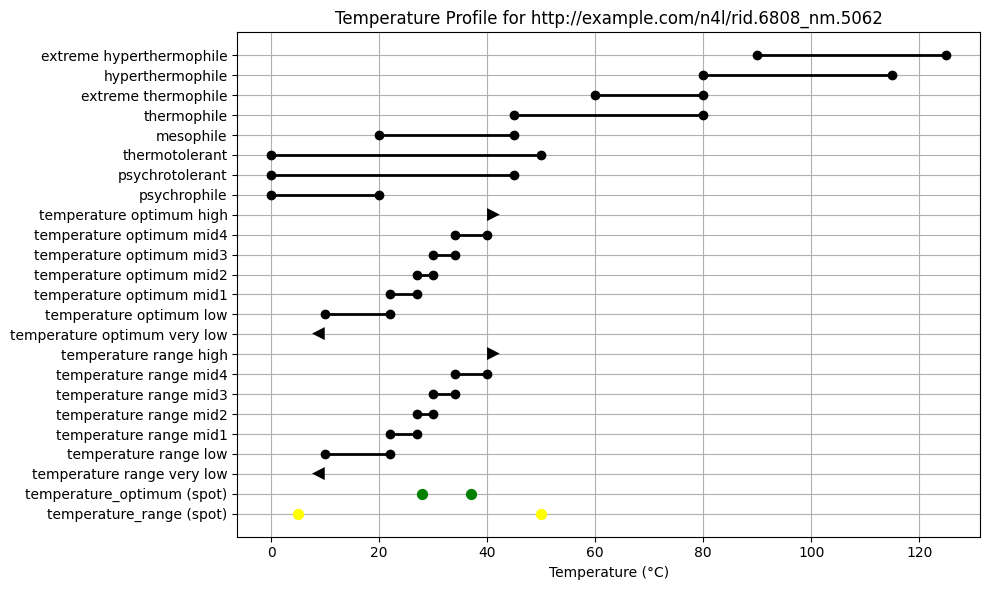


🟡 Partial matches for rid.6808, nm.5062:
   - rid.2755_nm.5062.xml
   - rid.6808_nm.5034.xml
   - rid.6808_nm.5035.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of the genus 
      <em>Virgibacillus</em>
       Heyndrickx 
      <em>et al.</em>
       1998
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Virgibacillus</em>
       (Vir.gi.ba.cil′lus. L. n. 
      <em>virga</em>
       a green twig, transf., a branch in a family tree; L. dim. n. 
      <em>bacillus</em>
       from 
      <em>Bacillus</em>
      , a genus of aerobic endospore-forming bacteria; N.L. n. 
      <em>Virgibacillus</em>
       a branch of the genus 
      <em>Bacillus</em>
      ).
    </s>
  </p>
  <p class="description">
    <s>Cells are motile, Gram-positive rods (0·3–0·7×2–6 μm) that occur singly, in pairs or short chains or filaments.</s>
    <s>They bear oval to ellipsoidal endospores 

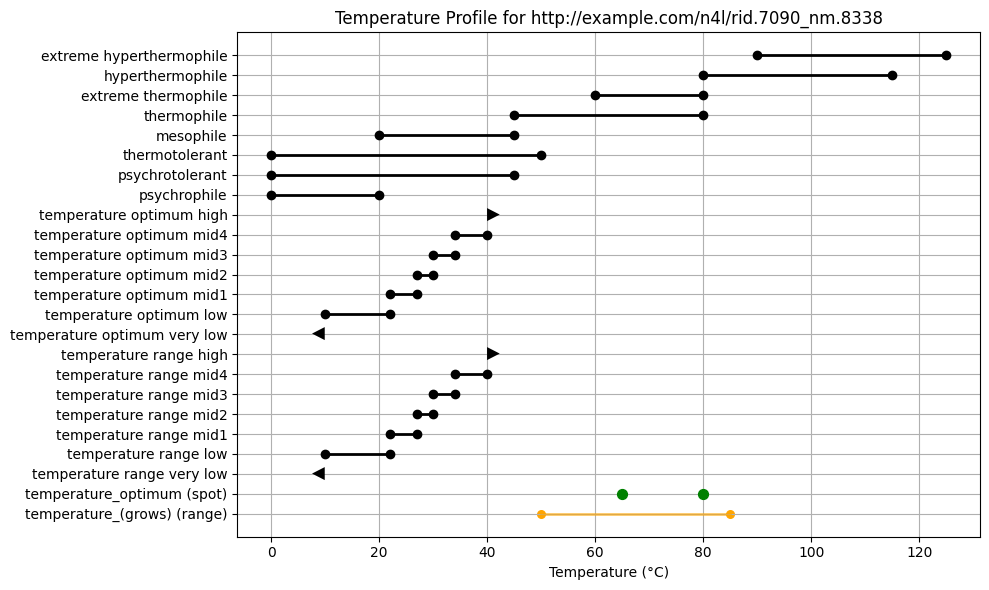


✅ Exact match: rid.7090_nm.8338.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Rhodothermus obamensis</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Rhodothermus obamensis</i>
       (o.bam'en.sis. L. gen. n. 
      <i>obamensis</i>
      , of Obama, a hot spring in Japan)
    </s>
  </p>
  <p class="description">
    <s>Cells are gram-negative, straight rods that are about 4 to 10 μm long and 0.5 to 1.0 μm wide and occur singly and in aggregates; they are extremely long during the stationary growth phase.</s>
    <s>Colonies are reddish and 1 to 2 mm in diameter with entire edges.</s>
    <s>Aerobic, thermophilic, neutrophilic heterotroph.</s>
    <s>Growth occurs at temperatures between 50 and 85°C (optimum temperature, 80°C), at pH 5.5 and 9.0 (optimum pH, 7.0), and in the presence of 1 to 5% NaCl (optimum NaCl concentration, 3%).</s>
    

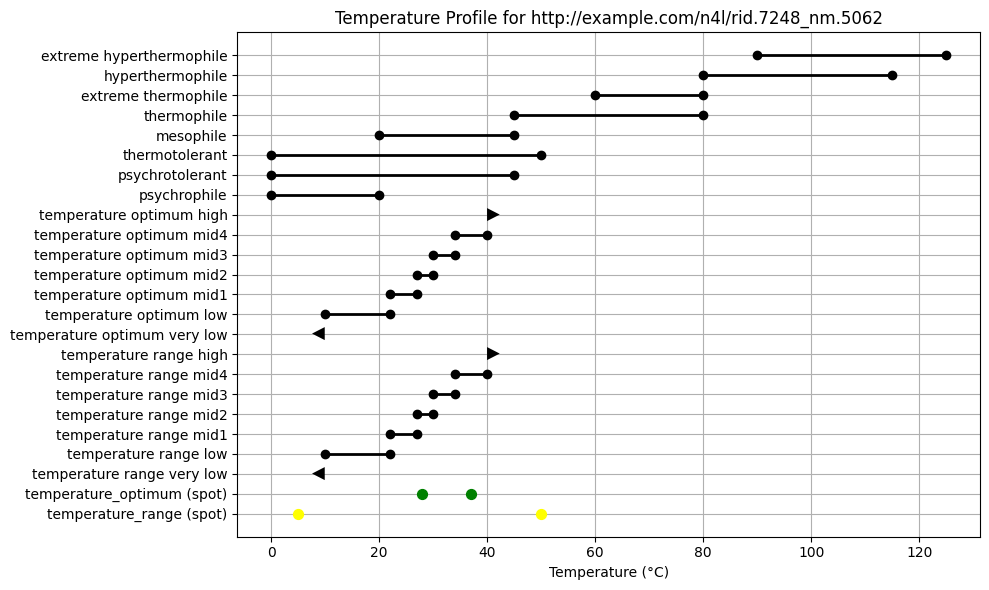


🟡 Partial matches for rid.7248, nm.5062:
   - rid.2755_nm.5062.xml
   - rid.7248_nm.5063.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Emended description of the genus 
      <em>Virgibacillus</em>
       Heyndrickx 
      <em>et al.</em>
       1998
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Virgibacillus</em>
       (Vir.gi.ba.cil′lus. L. n. 
      <em>virga</em>
       a green twig, transf., a branch in a family tree; L. dim. n. 
      <em>bacillus</em>
       from 
      <em>Bacillus</em>
      , a genus of aerobic endospore-forming bacteria; N.L. n. 
      <em>Virgibacillus</em>
       a branch of the genus 
      <em>Bacillus</em>
      ).
    </s>
  </p>
  <p class="description">
    <s>Cells are motile, Gram-positive rods (0·3–0·7×2–6 μm) that occur singly, in pairs or short chains or filaments.</s>
    <s>They bear oval to ellipsoidal endospores that lie in swollen sporan

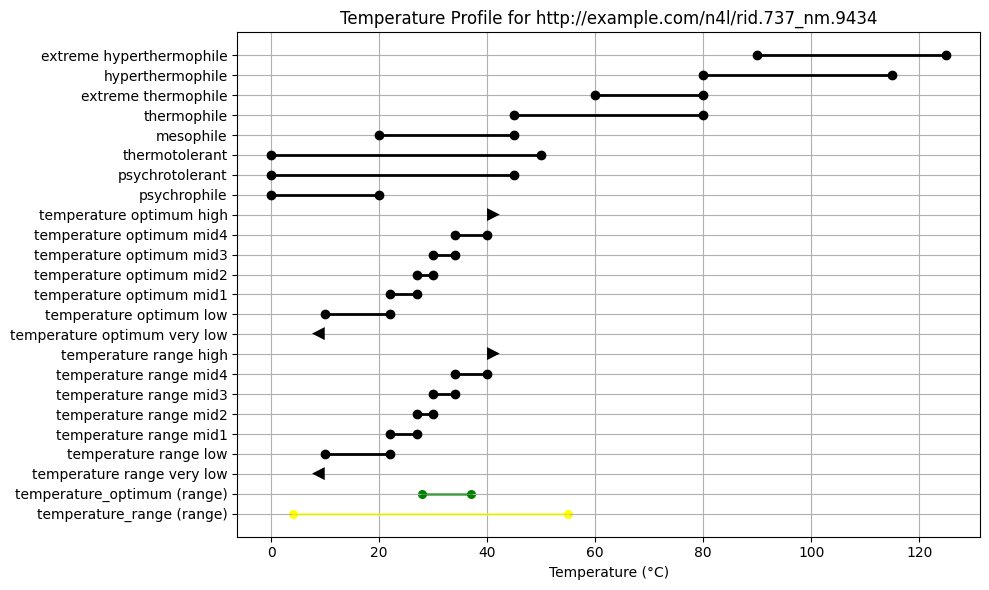


✅ Exact match: rid.737_nm.9434.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Naxibacter alkalitolerans</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Naxibacter alkalitolerans</em>
       (al.ka.li.to′le.rans. Arabic article 
      <em>al</em>
       the; Arabic n. 
      <em>qaliy</em>
       ashes of saltwort; French n. 
      <em>alcali</em>
       alkali; N.L. n. 
      <em>alkali</em>
       alkali; L. part. adj. 
      <em>tolerans</em>
       tolerating; N.L. part. adj. 
      <em>alkalitolerans</em>
       alkali-tolerating).
    </s>
  </p>
  <p class="description">
    <s>In addition to the characteristics that define the genus, the species has the characteristics described below.</s>
    <s>Colonies are 1·1–1·4 mm in diameter, circular, entire, convex, glistening, butyraceous, opaque and with pale white–yellow to straw-colour o

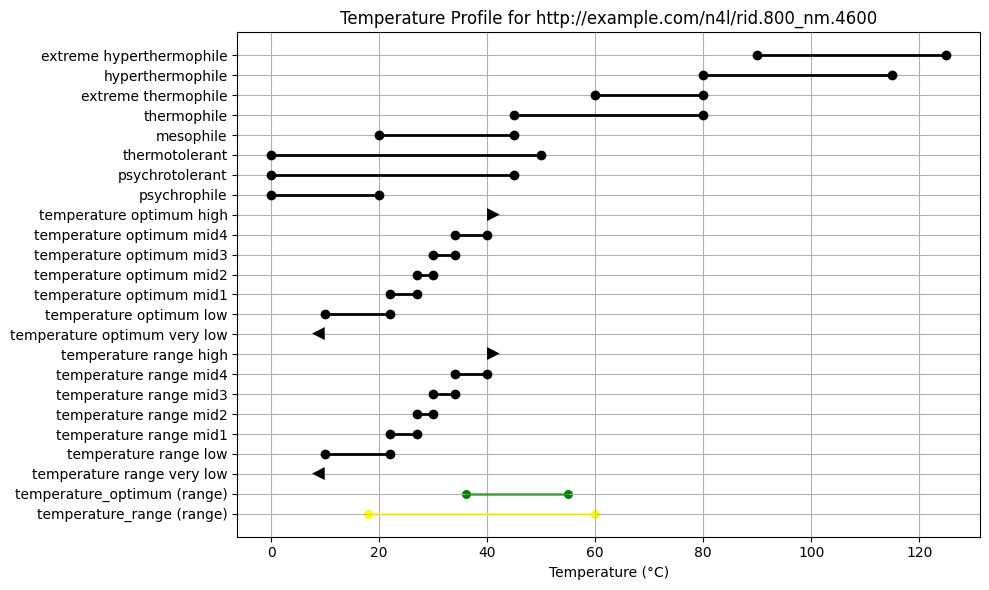


✅ Exact match: rid.800_nm.4600.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <i>Halonatronum saccharophilum</i>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <i>Halonatronum saccharophilum</i>
       (Sac.cha.ro.philum. From Gr. n. 
      <i>sacchar</i>
      , sugar and Gr. adj. 
      <i>philus</i>
      , liking. A sugar-liking organism.
    </s>
  </p>
  <p class="description">
    <s>Slender flexible rods, 0.4–0.6 × 3.5−10 μm in young cultures; long thickened degenerate cells, spheroplasts, and spores are characteristic of aging cultures.</s>
    <s>Spores are round, terminal, thermostable, of the plectridial type.</s>
    <s>The cell wall is characterized by a gram-negative structural pattern.</s>
    <s>Cells are motile by means of peritrichous flagella.</s>
  </p>
  <p class="description">
    <s>A moderate haloalkaliphile obligatorily requir

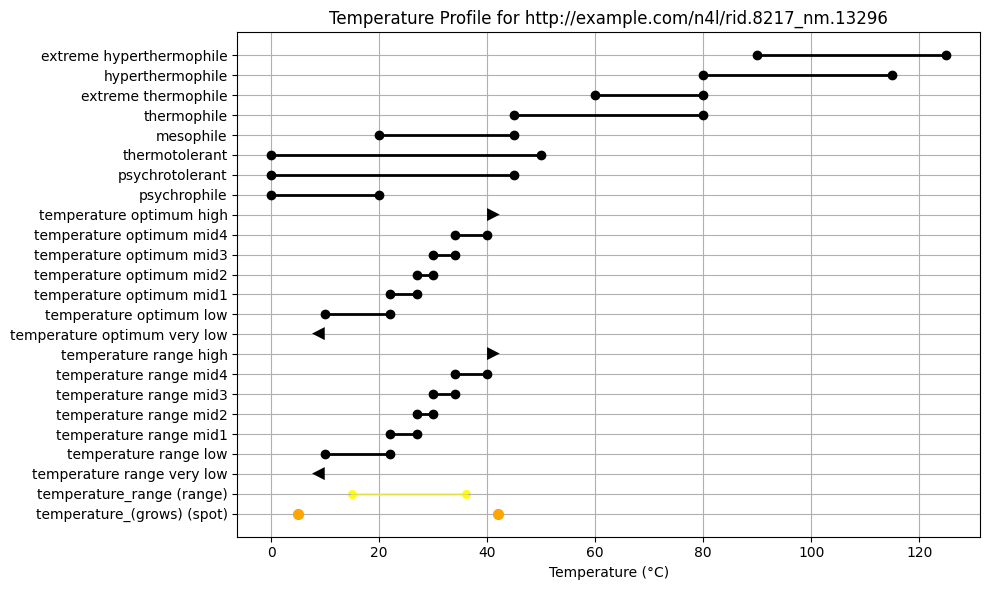


✅ Exact match: rid.8217_nm.13296.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Deinococcus aquatilis</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Deinococcus aquatilis</em>
       (a.qua.ti′lis. L. masc. adj. 
      <em>aquatilis</em>
       living in water).
    </s>
  </p>
  <p class="description">
    <s>Cells stain Gram-positive and are non-motile, non-spore-forming rods.</s>
    <s>Aerobic and oxidase-positive.</s>
    <s>Good growth after 48 h on R2A agar, nutrient agar and tryptic soy agar at 15–36 °C.</s>
    <s>Colonies on nutrient agar are smooth, pale pinkish, circular, translucent and shiny with entire edges, becoming mucoid.</s>
    <s>Unable to grow at 5 or 42 °C.</s>
    <s>Growth occurs at pH 5.5–11.</s>
    <s>
      Major cellular fatty acids are C
      <sub>16 : 1</sub>
      <em>ω</em>
      7
      <em>c</em>
     

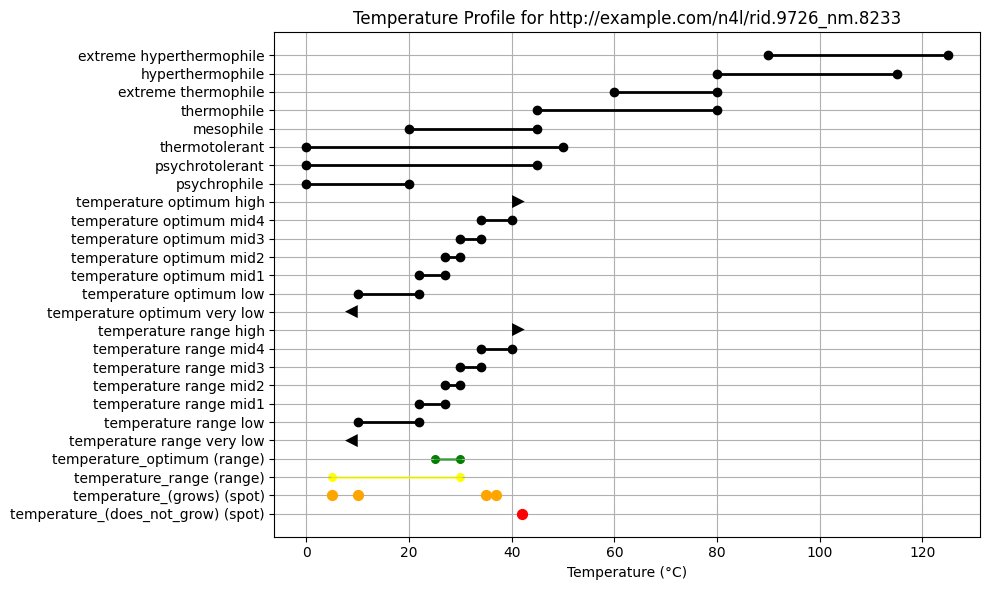


(no protolog XML found)
## http://example.com/n4l/rid.9727_nm.10206
  - Reference ID: rid.9727
  - Taxon Name ID: nm.10206
  - Intra Conflict Score: 9.8
  - Inter Conflict Score: 0


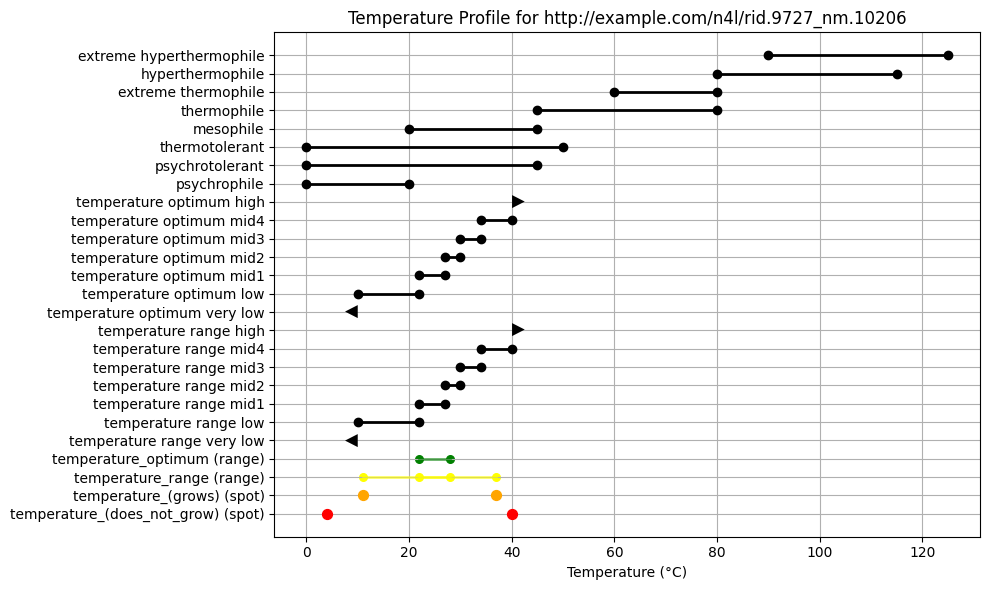


🟡 Partial matches for rid.9727, nm.10206:
   - rid.6074_nm.10206.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Catenulispora acidiphila</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Catenulispora acidiphila</em>
       (a.ci.di′phi.la. N.L. neut. n. 
      <em>acidum</em>
       acid; Gr. adj. 
      <em>philos</em>
       loving; N.L. fem. adj. 
      <em>acidiphila</em>
       acid-loving).
    </s>
  </p>
  <p class="description">
    <s>Chemotaxonomic and general characteristics are the same as given above for the genus.</s>
    <s>Acidophilic: grows well in a pH range from 4.3 to 6.8, optimal around 6.0.</s>
    <s>Mesophilic: best growth occurs at 22–28 °C, but significant growth can also be observed at 11 and 37 °C; no growth occurs at 4 or 40 °C.</s>
    <s>Aerial hyphae are relatively short, straight to flexuous and produce chai

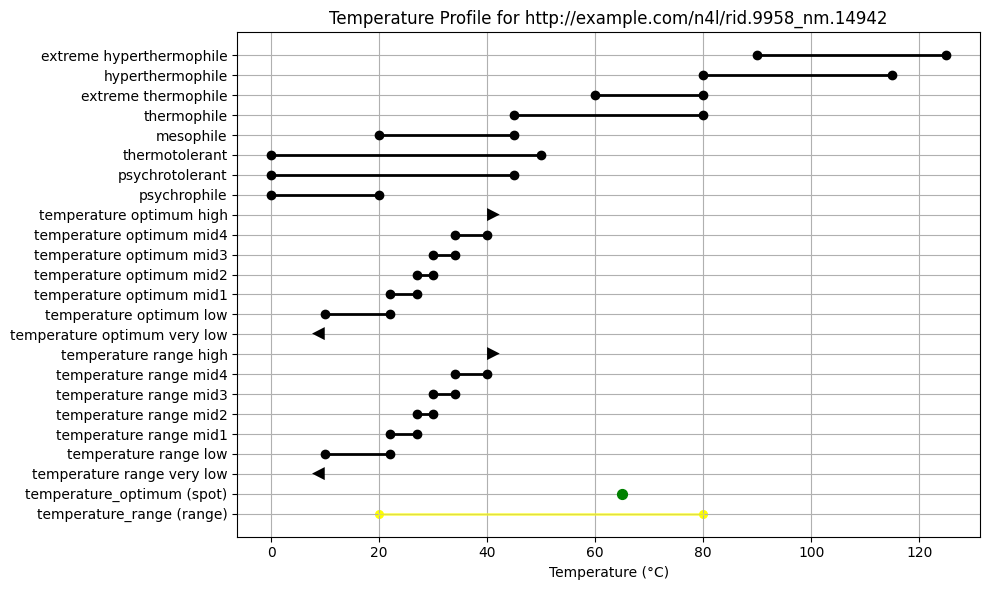


✅ Exact match: rid.9958_nm.14942.xml

--- Protolog XML ---
<?xml version="1.0" ?>
<content xmlns="http://namesforlife.com/ns/protolog">
  <p class="title">
    <s>
      Description of 
      <em>Kosmotoga olearia</em>
       sp. nov.
    </s>
  </p>
  <p class="etymology">
    <s>
      <em>Kosmotoga olearia</em>
       (o.le.a′ri.a. L. fem. adj. 
      <em>olearia</em>
       of or belonging to oil, describing the environment from which the type strain was isolated).
    </s>
  </p>
  <p class="description">
    <s>Displays the following properties in addition to those given for the genus.</s>
    <s>Cells are approximately 0.4–0.7 μm wide and 0.8–1.2 μm long, with one to three cells per sheath (toga).</s>
    <s>Rarely found in chains or aggregations of up to 50 cells.</s>
    <s>Spherical forms appear in stationary phase.</s>
    <s>Motile forms and flagella are not observed.</s>
    <s>Colonies grown on TBFXP 1 % (w/v) Gelrite bottle plates with maltose at 65 °C are 0.5–2.5 mm in

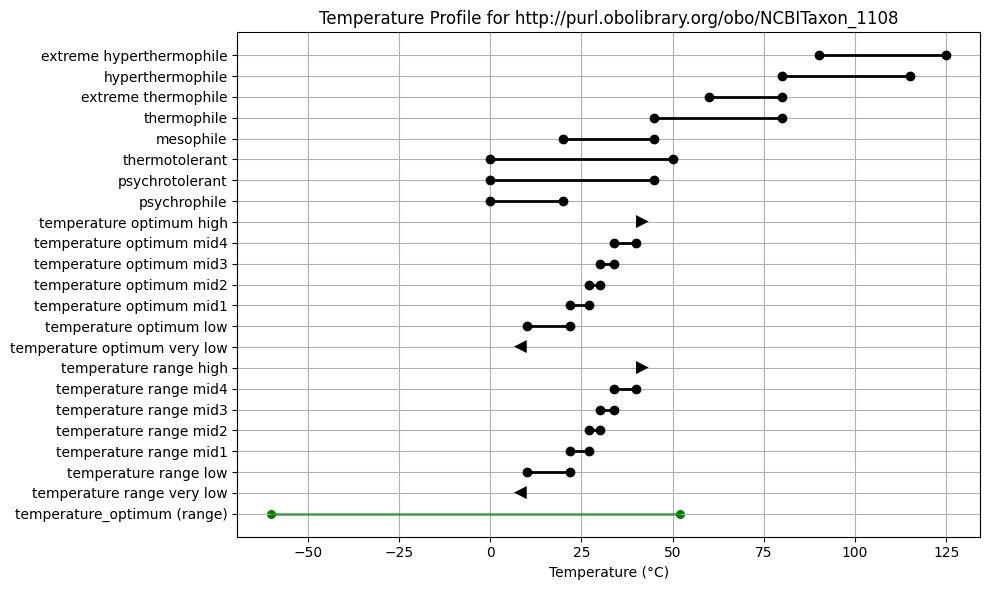


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_136094
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 15.4
  - Inter Conflict Score: 0


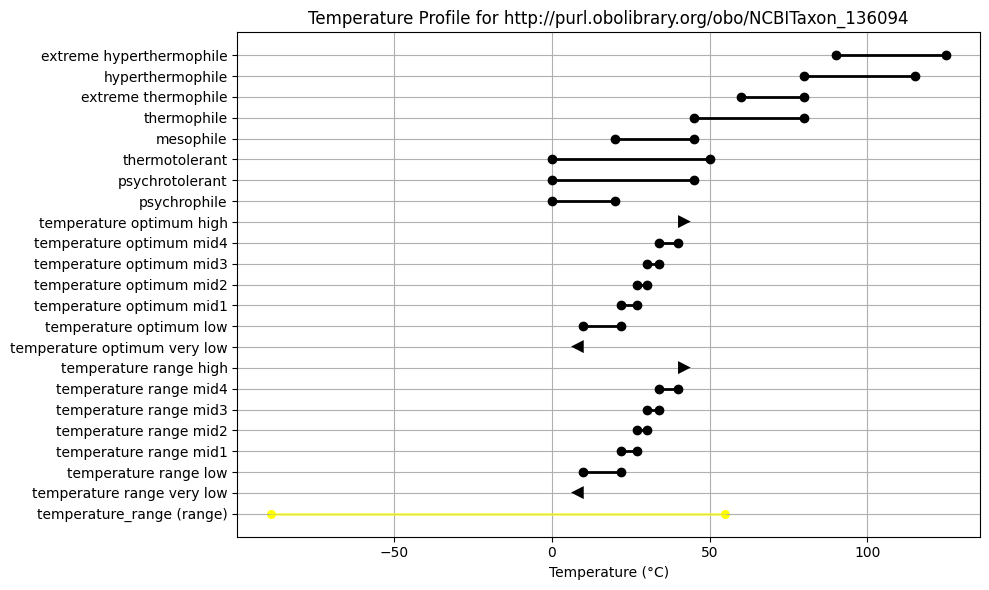


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_150060
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.1
  - Inter Conflict Score: 0


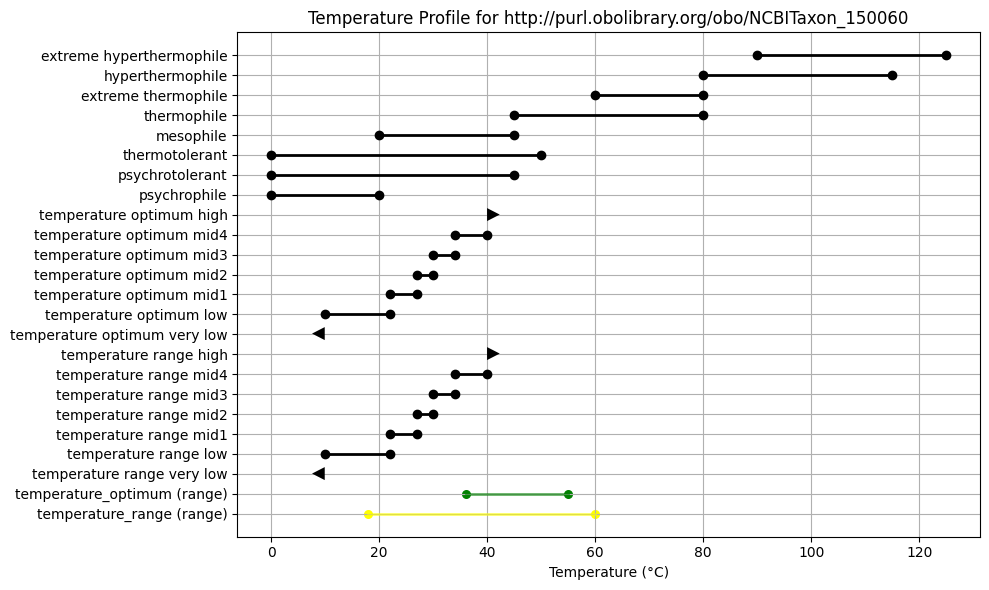


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_157784
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 10.1
  - Inter Conflict Score: 0


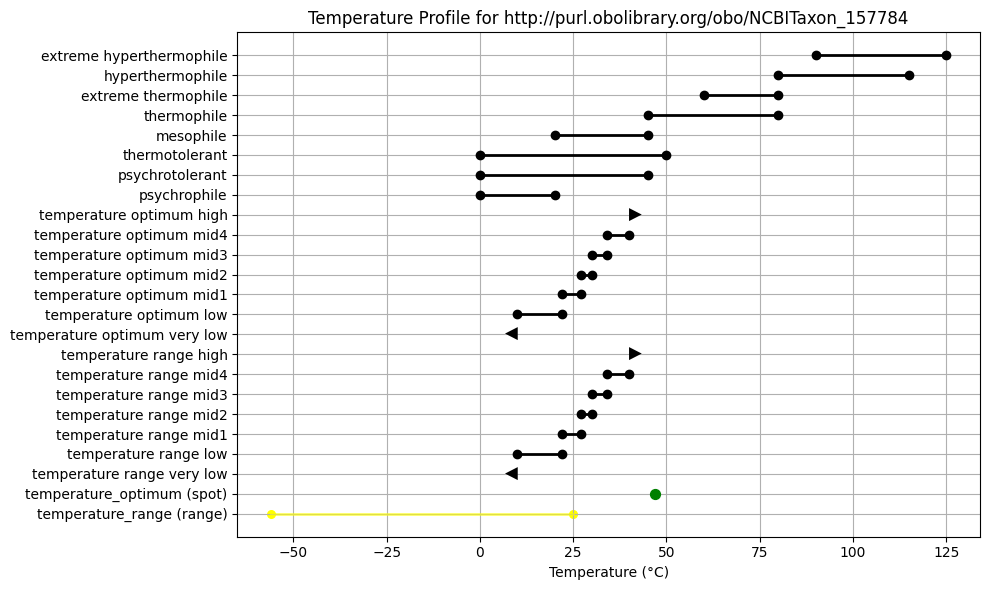


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_168471
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 3.7
  - Inter Conflict Score: 1


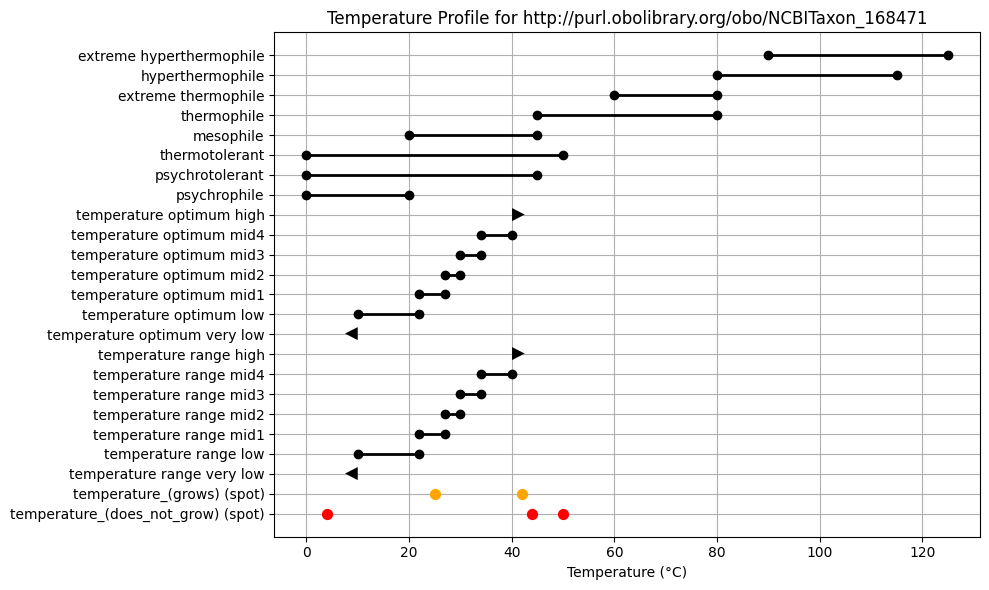


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_1692
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 9.299999999999999
  - Inter Conflict Score: 0


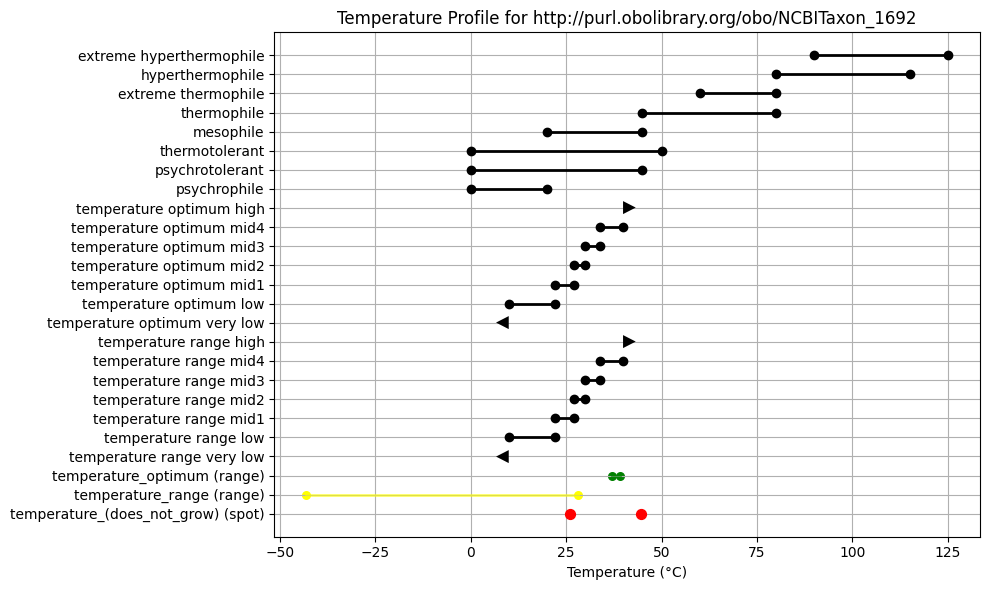


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_184064
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 15.8
  - Inter Conflict Score: 0


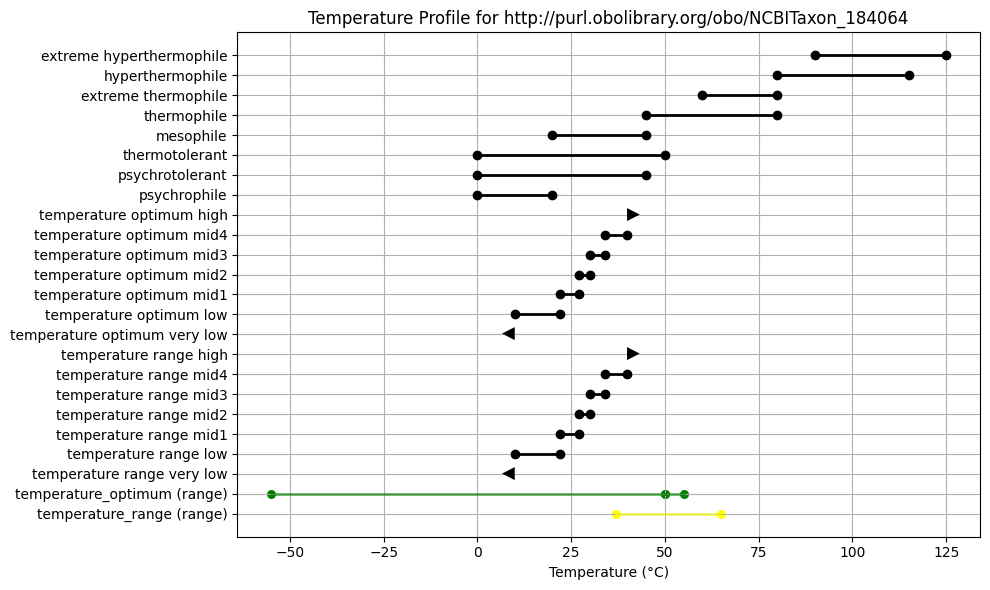


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_259
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 6.4
  - Inter Conflict Score: 1


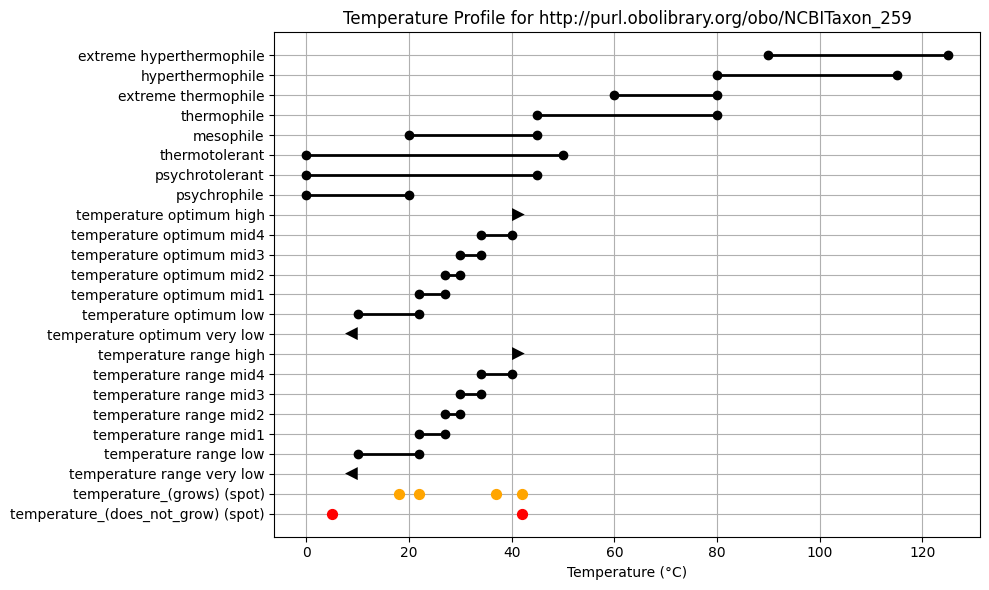


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_28199
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.7
  - Inter Conflict Score: 0


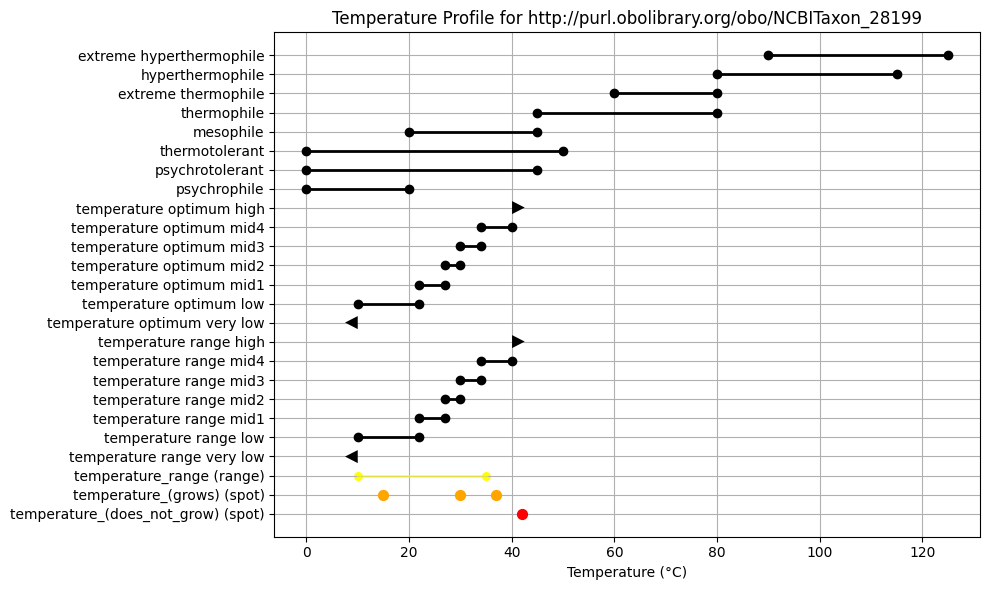


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_286638
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.0
  - Inter Conflict Score: 0


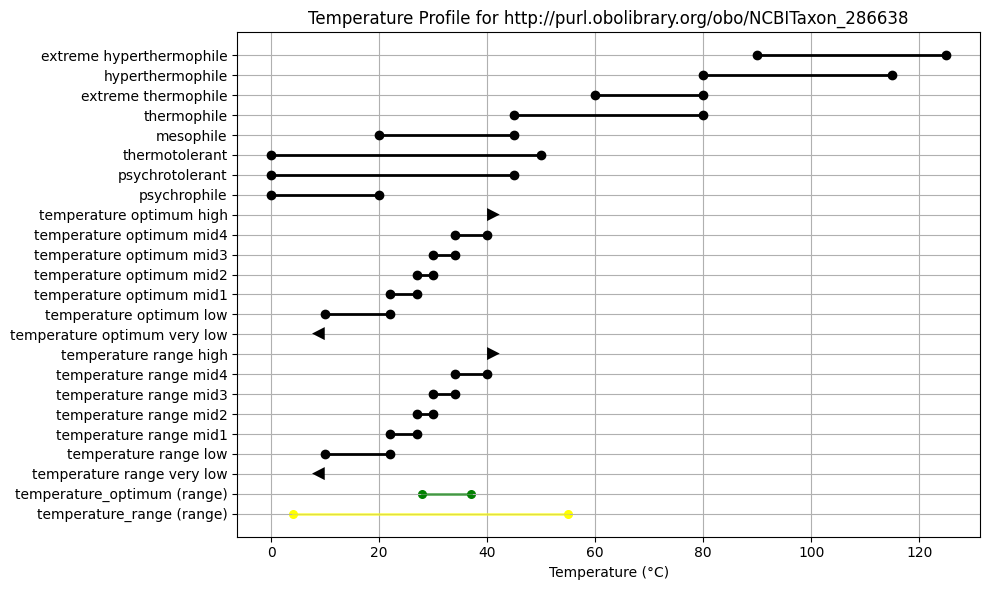


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_29323
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.5
  - Inter Conflict Score: 0


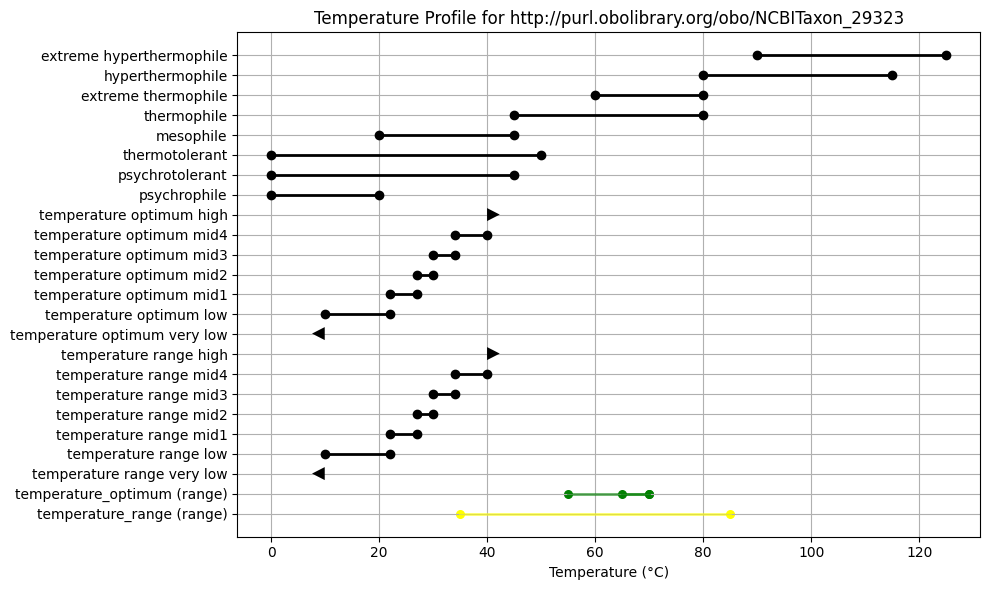


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_29549
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.0
  - Inter Conflict Score: 0


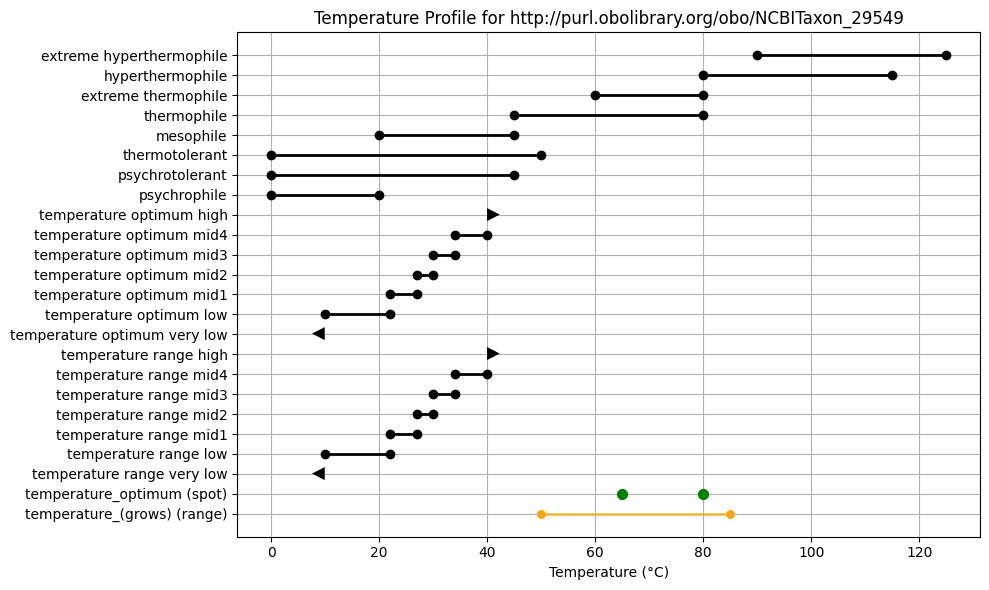


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_304895
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 9.8
  - Inter Conflict Score: 0


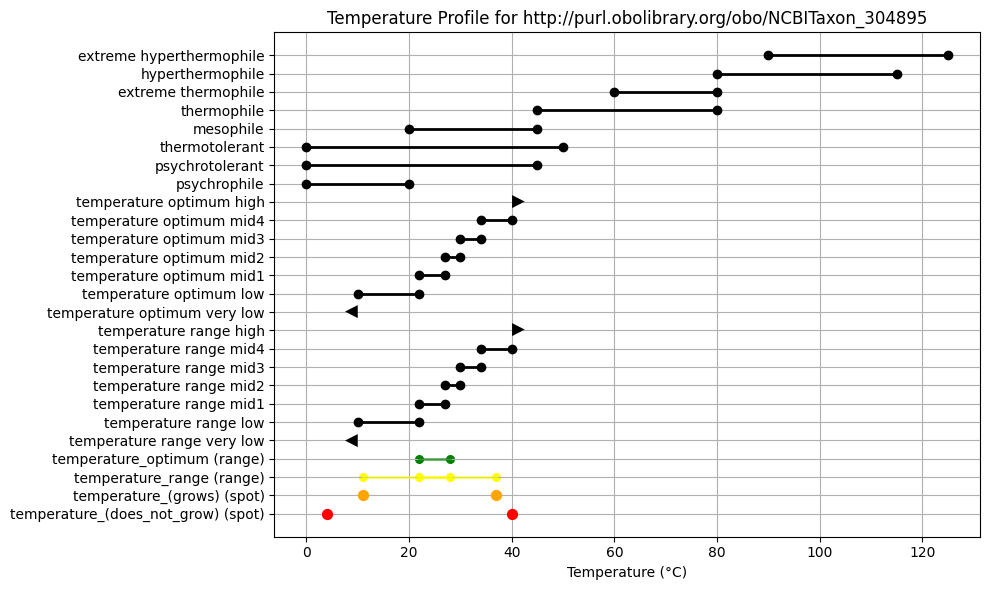


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_309887
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 12.0
  - Inter Conflict Score: 0


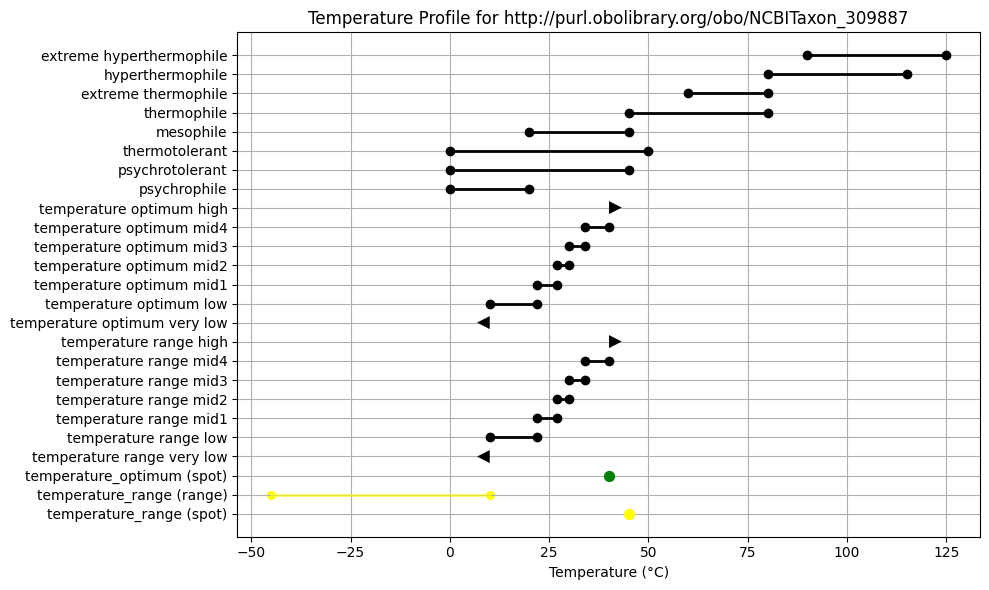


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_311194
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.0
  - Inter Conflict Score: 0


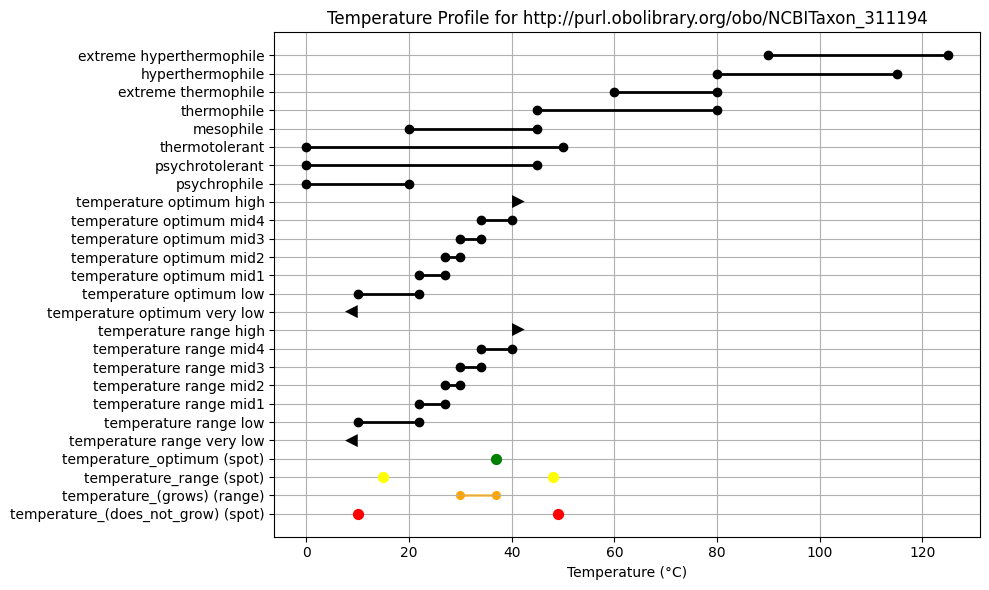


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_344884
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 5.6
  - Inter Conflict Score: 1


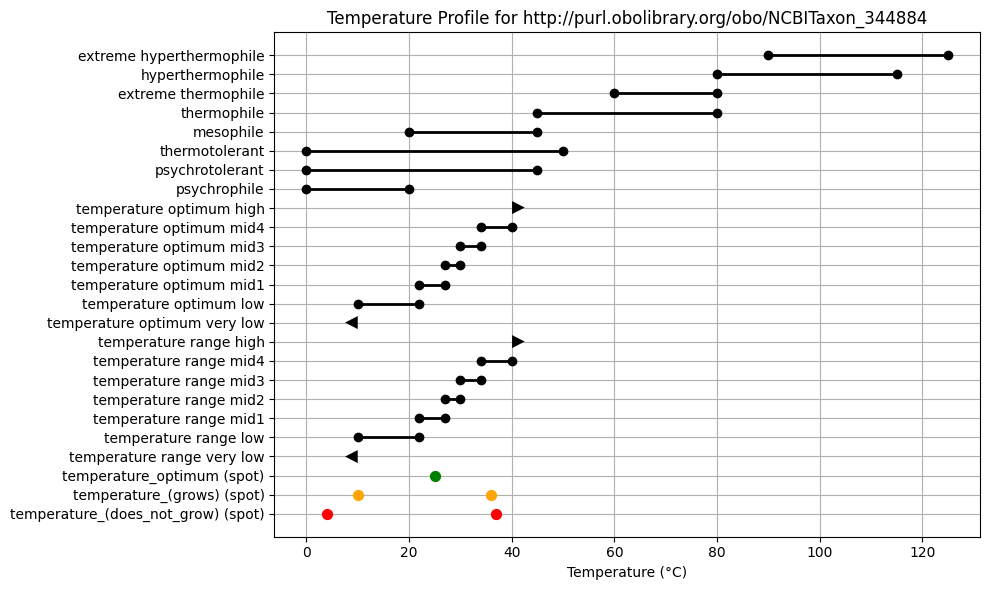


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_435905
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 5.8
  - Inter Conflict Score: 1


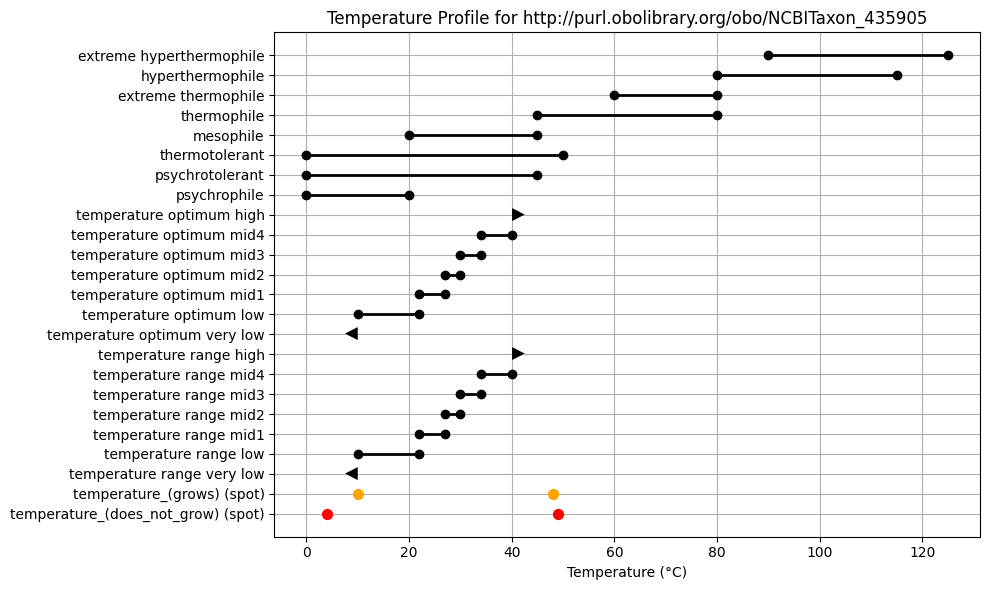


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_435906
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 6.7
  - Inter Conflict Score: 1


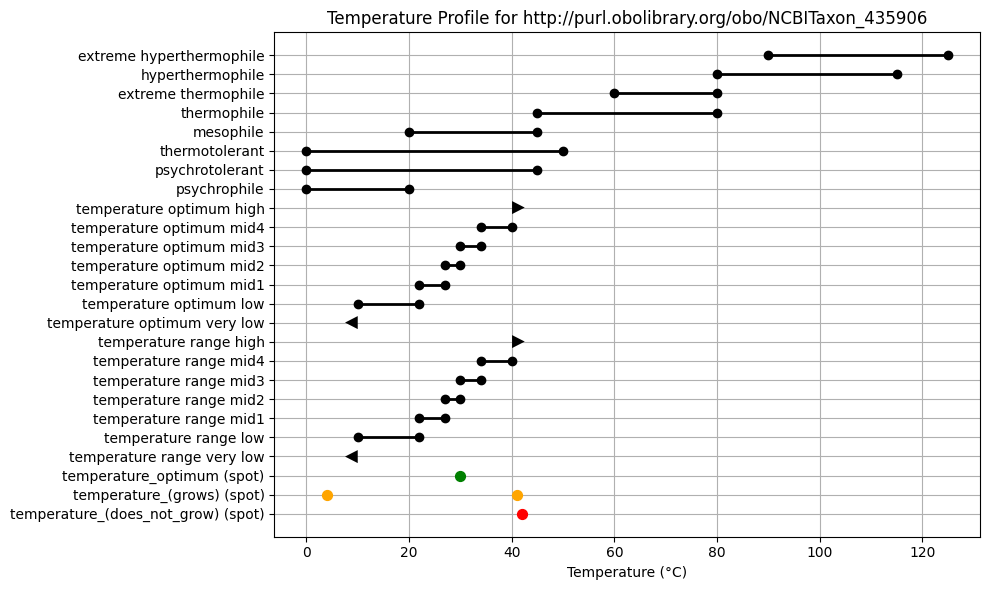


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_44012
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 1.0
  - Inter Conflict Score: 1


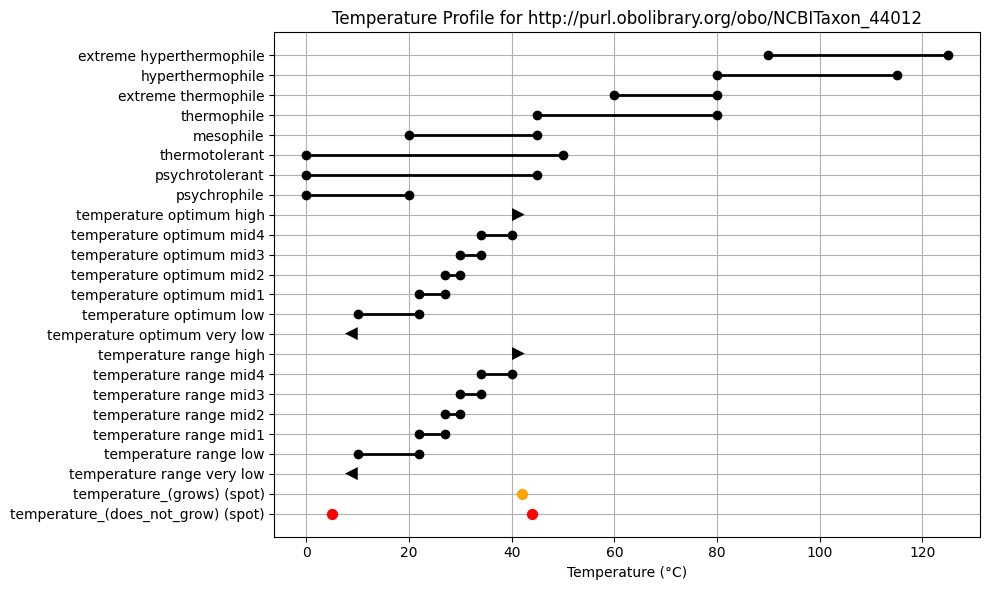


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_519440
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.8
  - Inter Conflict Score: 0


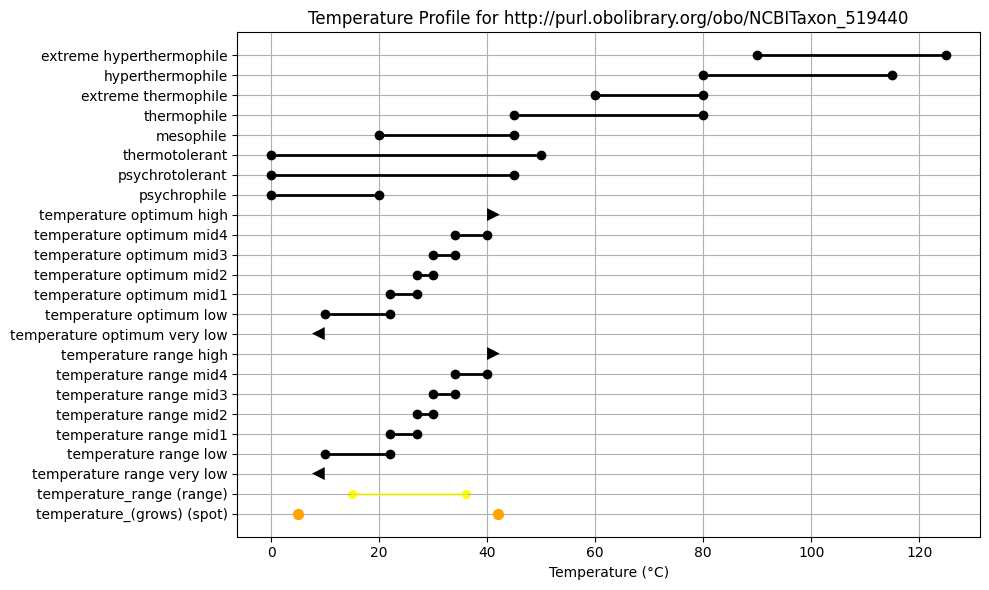


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_53407
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 10.7
  - Inter Conflict Score: 0


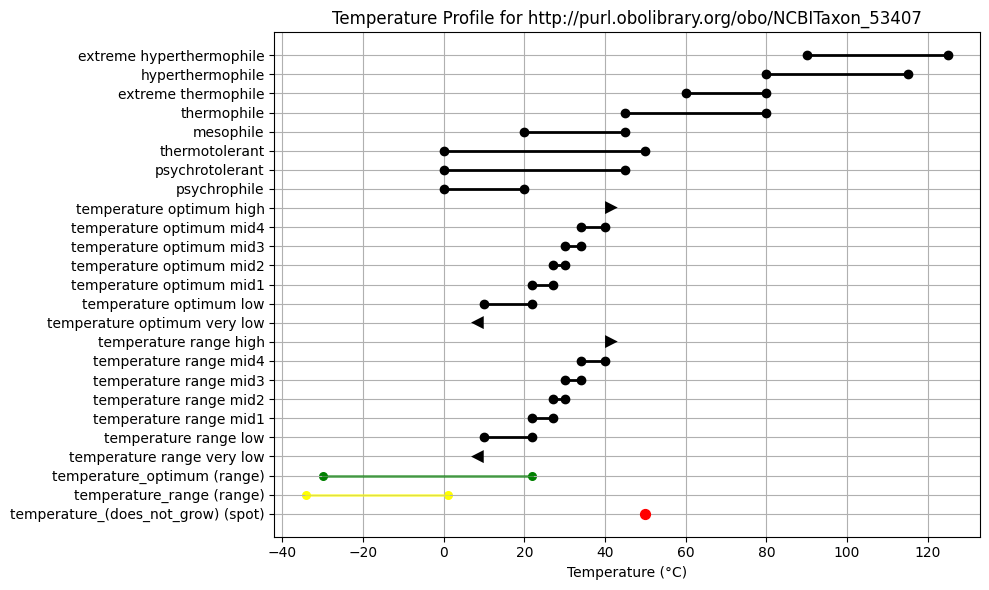


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_651457
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 8.0
  - Inter Conflict Score: 0


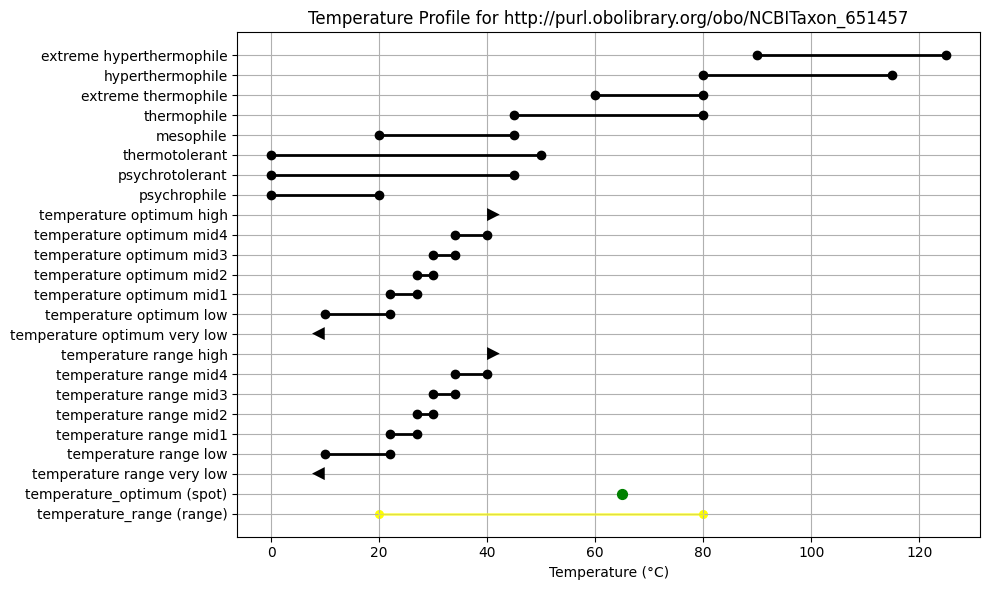


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_84406
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 9.4
  - Inter Conflict Score: 0


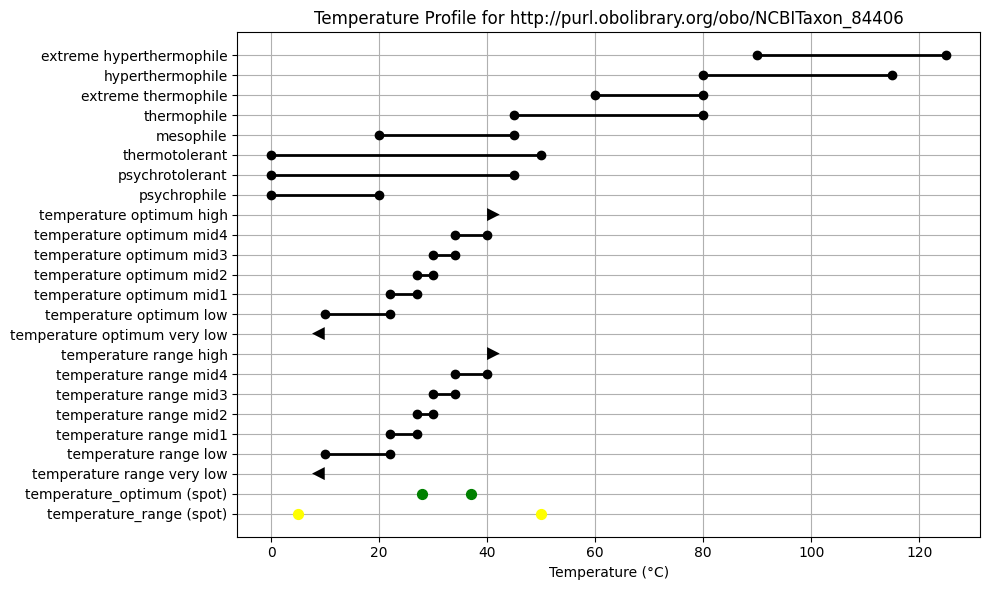


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_88190
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 15.0
  - Inter Conflict Score: 0


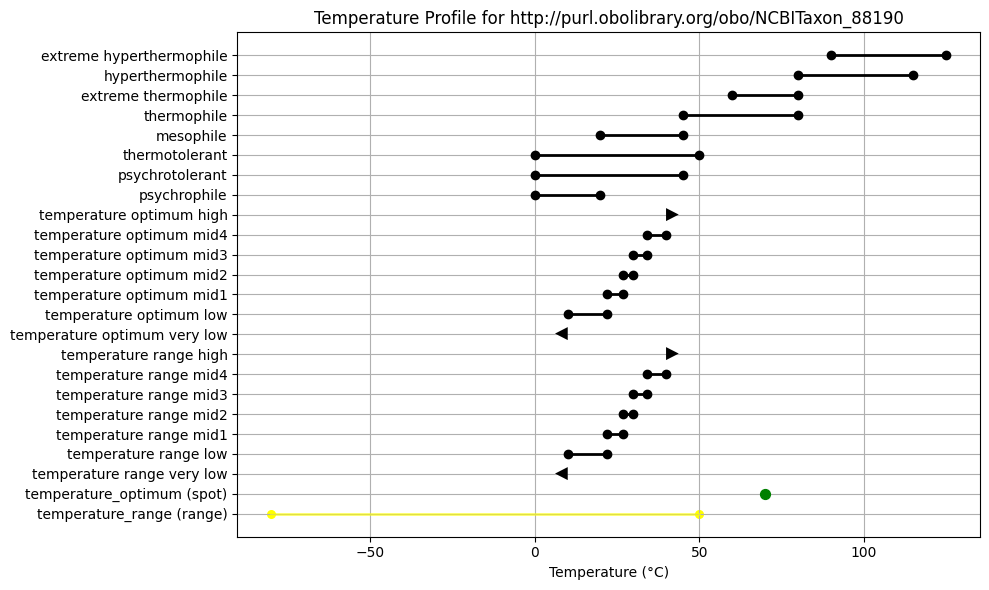


(no protolog XML found)
## http://purl.obolibrary.org/obo/NCBITaxon_984
  - Reference ID: ?
  - Taxon Name ID: ?
  - Intra Conflict Score: 11.2
  - Inter Conflict Score: 0


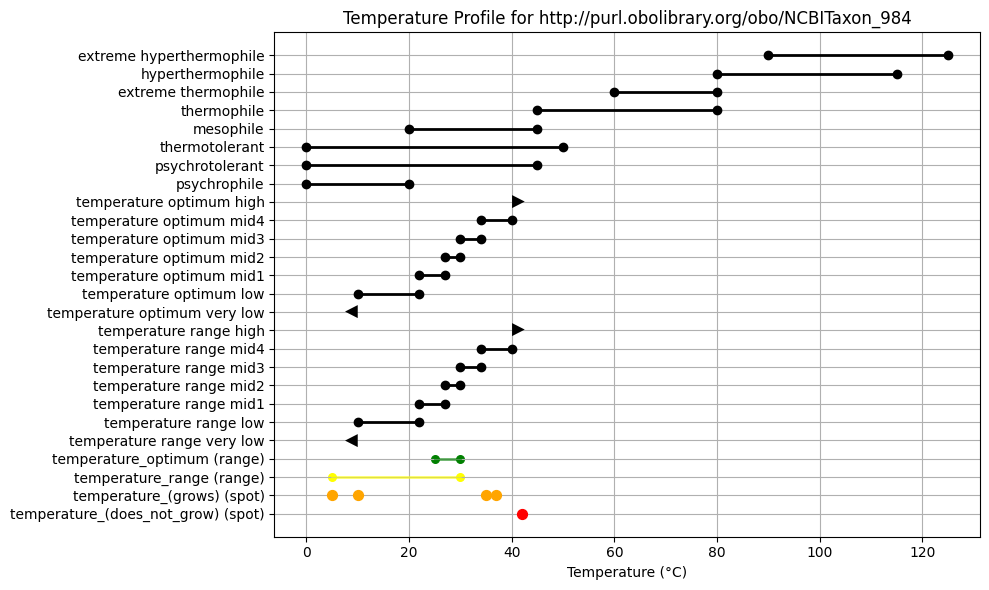


(no protolog XML found)


In [40]:
for _, row in high_conflict_df.iterrows():
    display_subject_protolog(
        subject_iri=row["subject"],
        intra_score=row["intra_conflict_score"],
        inter_score=row["inter_conflict_score"],
        observations_df=observations_df,
        classes_df=classes_df
    )


# 📊 Key DataFrames Created in `categorize_temperature_ranges.ipynb`

This notebook processes structured temperature phenotype data and creates several intermediate and final DataFrames. Below is a categorized summary of all major DataFrames that may be useful to save or reuse.

---

## ✅ Primary Inputs

### `observations_df`
- **Source**: `../assets/flattened_n4l_temperature_components_manually_filtered_quantitative.tsv`
- **Description**: Raw temperature-related annotations from N4L.
- **Columns**:
  `subject`, `predicate`, `minimum_value`, `maximum_value`, `spot_value`, etc.

### `classes_df`
- **Source**: `../assets/metpo-temperature-ranges-of-classes.csv`
- **Description**: Definitions of temperature class boundaries.
- **Columns**:
  `class_iri`, `class_label`, `class_min`, `class_max`

---

## 🧮 Intermediate & Analytical Outputs

### `summary`
- **Description**: Observation and predicate counts per subject.
- **Columns**:
  `subject`, `observation_count`, `predicate_count`, `magnitude`

### `assignments`
- **Description**: Per-subject temperature class assignment results.
- **Columns**:
  `subject`, `class_label`, `class_iri`, `assignment` (`match` or `excluded`),
  `source_range`, `class_range`, `overlap_fraction`, `class_span`, `class_group`

### `temperature_conflicts`
- **Description**: Per-subject intra- and inter-predicate conflict diagnostics.
- **Columns**:
  - `[predicate]_spread`
  - `[predicate]_clusters`
  - `intra_conflict_score`
  - `inter_conflict_score`
  - `conflict_notes`

### `full_summary`
- **Description**: Merge of `summary` and `temperature_conflicts`.
- **Use**: Ideal for export, scoring, or dashboarding.
- **Columns**: All of `summary` + `temperature_conflicts`

### `high_conflict_df`
- **Description**: Subset of `full_summary` with high conflict scores.
- **Filter Logic**:
  `intra_conflict_score >= 8 or inter_conflict_score >= 1`

---

## 📎 Optional Outputs

### Per-subject Plots
- **Generated by**: `plot_temperature_profile(subject_id, ...)`
- **Use**: Diagnostic visualizations (not saved automatically).

### Protolog Debug Info
- **Generated by**: `display_subject_protolog(...)`
- **Use**: XML snippets and alignment evidence for selected high-conflict subjects.


In [41]:
full_summary.to_csv(summary_tsv, sep="\t", index=False)

In [42]:
assignments.to_csv(output_tsv, sep="\t", index=False)